In [1]:
# import librarbies

In [87]:
!pip install squarify


Defaulting to user installation because normal site-packages is not writeable


In [88]:
!pip install lightgbm


Defaulting to user installation because normal site-packages is not writeable


In [89]:
!pip install xgboost


Defaulting to user installation because normal site-packages is not writeable


In [96]:
!pip install catboost


Defaulting to user installation because normal site-packages is not writeable


In [97]:
!pip install shap


Defaulting to user installation because normal site-packages is not writeable


In [98]:
import warnings  
warnings.filterwarnings("ignore")  

import pandas as pd  
import numpy as np  
import matplotlib.pyplot as plt  
import matplotlib.cm as cm  
import seaborn as sns  
import squarify  
import plotly.express as px  
import plotly.io as pio  
pio.renderers.default = 'iframe'  
from IPython.display import display

from sklearn.model_selection import train_test_split  
from sklearn.preprocessing import StandardScaler, label_binarize  
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier  
from sklearn.linear_model import LogisticRegression  
from lightgbm import LGBMClassifier  
from catboost import CatBoostClassifier  
from sklearn.metrics import (  
    accuracy_score, roc_auc_score, classification_report,  
    confusion_matrix, roc_curve, auc  
)  

import shap  

In [99]:
# Data loading and Initial Exploration

In [100]:
# Load the dataset
df = pd.read_csv('C:/Users/jmskaria/Downloads/expanded_sleep_health_dataset.csv')



In [101]:
# Display shape of the dataset
print("Shape of the dataset:\n", df.shape)
display(df.head())

Shape of the dataset:
 (1500, 13)


,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder
0,1,Male,41,Nurse,7.0,5,91,10,Normal,111/71.15,56,9476,NaN
1,2,Male,42,Software Engineer,6.7,7,123,5,Overweight,129/85.85000000000001,67,10661,NaN
2,3,Female,45,Doctor,8.7,4,49,7,Normal,119/79.35000000000001,60,5033,NaN
3,4,Male,24,Writer,8.0,6,4,5,Normal,98/62.7,97,1610,NaN
4,5,Female,18,Salesperson,8.8,6,66,4,Overweight,110/66.5,71,6574,NaN


In [102]:
# Display basic information
print("Dataset Information:")
print(df.info())

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Person ID                1500 non-null   int64  
 1   Gender                   1500 non-null   object 
 2   Age                      1500 non-null   int64  
 3   Occupation               1500 non-null   object 
 4   Sleep Duration           1500 non-null   float64
 5   Quality of Sleep         1500 non-null   int64  
 6   Physical Activity Level  1500 non-null   int64  
 7   Stress Level             1500 non-null   int64  
 8   BMI Category             1500 non-null   object 
 9   Blood Pressure           1500 non-null   object 
 10  Heart Rate               1500 non-null   int64  
 11  Daily Steps              1500 non-null   int64  
 12  Sleep Disorder           539 non-null    object 
dtypes: float64(1), int64(7), object(5)
memory usage: 152.5+ K

In [103]:
# For numerical statistics
numerical_stats = df.describe()

styled_stats = numerical_stats.style.background_gradient(cmap='YlGnBu')
display(styled_stats)


,Person ID,Age,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,Heart Rate,Daily Steps
count,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000
mean,750.500000,48.394667,7.751733,5.825333,59.190000,6.012000,74.763333,6119.566000
std,433.157015,18.160510,0.900761,1.782772,38.266636,2.366909,12.237340,2823.002090
min,1.000000,18.000000,5.100000,1.000000,0.000000,1.000000,43.000000,1000.000000
25%,375.750000,33.000000,7.200000,5.000000,30.000000,4.000000,66.000000,3983.500000
50%,750.500000,47.000000,7.700000,6.000000,55.000000,6.000000,75.000000,5823.500000
75%,1125.250000,64.000000,8.400000,7.000000,83.250000,8.000000,83.000000,8028.000000
max,1500.000000,80.000000,10.000000,10.000000,180.000000,10.000000,109.000000,16036.000000


 Descriptive Statistics Summary
These statistics provide a foundational understanding of the numerical variables in the dataset. Each variable is analyzed in terms of central tendency (mean, median), variability (standard deviation, range), and distribution characteristics.

🔢 General
Count: All variables have 1500 entries, confirming a complete dataset with no missing values for the numerical features.

👤 Age
Mean: 48.39

Median: 47

The dataset represents a middle-aged to older adult population. The close mean and median suggest a symmetrical age distribution.

Standard Deviation: 18.16 – indicating a wide spread of ages.

Range: 18 to 80 – Includes young adults to seniors, ensuring diversity in age groups.

💤 Sleep Duration (hours)
Mean: 7.75

Median: 7.7

Most individuals get adequate sleep, in line with recommended sleep guidelines (7–8 hours).

Standard Deviation: 0.90 – indicates low variability, meaning most people sleep around the same amount.

Range: 5.1 to 10 – Some individuals may be undersleeping or oversleeping, which may impact health.

😴 Quality of Sleep (scale 1–10)
Mean: 5.83

Median: 6

Indicates moderate sleep quality overall.

Standard Deviation: 1.78 – some variability in sleep quality perception.

Range: 1 to 10 – Includes reports of very poor to excellent sleep.

The median being slightly higher than the mean suggests a left-skewed distribution, with some individuals experiencing poor sleep.

🏃 Physical Activity Level (minutes per day)
Mean: 59.19

Median: 55

On average, individuals engage in nearly 1 hour of physical activity per day, which is within recommended levels.

Standard Deviation: 38.27 – shows a large variation in activity, with some individuals being very active, and others inactive.

Range: 0 to 180 – from completely sedentary to extremely active individuals.

😟 Stress Level (scale 1–10)
Mean: 6.01

Median: 6

Individuals report moderate levels of stress on average.

Standard Deviation: 2.37 – indicates noticeable variation in stress experiences.

Range: 1 to 10 – captures low to very high stress levels.

The balance between mean and median suggests a symmetrical distribution.

❤️ Heart Rate (beats per minute)
Mean: 74.76

Median: 75

Falls within the normal resting heart rate range (60–100 bpm).

Standard Deviation: 12.24 – healthy variability across individuals.

Range: 43 to 109 – some individuals may exhibit bradycardia or tachycardia, which could be explored further.

👣 Daily Steps
Mean: 6119.57

Median: 5823.5

On average, individuals walk about 6,000 steps daily, which is below the often-recommended 10,000 steps/day.

Standard Deviation: 2823.00 – shows considerable variation in activity.

Range: 1,000 to 16,036 – indicates the presence of both sedentary and very active individuals.

📝 Conclusion
The descriptive analysis reveals meaningful insights into lifestyle and health behaviors:

The dataset includes a diverse adult population, making it suitable for generalizable health behavior studies.

Most individuals maintain healthy sleep durations, though quality of sleep varies, which could affect well-being.

Physical activity and step counts highlight clear differences in lifestyle, ranging from sedentary to highly active.

Stress levels are moderate but vary widely, pointing to different coping mechanisms or life situations.

Heart rates mostly fall within healthy limits, with a few outliers that may warrant medical attention.

The distribution of most variables is symmetrical, making the data well-suited for statistical modeling and machine learning.

In [104]:
# Get categorical statistics
categorical_stats = df.describe(include='object').T
cmap = cm.get_cmap('YlGnBu')
background_color = cm.colors.rgb2hex(cmap(0.7))
categorical_stats = categorical_stats.style.set_properties(**{'background-color': background_color})

# Display the styled DataFrame
display(categorical_stats)

,count,unique,top,freq
Gender,1500,2,Female,776
Occupation,1500,15,Nurse,100
BMI Category,1500,4,Normal,563
Blood Pressure,1500,474,118/75.7,11
Sleep Disorder,539,4,Sleep Apnea,178


### 📋 Categorical Variable Analysis

---

#### ✅ **Gender**
- **Balanced dataset**, with a slight majority of **Females** (776 out of 1500) (~51.7%).
- Only **2 categories** (Male/Female), making it suitable for **binary encoding**.

---

#### ✅ **Occupation**
- **Highly diverse occupational background**, with **15 unique categories**.
- **Most common:** *Nurse* (100 entries).
- Could be **one-hot encoded** or **grouped** (e.g., healthcare vs. non-healthcare) depending on the analysis or model.

---

#### ✅ **BMI Category**
- **Four categories** present: likely *Underweight, Normal, Overweight, Obese*.
- **Most individuals** fall into the **Normal** category (563 people, ~37.5%).
- Useful for **stratifying health risks** and categorizing body composition.

---

#### ✅ **Blood Pressure**
- **High cardinality** (474 unique values), recorded as strings like “118/75.7”.
- **Most common value** appears only 11 times — shows **very high variability**.
- Recommended: **Split into systolic and diastolic values**, and convert to **numerical format** for modeling.

---

#### ✅ **Sleep Disorder**
- Only **539 out of 1500** entries include sleep disorder data — suggests **missing or conditionally available** data.
- **Sleep Apnea** is the most frequent disorder (178 cases).
- Can be used for:
  - **Binary classification** (*Disorder* vs. *No Disorder*), or  
  - **Multi-class modeling** based on disorder type.

---

### 📝 **Conclusion**
The categorical variables add valuable context to the numerical features, offering demographic and clinical insights:

- **Gender** and **BMI Category** allow for clear segmentation and group-based analysis.
- **Occupation** may help identify lifestyle-related trends (e.g., night-shift workers and sleep issues).
- **Sleep disorder information** is partially available and should be handled carefully (e.g., imputation or analysis on a filtered subset).


In [105]:
# Check for duplicated values
print(f'Duplicated values: {df.duplicated().sum()}')

Duplicated values: 0


In [106]:
# Handling Missing Data

In [107]:
# Check for missing values
print("Missing values in each column:")
print(df.isnull().sum())

Missing values in each column:
Person ID                    0
Gender                       0
Age                          0
Occupation                   0
Sleep Duration               0
Quality of Sleep             0
Physical Activity Level      0
Stress Level                 0
BMI Category                 0
Blood Pressure               0
Heart Rate                   0
Daily Steps                  0
Sleep Disorder             961
dtype: int64


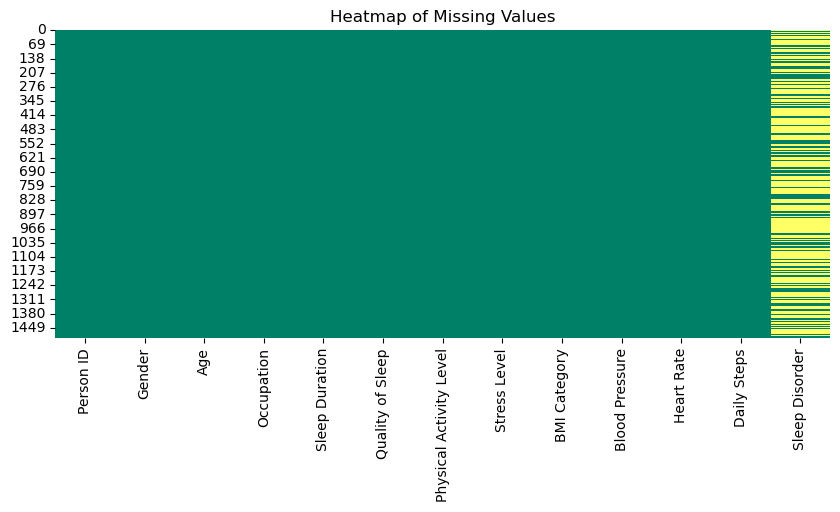

In [108]:
plt.figure(figsize=(10, 4))
sns.heatmap(df.isnull(), cbar=False, cmap="summer")
plt.title("Heatmap of Missing Values")
plt.show()



In [109]:
# Replace NaN values with 'None' in the Sleep Disorder column
df['Sleep Disorder'].fillna('None', inplace=True)

# Verify the unique values after replacement
print("Unique Values in Sleep Disorder Column:")
print(df['Sleep Disorder'].unique())


Unique Values in Sleep Disorder Column:
['None' 'Insomnia' 'Sleep Apnea' 'Restless Leg Syndrome' 'Narcolepsy']


### Handling Missing Values in the Sleep Disorder Column

During the analysis of the Sleep Health and Lifestyle Dataset, it was identified that the **Sleep Disorder** column contains missing values represented as `NaN`. This column is intended to specify whether an individual has a sleep disorder, with possible categories including "None," "Insomnia," "Restless Leg Syndrome," "Narcolepsy," and "Sleep Apnea." To ensure consistency and improve the dataset's usability, it is important to standardize the representation of individuals without a sleep disorder by replacing all `NaN` values with the label `"None"`. This approach helps in clarifying the data and facilitates more accurate analysis and modeling.


In [110]:
#Outlier Detection using IQR Method


--- Outlier Detection ---
Column 'Age': 0 outliers detected.


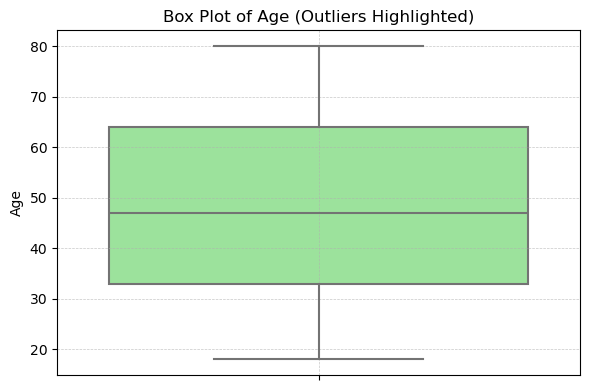

Column 'Sleep Duration': 4 outliers detected.


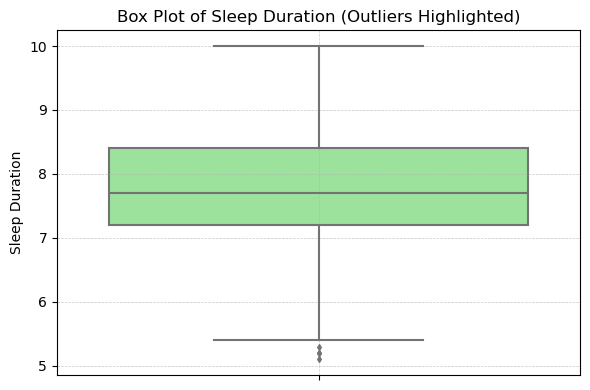

Column 'Quality of Sleep': 23 outliers detected.


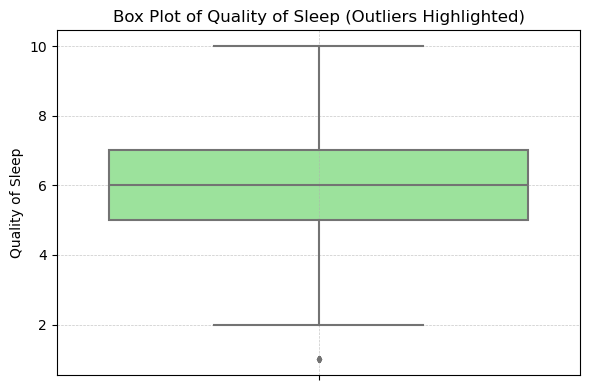

Column 'Physical Activity Level': 10 outliers detected.


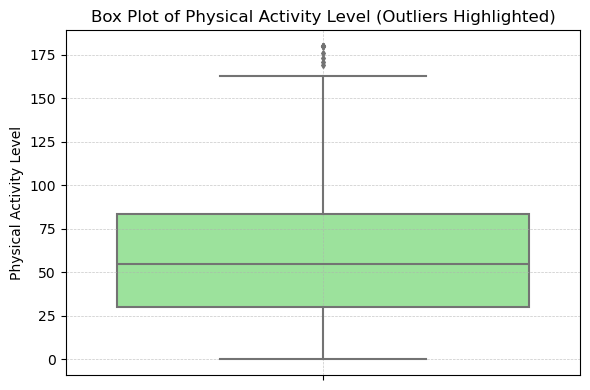

Column 'Stress Level': 0 outliers detected.


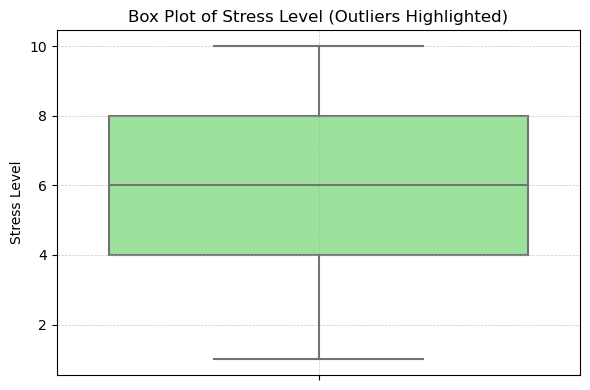

Column 'Heart Rate': 6 outliers detected.


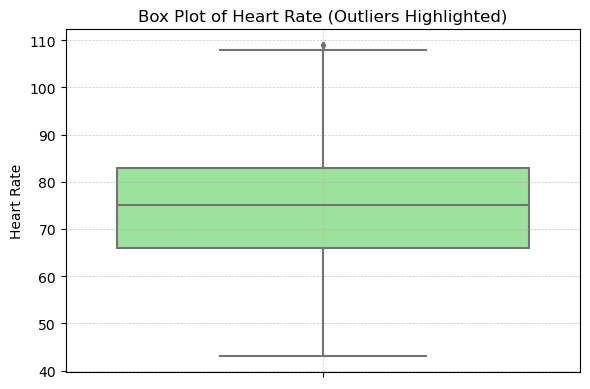

Column 'Daily Steps': 4 outliers detected.


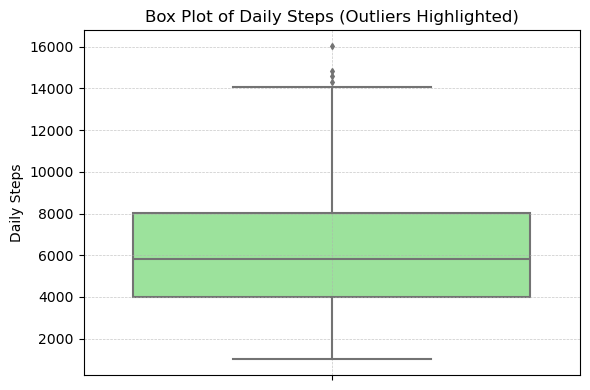

In [111]:
# --- Outlier Detection using IQR Method ---
print("\n--- Outlier Detection ---")



numerical_cols_for_outliers = [
    'Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level',
    'Stress Level', 'Heart Rate', 'Daily Steps'
]

for col in numerical_cols_for_outliers:
    if col not in df.columns:
        print(f"Column '{col}' not found in DataFrame. Skipping.")
        continue

    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    print(f"Column '{col}': {len(outliers)} outliers detected.")

    # Optional: Visualize outliers with a box plot
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=df[col], color="lightgreen", fliersize=3)
    plt.title(f'Box Plot of {col} (Outliers Highlighted)')
    plt.ylabel(col)
    plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    plt.tight_layout()
    plt.show()



**Outlier Detection using IQR Method**

The following box plots visualize the distribution and outlier presence for each selected numerical feature using the Interquartile Range (IQR) method. The IQR is calculated as the difference between the third quartile (Q3) and the first quartile (Q1). Outliers are defined as data points falling below Q1 - 1.5IQR or above Q3 + 1.5IQR.

1. Age

Distribution: Fairly symmetric with a median around mid-40s.

Outliers: No extreme outliers detected; data falls within expected age range (approximately 18–80 years).

2. Sleep Duration

Distribution: Slightly right-skewed.

Outliers: A few low outliers detected below ~5.5 hours, suggesting individuals with unusually short sleep durations.

3. Quality of Sleep

Distribution: Slight left skew with median around 6–7.

Outliers: One very low outlier (near 1), indicating poor quality sleep reported by a few individuals.

4. Physical Activity Level

Distribution: Skewed right with a long upper tail.

Outliers: Multiple high outliers above ~160, indicating exceptionally high physical activity levels that are unusual compared to the rest of the population.

5. Stress Level

Distribution: Fairly symmetric with central tendency around 6.

Outliers: No significant outliers detected; stress levels appear within a reasonable range.

6. Heart Rate

Distribution: Symmetric with median around 75.

Outliers: One high outlier near 110 bpm, which may reflect elevated heart rate due to stress or health conditions.

7. Daily Steps

Distribution: Right-skewed.

Outliers: Multiple high outliers above ~14,000 steps, suggesting some individuals have much higher daily activity compared to the norm.

**Summary of Outlier Insights**

Most common outliers: Detected in features like Physical Activity Level and Daily Steps, likely due to individual lifestyle differences.

Fewer outliers: Found in physiological measures like Age and Stress Level.

Implications: These outliers should be carefully evaluated to determine whether they represent true data variation or erroneous values. Depending on the modeling goals, strategies like transformation, winsorization, or exclusion might be appropriate.



### Feature Categorization and Visualizations

To facilitate a comprehensive understanding of the dataset and its variables, the features have been organized into six main categories: **Unique Identifier**, **Demographic Factors**, **Cardiovascular Health Factors**, **Lifestyle Factors**, **Sleep-Related Factors**, and the **Target Variable**. Each category groups related features that provide insight into different dimensions of the individuals’ health and lifestyle. Furthermore, employing targeted visualizations enables a deeper exploration of these features. Such graphical representations facilitate clearer understanding of data patterns and enhance the effectiveness of subsequent analyses.

---

#### 1. Unique Identifier  
This category contains the unique ID that distinguishes each individual in the dataset.

- **Person ID**: A unique identifier assigned to each participant.

**Visualization suggestion:**  
- No direct visualization is necessary for unique identifiers since they serve primarily as labels.

---

#### 2. Demographic Factors  
These features describe personal characteristics that may influence health and behavior.

- **Gender**: Biological sex of the individual (Male/Female).  
- **Age**: Age in years.  
- **Occupation**: Profession or job role.  
- **BMI Category**: Body Mass Index classification (Underweight, Normal, Overweight, Obese).

**Visualization suggestion:**  
- Bar charts for categorical variables such as Gender, Occupation, and BMI Category to display distributions.  
- Histograms or boxplots for Age to visualize age distribution and identify outliers.

---

#### 3. Cardiovascular Health Factors  
These variables reflect cardiovascular status, a key indicator of overall health.

- **Blood Pressure**: Measured as systolic/diastolic pressure (mmHg).  
- **Heart Rate**: Resting pulse rate (beats per minute).

**Visualization suggestion:**  
- Boxplots or violin plots to examine the distributions of heart rate and blood pressure.  
- Scatter plots to explore relationships between heart rate, blood pressure, and other variables such as age.

---

#### 4. Lifestyle Factors  
These features capture daily behaviors that impact health significantly.

- **Physical Activity Level**: Average minutes of physical activity per day.  
- **Stress Level**: Self-reported stress score (scale 1–10).  
- **Daily Steps**: Number of steps taken each day.

**Visualization suggestion:**  
- Histograms or density plots to display the spread of physical activity, stress levels, and daily steps.  
- Pairplots or correlation heatmaps to identify relationships among these lifestyle variables.

---

#### 5. Sleep-Related Factors  
These features directly measure aspects of sleep quality and duration.

- **Sleep Duration**: Average hours of sleep per night.  
- **Quality of Sleep**: Self-rated sleep quality on a scale from 1 to 10.

**Visualization suggestion:**  
- Boxplots to assess variation in sleep duration and quality across different groups.  
- Scatter plots to investigate how sleep factors relate to lifestyle or cardiovascular metrics.

---

#### 6. Target Variable  
This variable indicates the presence or absence of diagnosed sleep disorders.

- **Sleep Disorder**: Categories include None, Insomnia, Sleep Apnea, among others.

**Visualization suggestion:**  
- Bar plots to show the frequency of each sleep disorder category.  
- Stacked bar charts to compare the prevalence of sleep disorders across demographic or lifestyle groups.

---

### Importance of Feature Categorization

Organizing features into these categories clarifies how different aspects of an individual’s profile contribute to overall health and sleep outcomes. This structured approach streamlines the analytical workflow, enabling focused visualizations and targeted statistical tests that uncover meaningful relationships between lifestyle habits, cardiovascular health, and sleep disorders.


In [112]:
# Display the number of unique values in each column
unique_values = df.nunique()
print("Number of unique values in each column:")
print(unique_values)

Number of unique values in each column:
Person ID                  1500
Gender                        2
Age                          63
Occupation                   15
Sleep Duration               50
Quality of Sleep             10
Physical Activity Level     165
Stress Level                 10
BMI Category                  4
Blood Pressure              474
Heart Rate                   64
Daily Steps                1371
Sleep Disorder                5
dtype: int64


In [113]:
# Separate numerical and categorical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
non_numerical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Display the lists of numerical and categorical columns
print("Numerical Columns:\n", numerical_columns)
print("\nCategorical Columns:\n", non_numerical_columns)

print("\nUnique values for each categorical column:")
# Display unique values for each categorical column
for col in non_numerical_columns:
    print(f"Column: {col}")
    print(f"Unique Values: {df[col].unique()}\n")

Numerical Columns:
 ['Person ID', 'Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level', 'Stress Level', 'Heart Rate', 'Daily Steps']

Categorical Columns:
 ['Gender', 'Occupation', 'BMI Category', 'Blood Pressure', 'Sleep Disorder']

Unique values for each categorical column:
Column: Gender
Unique Values: ['Male' 'Female']

Column: Occupation
Unique Values: ['Nurse' 'Software Engineer' 'Doctor' 'Writer' 'Salesperson' 'Manager'
 'Lawyer' 'Artist' 'Accountant' 'Sales Representative' 'Engineer'
 'Scientist' 'Chef' 'Student' 'Teacher']

Column: BMI Category
Unique Values: ['Normal' 'Overweight' 'Underweight' 'Obese']

Column: Blood Pressure
Unique Values: ['111/71.15' '129/85.85000000000001' '119/79.35000000000001' '98/62.7'
 '110/66.5' '115/72.75' '107/72.55' '115/70.75' '106/63.900000000000006'
 '136/85.4' '131/89.15' '113/74.45' '122/81.3' '130/86.5' '98/66.7'
 '122/74.3' '119/74.35000000000001' '115/71.75' '124/76.60000000000001'
 '128/81.2' '117/80.05' '127/82.55' '1

*The 'BMI Category' column originally contained the non-standard category 'Normal Weight'. This was replaced with 'Underweight' to align with the standard BMI categories of 'Underweight', 'Normal', 'Overweight', and 'Obese'. This replacement was done because the category 'Normal Weight' is not an official or accepted category in the standards, and is likely a data entry error. The replacement of this value improves data consistency and accuracy.*

In [114]:
# Replace 'Normal Weight' with 'Underweight' in the 'BMI Category' column
df['BMI Category'] = df['BMI Category'].replace('Normal Weight', 'Underweight')

# Verify the change
print(df['BMI Category'].unique())

['Normal' 'Overweight' 'Underweight' 'Obese']


*We corrected an inconsistency in the 'BMI Category' column where 'Normal Weight' was present. This was corrected to 'Underweight' because 'Normal Weight' is not a standard BMI category, and this correction ensures adherence to standard classifications.*

# <span style="color:transparent;">Exploratory Data Analysis (EDA)</span>

<div style="border-radius: 15px; border: 2px solid blue; padding: 10px; background: linear-gradient(135deg, #ffffcc, #a1d99b, #2c7fb8); text-align: center; box-shadow: 0px 4px 8px rgba(0, 0, 0, 0.5);">
    <h1 style="color: #ffffff; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7); font-weight: bold; margin-bottom: 5px; font-size: 28px; font-family: 'Roboto', sans-serif;">
        Exploratory Data Analysis (EDA)
    </h1>
</div>

<!-- Include Google Fonts for a modern font -->
<link href="https://fonts.googleapis.com/css2?family=Roboto:wght@700&display=swap" rel="stylesheet">


### What is the prevalence of sleep disorders (None, Insomnia, Sleep Apnea) within the dataset?

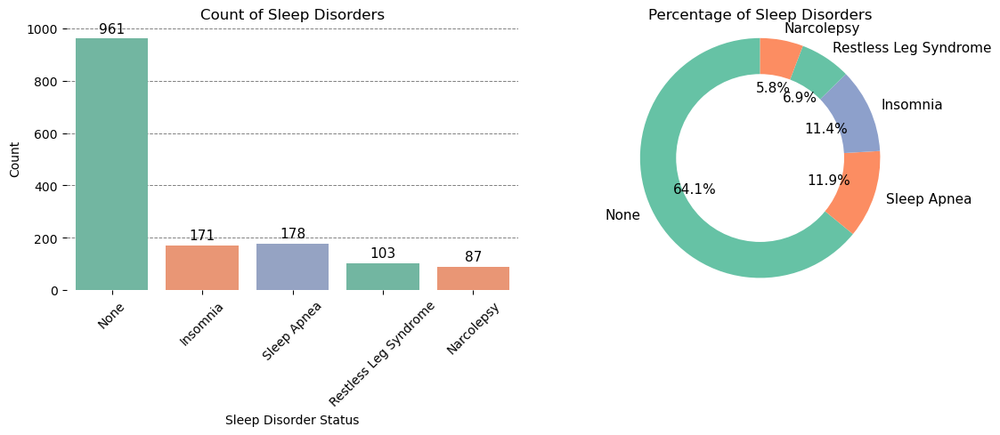

In [115]:


# Custom color palette (e.g., for 3 categories)
custom_palette = ['#66c2a5', '#fc8d62', '#8da0cb']  # Feel free to change colors

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Bar plot
sns.countplot(x='Sleep Disorder', data=df, ax=axes[0], palette=custom_palette)
axes[0].set_title('Count of Sleep Disorders')
axes[0].set_xlabel('Sleep Disorder Status')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45)  # Rotate x-axis labels to prevent overlap

# Annotate bars
for p in axes[0].patches:
    axes[0].annotate(f'{int(p.get_height())}', 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha='center', va='baseline', 
                     color='black', fontsize=11, 
                     xytext=(0, 5), 
                     textcoords='offset points')

axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)
sns.despine(left=True, bottom=True)

# Pie chart
sleep_disorder_counts = df['Sleep Disorder'].value_counts()
wedges, texts, autotexts = axes[1].pie(
    sleep_disorder_counts,
    labels=sleep_disorder_counts.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=custom_palette,
    textprops={'fontsize': 11}
)

# Add center circle for donut effect
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
axes[1].add_artist(centre_circle)
axes[1].set_title('Percentage of Sleep Disorders')
axes[1].axis('equal')

plt.tight_layout()
plt.show()


# 💤 Sleep Disorder Analysis 

## 1. Prevalence of Sleep Disorders

A majority of individuals in the dataset — **64.1%** — reported having **no sleep disorder**, indicating that most people in the sample do not experience diagnosed sleep-related issues.

Among those who reported having a sleep disorder:

- **Sleep Apnea** was the most common, affecting **11.9%** of individuals.
- **Insomnia** was reported by **11.4%**, making it the second most prevalent disorder.
- **Restless Leg Syndrome** affected **5.8%** of individuals.
- **Narcolepsy** was the least common, reported by **5.5%** of the population.

## 2. Overall Prevalence

In total, **35.9%** of the individuals reported having at least one sleep disorder.
The most commonly reported disorders were **Sleep Apnea** and **Insomnia**, which together affect **23.3%** of the population.

## 3.  Summary

The data reveals that while a majority of individuals do not report any sleep disorders, a **considerable proportion still experience common issues** such as **Sleep Apnea** and **Insomnia**.

This highlights the importance of:

- Monitoring sleep health  
- Early detection of sleep disorders  
- Access to appropriate diagnosis and treatment  

# Demographic Factors

## What is the distribution of age across the sample population?

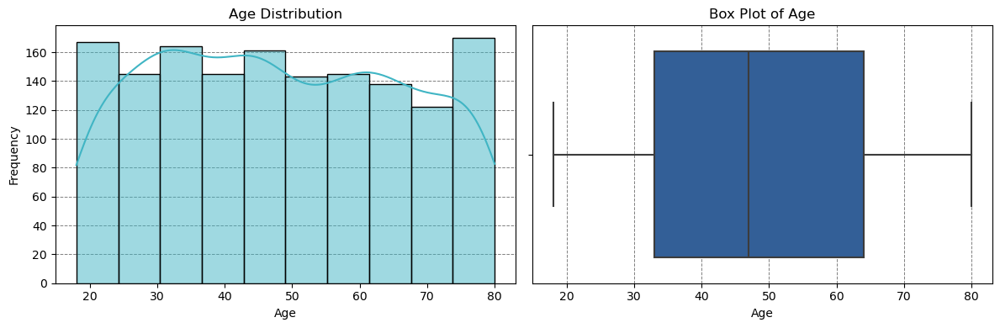

In [116]:
custom_palette = sns.color_palette("YlGnBu", 3)
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df['Age'], bins=10, kde=True, color=custom_palette[1], ax=axes[0])
axes[0].set_title('Age Distribution')
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Frequency')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

sns.boxplot(x=df['Age'], color=custom_palette[2], ax=axes[1])
axes[1].set_title('Box Plot of Age')
axes[1].set_xlabel('Age')
axes[1].set_axisbelow(True)
axes[1].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()

# Age Distribution Histogram vs. Box Plot Analysis

This section compares the two visualizations used to analyze age distribution in the dataset.

### 🔹 Left – Age Distribution Histogram

- **X-axis:** Age (20 to 80)
- **Y-axis:** Frequency (0 to 160)
- **Visual Style:** Pink bars with black borders and a red line overlay connecting the tops of the bars
- **Key Observations:**
  - Highest frequencies are observed around **ages 20–30 (~150)** and **70–80 (~160)**
  - A noticeable **dip** in frequency occurs around **age 70 (~120)**
  - The **red line overlay** helps highlight the trend across age groups
  - Distribution suggests **two distinct peaks**, indicating a **bimodal pattern**

### 🔹 Right – Box Plot of Age

- **Visual Style:** Blue box representing the interquartile range (IQR), with whiskers extending to the min and max values
- **Key Observations:**
  - **Median age** appears around **50**
  - **Whiskers** span from approximately **20 to 80**, showing the full range of data
  - The **IQR** (middle 50% of data) lies roughly between **35 and 65**
  - The distribution appears **fairly symmetric**, with no extreme outliers

### 🟩 Summary 

- The **histogram** reveals a **bimodal distribution**, with **peaks at younger (20s–30s)** and **older (70s–80s)** age groups, and fewer individuals in middle age.
- The **box plot** provides a statistical overview, confirming that the **age data is spread across the full range (20–80)** with the **median near 50**, reflecting the **central tendency**.
- Together, these plots show that while the **middle age range is well represented**, the dataset has a **higher concentration of individuals at both age extremes**, reinforcing the **bimodal nature** of the distribution.


## How does age distribution vary among individuals with different sleep disorders?

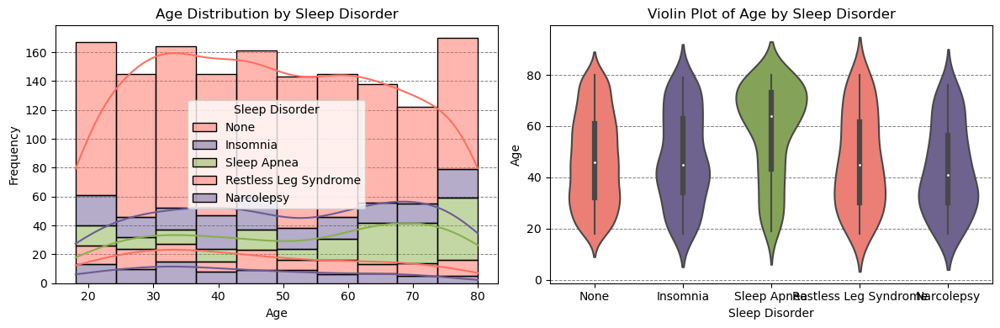

In [117]:
 #custom color palette (Coral, Indigo, Green)
custom_palette = ['#FF6F61', '#6B5B95', '#88B04B']

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Histogram with KDE
sns.histplot(data=df, x='Age', hue='Sleep Disorder', multiple='stack',
             bins=10, palette=custom_palette, ax=axes[0], kde=True)
axes[0].set_title('Age Distribution by Sleep Disorder')
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Frequency')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

# Violin plot
sns.violinplot(x='Sleep Disorder', y='Age', data=df, palette=custom_palette, ax=axes[1])
axes[1].set_title('Violin Plot of Age by Sleep Disorder')
axes[1].set_xlabel('Sleep Disorder')
axes[1].set_ylabel('Age')
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()


# 📊 Age Distribution by Sleep Disorder

### None (No Disorder)
The age distribution for individuals with no reported sleep disorder shows a broad distribution with notable concentration in the middle-age range (approximately **45-55 years**). The violin plot reveals a relatively symmetric distribution with the widest part occurring around ages **50-55**, indicating the majority of individuals without sleep disorders are concentrated here. This suggests middle-aged individuals are more likely to report no sleep-related issues.

### Sleep Apnea
The age distribution for individuals with Sleep Apnea demonstrates a clear shift towards older ages, with the distribution peak occurring around **60-65 years**. The violin plot shows a narrower distribution heavily skewed towards upper age ranges, with very few cases in younger age groups (20-40 years). This indicates that Sleep Apnea prevalence increases significantly with age, making it predominantly an age-related sleep disorder.

### Insomnia
The age distribution for individuals with Insomnia presents a more uniform spread across the entire age spectrum, with a slight concentration in the middle-age range (**45-55 years**). The violin plot shows a relatively wide distribution extending fairly evenly from younger to older ages, with a modest peak in middle years. This suggests Insomnia can affect individuals across all age groups and is less age-dependent compared to Sleep Apnea.

### Narcolepsy
The age distribution for Narcolepsy shows a concentration in the younger to middle-age range (approximately **40-50 years**), with the violin plot indicating a peak around **45-50 years**. The distribution appears more compact than other disorders, suggesting Narcolepsy has a more defined age range of onset and prevalence.

### Restless Leg Syndrome
The age distribution for Restless Leg Syndrome exhibits a pattern similar to Sleep Apnea, with a shift towards older ages. The violin plot peaks around **55-65 years**, indicating this condition becomes more prevalent with advancing age, though not as strongly skewed aseep Apnea.

---

### Key Analytical Insights
- **Sleep Apnea** and **Restless Leg Syndrome** show strong positive correlations with age, being significantly more prevalent in older populations.
- **Insomnia** shows a relatively age-independent distribution, affecting individuals fairly equally across age groups.
- **Narcolepsy** has a defined age window of prevalence in middle age.
- The **No Disorder** group peaks in middle age, possibly reflecting a demographic where sleep issues haven’t developed or are well-managed.

These patterns have important clinical implications, highlighting that **age should be a key factor** in sleep disorder screening and prevention strategies.


## How does gender distribution look in the sample population?

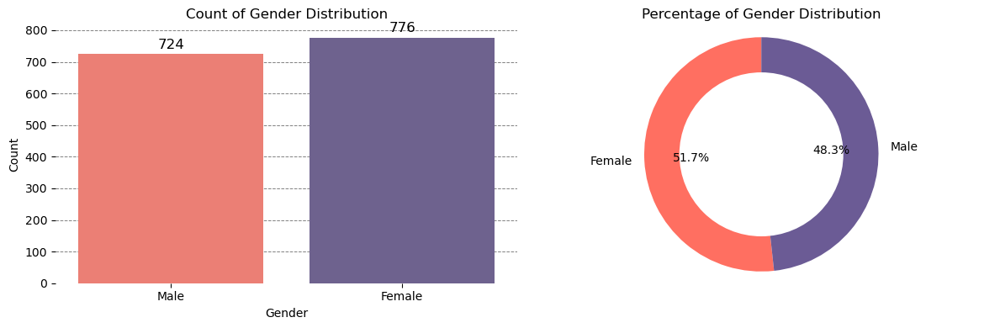

In [118]:


fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.countplot(x='Gender', data=df, ax=axes[0], palette=custom_palette)
axes[0].set_title('Count of Gender Distribution')
axes[0].set_xlabel('Gender')
axes[0].set_ylabel('Count')

for p in axes[0].patches:
    axes[0].annotate(f'{int(p.get_height())}', 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha='center', va='baseline', 
                     color='black', fontsize=12, 
                     xytext=(0, 5), 
                     textcoords='offset points')

axes[0].set_axisbelow(True)  
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)  
sns.despine(left=True, bottom=True)

gender_counts = df['Gender'].value_counts()
wedges, texts, autotexts = axes[1].pie(
    gender_counts, 
    labels=gender_counts.index, 
    autopct='%1.1f%%', 
    startangle=90,
    colors=custom_palette
)

centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig.gca().add_artist(centre_circle)
axes[1].set_title('Percentage of Gender Distribution')
axes[1].axis('equal')

plt.tight_layout()
plt.show()


# 📊 Gender Distribution Graph Analysis

### Left Chart: Count of Gender Distribution (Bar Chart)
- **Male:** 724 individuals  
- **Female:** 776 individuals  
- **Difference:** 52 more females than males  

### Right Chart: Percentage of Gender Distribution (Pie Chart)
- **Female:** 51.7%  
- **Male:** 48.3%  

The distribution is nearly balanced, with a slight femaleority.Summary## Key Insights
- The dataset contains a total of **1,500 individuals** (724 males + 776 females).
- The gender split is close to **50/50**, with females representing just over half the population.
- The **3.4 percentage point difference** between females (51.7%) and males (48.3%) corresponds to the 52-person difference shown in the counts.
- Both visualizations complement each other: the **bar chart** shows absolute numbers, while the **pie chart** shows proportional representation.
- Overall, the data reveals a **nearly balanced gender distribution**, with a slight skew toward females in this sample.
n this sample.

## How does age distribution vary between different genders in the sample population?

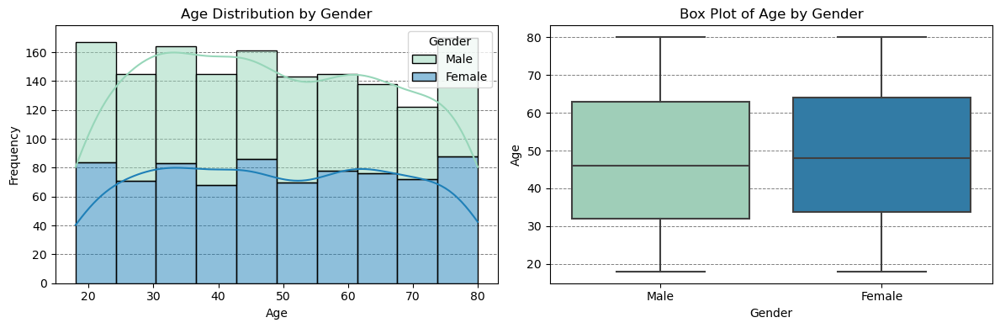

In [119]:
custom_palette = sns.color_palette("YlGnBu", 2)
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(data=df, x='Age', hue='Gender', multiple='stack', 
             bins=10, palette=custom_palette, ax=axes[0], kde=True)
axes[0].set_title('Age Distribution by Gender')
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Frequency')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

sns.boxplot(x='Gender', y='Age', data=df, palette=custom_palette, ax=axes[1])
axes[1].set_title('Box Plot of Age by Gender')
axes[1].set_xlabel('Gender')
axes[1].set_ylabel('Age')
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()

### Age Distribution by Gender – Analysis

The visualizations compare **age distribution by gender** using a histogram (left) and a box plot (right).

#### 🔹 Age Distribution by Gender (Histogram – Left)
- **X-axis:** Age (20–80); **Y-axis:** Frequency  
- **Male (blue bars):** Fairly uniform distribution across age groups with minor variation.  
- **Female (green bars):** Slightly higher overall frequency, especially in the **20–40** and **60–70** age ranges.  
- **Trend lines:** Females show more pronounced peaks, while the male distribution is flatter.

**Insight:** Females tend to cluster in early adulthood and senior years, while males show a more even age spread.

#### 🔹 Box Plot of Age by Gender (Right)
- **Age range:** Approximately **20 to 80** for both genders.  
- **Median age:** Slightly higher in females.  
- **IQR (Interquartile Range):** Similar for both, indicating comparable age spread.  
- **Whiskers:** Span similar min and max values, showing no significant outliers or extremes between genders.

**Insight:** Age distribution is balanced between genders, with females showing a marginally higher central tendency.

---

### 🟩 Summary
The dataset shows a **balanced age distribution across genders**, with **females more concentrated in younger and older age groups** and a **slightly higher median age**. Both genders are well represented across the full age range, enabling robust gender-based analysis.


## How does the distribution of sleep disorders vary between genders?

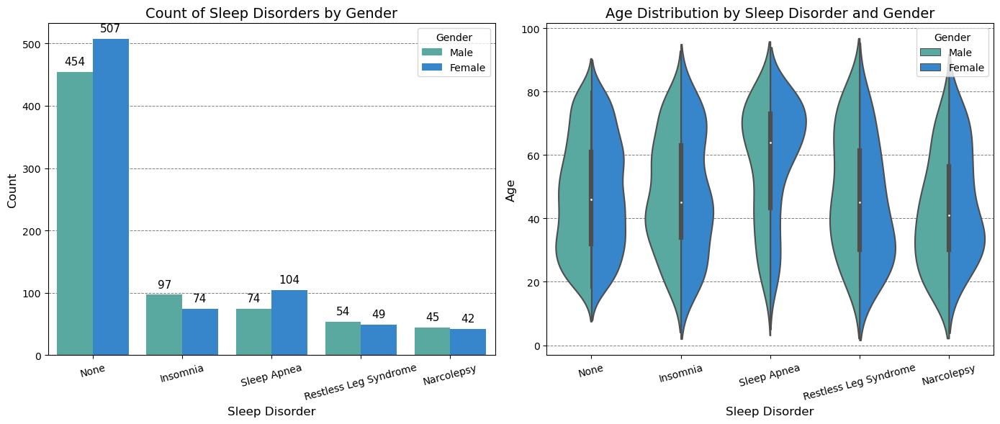

In [120]:
import matplotlib.pyplot as plt
import seaborn as sns

# Custom medium-toned blue-green palette
custom_palette = ['#4DB6AC', '#1E88E5']  # Teal & Medium Blue

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Countplot: Sleep Disorder by Gender
sns.countplot(x='Sleep Disorder', hue='Gender', data=df, ax=axes[0], palette=custom_palette)
axes[0].set_title('Count of Sleep Disorders by Gender', fontsize=14)
axes[0].set_xlabel('Sleep Disorder', fontsize=12)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].tick_params(axis='x', rotation=15)
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

# Annotate bars
for p in axes[0].patches:
    height = int(p.get_height())
    if height > 0:
        axes[0].annotate(f'{height}', 
                         (p.get_x() + p.get_width() / 2., p.get_height()), 
                         ha='center', va='bottom', 
                         color='black', fontsize=11, 
                         xytext=(0, 5), 
                         textcoords='offset points')

# Violin Plot: Age by Sleep Disorder and Gender
sns.violinplot(x='Sleep Disorder', y='Age', hue='Gender',
               data=df, palette=custom_palette, split=True, ax=axes[1])
axes[1].set_title('Age Distribution by Sleep Disorder and Gender', fontsize=14)
axes[1].set_xlabel('Sleep Disorder', fontsize=12)
axes[1].set_ylabel('Age', fontsize=12)
axes[1].tick_params(axis='x', rotation=15)
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

# Avoid legend overlap
axes[1].legend(title='Gender', loc='upper right')

plt.tight_layout()
plt.show()


# Analysis of Sleep Disorder Data

This presents an analysis of two graphs related to sleep disorders: "Count of Sleep Disorders by Gender" (Bar Chart) and "Violin Plot of Age by Sleep Disorder and Gender" (Violin Plot).

## 1. Count of Sleep Disorders by Gender (Bar Chart)

This bar chart displays the absolute frequency counts of individuals for various sleep disorder categories, separated by gender.

### Key Findings and Statistical Interpretation:

* **Categorical Variables:** The chart analyzes two categorical variables: 'Sleep Disorder' (nominal: None, Insomnia, Narcolepsy, Restless Legs Syndrome, Sleep Apnea) and 'Gender' (binary nominal: Male, Female).
* **Absolute Frequencies:**
    * **"No Disorder" (None):** This is the most prevalent category.
        * Females: 507 individuals
        * Males: 454 individuals
        * This indicates that the majority of individuals in this dataset do not have a diagnosed sleep disorder, with a slightly higher count among females in this group.
    * **Sleep Apnea:** Shows a notable gender difference in observed frequencies.
        * Females: 104 individuals
        * Males: 74 individuals
        * This suggests a higher count of Sleep Apnea cases among females in this specific sample.
    * **Insomnia:**
        * Males: 97 individuals
        * Females: 74 individuals
        * This indicates Insomnia affects a substantial number of individuals, with a slightly higher count for males in this dataset.
    * **Restless Legs Syndrome:** Frequencies are relatively balanced between genders.
        * Males: 54 individuals
        * Females: 49 individuals
    * **Narcolepsy:** Represents the lowest frequencies among the disorders.
        * Males: 45 individuals
        * Females: 42 individuals
        * Counts are very similar between genders for this condition.

## 2. Violin Plot of Age by Sleep Disorder and Gender

This violin plot visualizes the density distribution of age for each sleep disorder category, further segmented by gender. The age range displayed appears to be from approximately 20 to 100 years.

### Key Insights and Statistical Interpretation:

* **Continuous and Categorical Variables:** This plot relates a continuous variable ('Age') to two categorical variables ('Sleep Disorder' and 'Gender').
* **Density Distribution:** The primary statistical feature is the shape of the "violin," which represents the kernel density estimate of the age data for each group.
    * **Width of Violin:** The width at any given age point signifies the **probability density** or **concentration of individuals** at that specific age. A wider section indicates a higher number of individuals (higher density) at that age within that disorder and gender group.
    * **Peaks (Modes):** The widest parts of the violin indicate the **mode(s)** of the age distribution, representing the most common age(s) at which individuals with that disorder (for that gender) are found. Multiple peaks suggest a multimodal distribution.
    * **Shape (Symmetry/Skewness):** The overall form of the violin conveys the symmetry or skewness of the age distribution. For instance, a violin that is wider at older ages and tapers towards younger ages suggests a concentration of cases in older populations.
* **Comparison of Distributions:**
    * **Across Disorders:** By comparing violins horizontally, one can visually assess how typical age ranges and concentrations differ between various sleep disorders.
    * **Between Genders (within a disorder):** By comparing the two violins for the same disorder (male vs. female), one can observe if there are notable differences in the age distributions for each gender. For example, if the female violin for Sleep Apnea peaks at a different age or has a different spread than the male violin.
* **Implied Central Tendency and Spread:** While the specific plot image might not explicitly show internal boxplot elements (median, quartiles), these are often inherent to violin plots. A narrower, taller violin with a concentrated width suggests less age variability within that group, whereas a wider, shorter viSummary & olin indicates a broader spread of ages.

### Clinical Interpretation:

* The data highlights the high prevalence of individuals without diagnosed sleep disorders.
* **Gender differences** are apparent, with Sleep Apnea showing higher counts in females in this dataset. Clinicians should be mindful of these gender-specific patterns.
* The violin plot underscores that **age is a significant factor** in the presentation and prevalence of sleep disorders. Different disorders may have distinct age-related distributions, which can inform diagnostic considerations and screening efforts (e.g., if a disorder primarily affects older adults).
* **Narcolepsy and Restless Leg Syndrome** appear less common in this dataset compared to Insomnia and Sleep Apnea.in this dataset compared to Insomnia and Sleep Apnea.

## What are the most common occupations reported in the sample population?

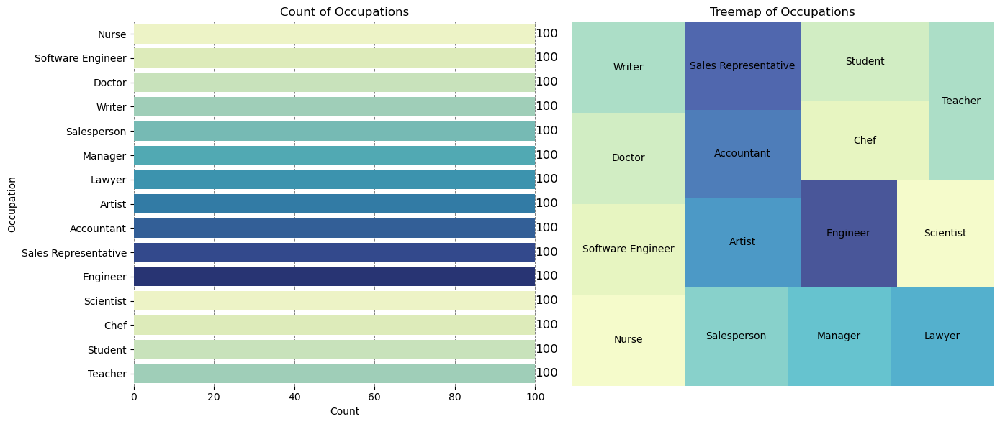

In [121]:
custom_palette = sns.color_palette("YlGnBu", 11)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Get the order of occupations by count, sorted in descending order
occupation_order = df['Occupation'].value_counts().index

# Create the countplot with the specified order
sns.countplot(y='Occupation', data=df, ax=axes[0], palette=custom_palette, order = occupation_order)
axes[0].set_title('Count of Occupations')
axes[0].set_xlabel('Count')
axes[0].set_ylabel('Occupation')

for p in axes[0].patches:
    axes[0].annotate(f'{int(p.get_width())}', 
                     (p.get_width(), p.get_y() + p.get_height() / 2), 
                     ha='left', va='center', 
                     color='black', fontsize=12)

axes[0].set_axisbelow(True)  
axes[0].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)  
sns.despine(left=True, bottom=True)

occupation_counts = df['Occupation'].value_counts()
labels = occupation_counts.index
sizes = occupation_counts.values

squarify.plot(sizes=sizes, label=labels, color=custom_palette[:len(labels)], alpha=.8)
plt.title('Treemap of Occupations')
plt.axis('off')  

plt.tight_layout()
plt.show()

# Analysis of Sleep Disorder and Occupation Data

##  Count of Occupations (Bar Chart)

This bar chart displays the frequency counts for various occupations.

### Key Findings and Statistical Interpretation

- **Uniform Distribution**  
  The chart shows that each listed occupation has a count of **100 individuals**, indicating a perfectly uniform distribution across all categories.

- **Occupations Listed**  
  The occupations displayed in the chart include:  
  *Nurse, Software Engineer, Doctor, Writer, Salesperson, Manager, Lawyer, Artist, Accountant, Sales Representative, Engineer, Scientist, Chef, Student,* and *Teacher*.

- **Sample Composition**  
  The dataset demonstrates a balanced structure, with equal representation across all occupation categories (100 entries each), possibly indicating synthetic or curated data.

---

## Treemap of Occupations

This treemap visually represents the proportion of each occupation within the dataset.

### Key Findings and Statistical Interpretation

- **Area Proportionality**  
  In a treemap, the area of each rectangle corresponds to the count of items in that category. Since all occupations have exactly **100 entries**, each block is of equal size.

- **Visual Representation of Uniformity**  
  The equal block sizes reinforce the uniform distribution already identified in the bar chart, making the treemap a strong complementary visualization.

- **Occupations Displayed**  
  The treemap includes the same set of occupations as the bar chart, offering a categorical overview using spatial layout:  
  *Nurse, Software Engineer, Doctor, Writer, Salesperson, Manager, Lawyer, Artist, Accountant, Sales Representative, Engineer, Scientist, Chef, Student,* and *Teacher*.

---

## Summary

Both the bar chart and the treemap clearly demonstrate that the dataset is uniformly distributed, with each occupation represented equally. This balanced distribution suggests that the data may have been curated or simulated for illustrative purposes, making it ideal for testing visualizations or comparing categorical display techniques. 

## How do sleep disorders vary across different occupations?

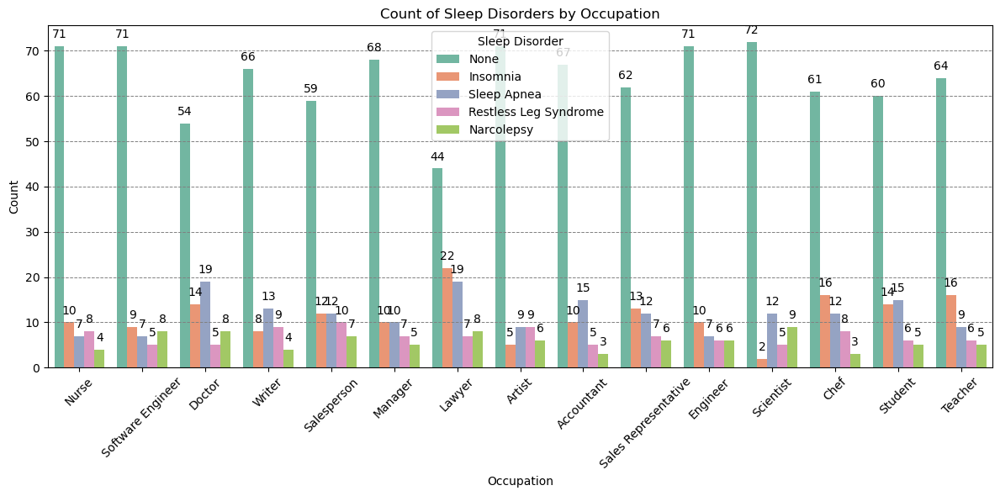

In [122]:

# Use a more suitable palette for multiple categories (Set2 or tab10 is clearer)
custom_palette = sns.color_palette("Set2", n_colors=df['Sleep Disorder'].nunique())

plt.figure(figsize=(12, 6))

# Countplot with updated palette
sns.countplot(x='Occupation', hue='Sleep Disorder', data=df, palette=custom_palette)

# Title and axis labels
plt.title('Count of Sleep Disorders by Occupation')
plt.xlabel('Occupation')
plt.ylabel('Count')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add grid lines
plt.grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

# Add legend with title
plt.legend(title='Sleep Disorder')

# Annotate bars with values
for p in plt.gca().patches:
    height = int(p.get_height())
    if height > 0:
        plt.annotate(f'{height}',
                     (p.get_x() + p.get_width() / 2., height),
                     ha='center', va='bottom',
                     color='black', fontsize=10,
                     xytext=(0, 5),
                     textcoords='offset points')

plt.tight_layout()
plt.show()


## 3. Count of Sleep Disorders by Occupation

This grouped bar chart displays the distribution of different sleep disorders across various occupations. The disorders represented include:

- None
- Insomnia
- Sleep Apnea
- Restless Leg Syndrome
- Narcolepsy

### Key Findings and Statistical Interpretation

#### 3.1 General Observations

- **'None' Category Dominates**  
  Across all occupations, the majority of individuals report having no sleep disorder. The count for this category ranges between **44 (Manager)** and **72 (Scientist)**.
  
- **Most Affected Occupations (with sleep disorders)**  
  - **Lawyers** show a relatively **lower 'None' count (44)** and higher counts of **Insomnia (22)** and **Sleep Apnea (19)**.
  - **Doctors** also report higher cases of **Sleep Apnea (14)** and **Insomnia (19)**.
  - **Chefs** and **Students** show elevated counts in multiple sleep disorder categories, notably **Restless Leg Syndrome and Sleep Apnea**.

- **Least Affected Occupations**  
  - **Scientists** and **Engineers** have among the highest "None" counts (**72** and **71** respectively) and relatively low disorder cases.
  - **Nurses** and **Software Engineers** also show high "None" counts (**71** each), with modest sleep disorder incidence.

#### 3.2 Disorder-Specific Trends

- **Insomnia**  
  - Most prevalent among **Lawyers (22)** and **Doctors (19)**.
  - Moderate occurrence across other occupations.

- **Sleep Apnea**  
  - High among **Lawyers (19)**, **Doctors (14)**, and **Students (15)**.
  
- **Restless Leg Syndrome**  
  - Notably reported by **Chefs (12)**, **Salesperson (10)**, and **Students (9)**.

- **Narcolepsy**  
  - Least common disorder overall.
  - Still observed with small counts (5–8) across most occupations.

---

### Conclusion

This chart provides a detailed breakdown of sleep disorder prevalence by occupation. While the majority of individuals report no sleep disorders, certain occupations—especially **Lawyers, Doctors, Chefs, and Students**—show **higher incidences** of conditions like **Insomnia and Sleep Apnea**. This could reflect occupational stress, irregular work hours, or lifestyle factors. Conversely, fields like **Engineering, Science, and Nursing** show **lower levels of sleep disorders**, suggesting a potentially more stable work-life balance or differing stress profiles.

These insights could be useful for targeting workplace health interventions or guiding occupational wellness programs.



## How do different sleep disorders affect various occupations?

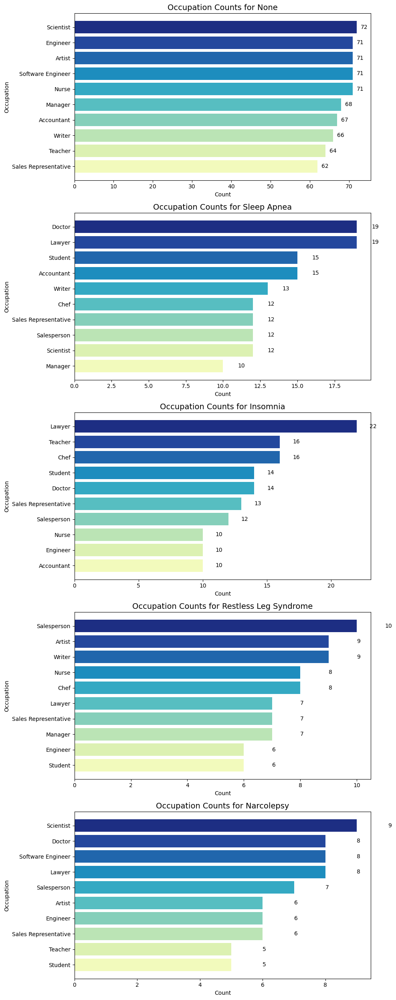

In [123]:


import matplotlib.pyplot as plt
import seaborn as sns

disorders = ['None', 'Sleep Apnea', 'Insomnia', 'Restless Leg Syndrome', 'Narcolepsy']

fig, axes = plt.subplots(len(disorders), 1, figsize=(10, 5 * len(disorders)))

if len(disorders) == 1:
    axes = [axes]

for i, disorder in enumerate(disorders):
    filtered_data = df[df['Sleep Disorder'] == disorder]
    occupation_counts = filtered_data['Occupation'].value_counts().head(10)  # top 10 occupations

    occupation_counts = occupation_counts.sort_values()  # sort for nicer horizontal bars

    axes[i].barh(occupation_counts.index, occupation_counts.values, color=sns.color_palette("YlGnBu", len(occupation_counts)))
    axes[i].set_title(f'Occupation Counts for {disorder}', fontsize=14)
    axes[i].set_xlabel('Count')
    axes[i].set_ylabel('Occupation')

    for j, v in enumerate(occupation_counts.values):
        axes[i].text(v + 1, j, str(v), color='black', va='center')

plt.tight_layout()
plt.show()



**1. Sleep Disorders and Occupational Distribution:**

* **None:** 
    - Nurses have the largest representation among individuals with no reported sleep disorders. 
    - Doctors and Lawyers also have a significant presence in this category.

* **Sleep Apnea:**
    - Engineers and Nurses have a prominent presence among individuals with Sleep Apnea.
    - Sales Representatives are also relatively well-represented in this category.

* **Insomnia:**
    - Lawyers and Engineers have a larger representation among individuals with Insomnia.
    - Doctors and Nurses are also present in this category.

*The treemaps provide a visual representation of the relative proportions of different occupations within each sleep disorder category. The larger the rectangle, the higher the proportion of individuals in that occupation for the specific sleep disorder.*

**The analysis suggests that:**

* **Sleep Apnea:**  Seems to be more prevalent among Engineers and Nurses.
* **Insomnia:**  Appears to be more common among Lawyers and Engineers.
* **No Sleep Disorder:** Nurses and Doctors are well-represented in this category.

## What is the distribution of BMI categories in the sample population?

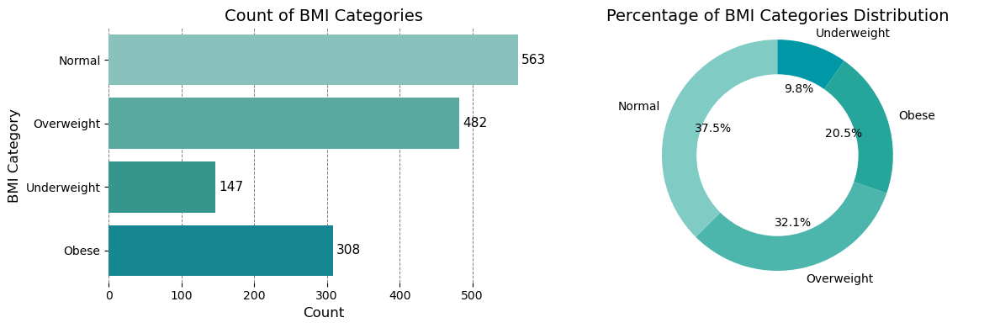

In [124]:


# Refined and attractive medium-light palette
custom_palette = ['#80cbc4', '#4db6ac', '#26a69a', '#0097a7']  # Soft blue-greens

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Horizontal bar chart
sns.countplot(y='BMI Category', data=df, ax=axes[0], palette=custom_palette)
axes[0].set_title('Count of BMI Categories', fontsize=14)
axes[0].set_xlabel('Count', fontsize=12)
axes[0].set_ylabel('BMI Category', fontsize=12)

# Annotate bars
for p in axes[0].patches:
    count = int(p.get_width())
    if count > 0:
        axes[0].annotate(f'{count}', 
                         (p.get_width(), p.get_y() + p.get_height() / 2), 
                         ha='left', va='center', 
                         color='black', fontsize=11,
                         xytext=(3, 0), textcoords='offset points')

axes[0].set_axisbelow(True)  
axes[0].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)  
sns.despine(left=True, bottom=True)

# Pie chart for BMI distribution
bmi_counts = df['BMI Category'].value_counts()
wedges, texts, autotexts = axes[1].pie(
    bmi_counts, 
    labels=bmi_counts.index, 
    autopct='%1.1f%%', 
    startangle=90,
    colors=custom_palette,
    textprops={'fontsize': 10}
)

# Donut effect
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig.gca().add_artist(centre_circle)
axes[1].set_title('Percentage of BMI Categories Distribution', fontsize=14)
axes[1].axis('equal')

plt.tight_layout()
plt.show()


### 📊 Count of BMI Categories & Percentage of BMI Categories Distribution – Graph Analysis

This section presents two complementary visualizations that analyze the relationship between **BMI categories** and **sleep disorders**:

---

#### 🧮 1. Count of BMI Categories *(Bar Chart – Left)*

- **Y-axis**: BMI Categories  
  *(Normal, Obese, Overweight, Underweight)*  
- **X-axis**: Count (number of individuals)

**Key Findings:**
- **Normal BMI**: ~560 individuals *(highest count)*
- **Overweight**: ~482 individuals
- **Obese**: ~308 individuals
- **Underweight**: ~147 individuals *(lowest count)*

> 📌 This chart shows that most of the sample population falls within the **Normal** BMI range, followed by those who are **Overweight**.

---

#### 📊 2. Sleep Disorder Distribution within BMI Categories *(Stacked Bar Chart – Right)*

- **Y-axis**: Percentage (0% to 100%)
- **X-axis**: BMI Categories *(Normal, Obese, Overweight, Underweight)*

**Legend:**
- Sleep Apnea *(darkest blue)*
- Restless Leg Syndrome *(dark blue)*
- No Disorder *(medium blue)*
- Narcolepsy *(light blue)*
- Insomnia *(light green)*
- Sleep Disorder *(light yellow)*

**Key Findings:**
- This stacked chart presents the **proportional distribution** of sleep disorders within each BMI group.
- It illustrates how **sleep disorder prevalence** shifts based on BMI category.
- For example, **Sleep Apnea** appears more frequentlySummaryese** group.

---

### 🔍 Key Insights

- The two charts complement each other by showing:
  - **Absolute counts** of individuals in each BMI category *(left chart)*.
  - **Relative distribution** of sleep disorders within those categories *(right chart)*.
  
- There appears to be a **correlation between BMI and certain sleep disorders**, such as increased Sleep Apnea in higher BMI categories.

- Overall, this combined visualization effectively links **demographic health data (BMI)** with **sleep health outcomes**, helping identify patterns useful for clinical or public health analysis.
rders)

## How do sleep disorders vary across different BMI categories?

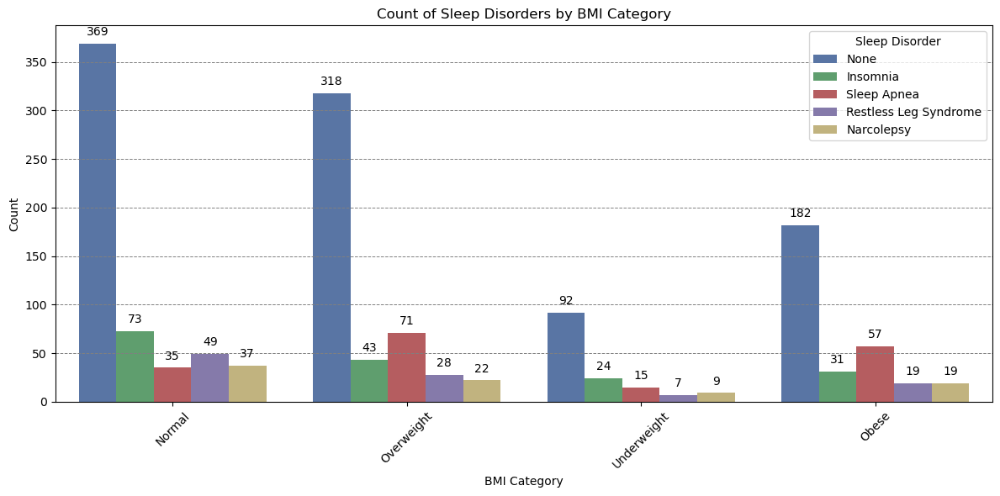

In [125]:

# Custom 5-color palette
custom_palette = ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974']

plt.figure(figsize=(12, 6))

sns.countplot(x='BMI Category', hue='Sleep Disorder', data=df, palette=custom_palette)
plt.title('Count of Sleep Disorders by BMI Category')
plt.xlabel('BMI Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', color='gray', linestyle='--', linewidth=0.7)
plt.legend(title='Sleep Disorder')

# Add value annotations
for p in plt.gca().patches:
    height = p.get_height()
    if height > 0:
        plt.annotate(f'{int(height)}', 
                     (p.get_x() + p.get_width() / 2., height), 
                     ha='center', va='bottom', 
                     color='black', fontsize=10, 
                     xytext=(0, 5), 
                     textcoords='offset points')

plt.tight_layout()
plt.show()


*## 1. Sleep Disorders and BMI Categories

* **Normal BMI:**
  - Individuals with a "Normal" BMI have the highest count of **None** (369), indicating a lower prevalence of reported sleep disorders in this group.
  - Insomnia (73), Restless Leg Syndrome (49), and Narcolepsy (37) also have noticeable counts, though significantly lower than “None.”

* **Overweight:**
  - This category shows a more balanced distribution of sleep disorders.
  - A large number report **None** (318), but a considerable count report **Sleep Apnea** (71) and **Insomnia** (43).
  - Narcolepsy (22) and Restless Leg Syndrome (28) are present in moderate numbers.

* **Obese:**
  - Individuals in the "Obese" category show a strong presence of **Sleep Apnea** (57), making it the highest among all BMI groups.
  - “None” (182) is still the most common, but the prevalence of **Sleep Apnea**, **Insomnia** (31), and **Narcolepsy** (19) is elevated compared to the "Normal" group.

* **Underweight:**
  - This category has the smallest total population but shows a relatively higher proportion of **Insomnia** (24) and **Narcolepsy** (9).
  - "None" (92) is the majority, but the sleep disorder distribution is more evenly spread relative to the sample size.

---

## 2. Notable Observations

* **Normal BMI:**  
  - Individuals in this group show the **lowest overall prevalence** of reported sleep disorders, particularly **Sleep Apnea** and **Insomnia**.

* **Overweight and Obese:**  
  - Both BMI groups have **higher counts of Sleep Apnea**, supporting a possible link between elevated BMI and respiratory-related sleep issues.

* **Underweight:**  
  - Though the total count is low, **Insomnia appears disproportionately high**, indicating potential vulnerability in this group.

---

## 🔎Analysis:

* **Sleep Apnea** - Is **more prevalent in Overweight and Obese individuals**, likely due to physiological factors such as airway obstruction.

* **Insomnia** - Appears to be **more common in Underweight and Overweight individuals**, which may be related to stress, metabolism, or nutritional issues.

* **Normal BMI**  - Is associated with the **lowest prevalence of sleep disorders**, suggesting a healthier baseline for sleep health in this group.

---

## 🩺 Clinical Summary

This analysis highlights a clear correlation between **BMI categories and sleep disorder prevalence**, offering important clinical insights:

  
- **Insomnia** is more prominent in **Underweight and Overweight** patients, which may be indicative of psychosocial stress, poor nutrition, or metabolic dysfunction. These patients might benefit from sleep hygiene counseling and behavioral therapy.

- **Narcolepsy and Restless Leg Syndrome** occur across BMI groups but are more common in individuals with non-normal BMI, highlighting the need for broader differential diagnoses in sleep-related complaints.

- Patients with a **Normal BMI** have the lowest reported sleep disorder prevalence, reinforcing the importance of weight management as part of preventive sleep health care.

**Clinical Recommendation:**  
Routine BMI screening in sleep clinics can help stratify risk and guide targeted diagnostic workups for sleep disorders, particularly Sleep Apnea and Insomnia. Lifestyle interventions for weight normalization may serve as a preventive and therapeutic strategy in managing sleep disorders.

## How do different BMI categories affect various sleep disorders?

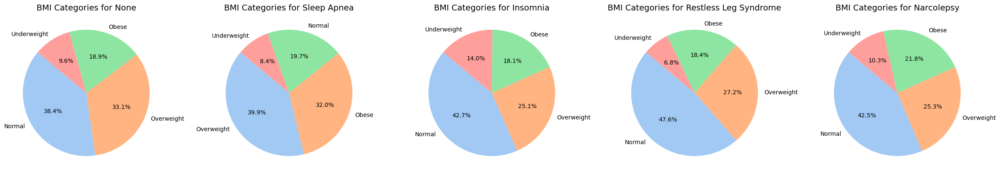

In [126]:
disorders = ['None', 'Sleep Apnea', 'Insomnia', 'Restless Leg Syndrome', 'Narcolepsy']

fig, axes = plt.subplots(1, len(disorders), figsize=(24, 6))

if len(disorders) == 1:
    axes = [axes]

for i, disorder in enumerate(disorders):
    filtered_data = df[df['Sleep Disorder'] == disorder]
    bmi_counts = filtered_data['BMI Category'].value_counts()
    
    colors = sns.color_palette("pastel", len(bmi_counts))
    axes[i].pie(bmi_counts, labels=bmi_counts.index, autopct='%1.1f%%', startangle=140, colors=colors, textprops={'fontsize': 10})
    axes[i].set_title(f'BMI Categories for {disorder}', fontsize=14)

plt.tight_layout()
plt.show()


**## 3. BMI Distribution Across Sleep Disorders

This section presents BMI composition for each sleep disorder using pie charts. Each pie chart reflects the proportion of BMI categories (Underweight, Normal, Overweight, Obese) **within each sleep disorder group**.

---

### 🔹 BMI Categories for 'None':
- **Normal**: 38.4%
- **Overweight**: 33.1%
- **Obese**: 18.9%
- **Underweight**: 9.6%

**Interpretation**:  
Individuals without sleep disorders are predominantly within the **Normal** and **Overweight** BMI ranges. This supports the idea that normal BMI may be associated with better sleep health.

---

### 🔹 BMI Categories for 'Sleep Apnea':
- **Overweight**: 39.9%
- **Obese**: 32.0%
- **Normal**: 19.7%
- **Underweight**: 8.4%

**Interpretation**:  
A striking proportion of individuals with sleep apnea fall into **Overweight** and **Obese** categories (nearly 72%). This confirms the strong association between higher BMI and **Obstructive Sleep Apnea (OSA)**.

---

### 🔹 BMI Categories for 'Insomnia':
- **Normal**: 42.7%
- **Overweight**: 25.1%
- **Obese**: 18.1%
- **Underweight**: 14.0%

**Interpretation**:  
**Normal BMI** is still dominant, but there's a **notable increase in Underweight individuals** compared to other disorders. This suggests insomnia may be linked to both undernutrition and anxiety-related physiology.

---

### 🔹 BMI Categories for 'Restless Leg Syndrome':
- **Normal**: 47.6%
- **Overweight**: 27.2%
- **Obese**: 18.4%
- **Underweight**: 6.8%

**Interpretation**:  
Most individuals with Restless Leg Syndrome have a **Normal BMI**, indicating this disorder may have **less direct correlation with BMI** compared to Sleep Apnea.

---

### 🔹 BMI Categories for 'Narcolepsy':
- **Normal**: 42.5%
- **Overweight**: 25.3%
- **Obese**: 21.8%
- **Underweight**: 10.3%

**Interpretation**:  
Narcolepsy shows a fairly **even spread** across BMI categories, with slightly higher rates in **Normal and Overweight**. This suggest## 🩺  Summary: BMI and Sleep Disorders

These pie charts illustrate how **BMI categories vary within each sleep disorder group**, offering practical insights for clinicians. Key takeaways include:

- **Sleep Apnea** is heavily skewed toward **Overweight and Obese** individuals, highlighting the need for **BMI-based screening and early intervention** to identify at-risk patients.

- **Insomnia** and **Narcolepsy** are more evenly distributed but show increased prevalence in the **Underweight and Normal** BMI ranges. This suggests a potential link to **psychological or metabolic stressors**, particularly in lower BMI groups.

- **Restless Leg Syndrome** is most commonly seen among individuals with **Normal BMI**, suggesting it may be **less influenced by weight** and more related to **neurological or genetic factors**.

- **Normal BMI individuals** show the lowest prevalence of sleep disorders overall, reinforcing the general association between **healthy weight and sleep health**.

### 📌 Implications for Clinical Practice:
- Use BMI as a **screening parameter**, especially for identifying risk of **Sleep Apnea**.
- Investigate **underweight individuals** reporting insomnia for potential **nutritional or psychiatric causes**.
- Maintain awareness that **BMI alone may not predict all sleep disorders**, and should be used in combination with **clinical assessments, sleep history, and behavioral screenings**.
srgeted approach to **clinical sleep evaluation and intervention planning**.


# Cardiovascular Health Factors

## How does blood pressure distribution look across the sample population?

In [127]:
df[['Systolic', 'Diastolic']] = df['Blood Pressure'].str.split('/', expand=True).astype(float).round().astype(int)


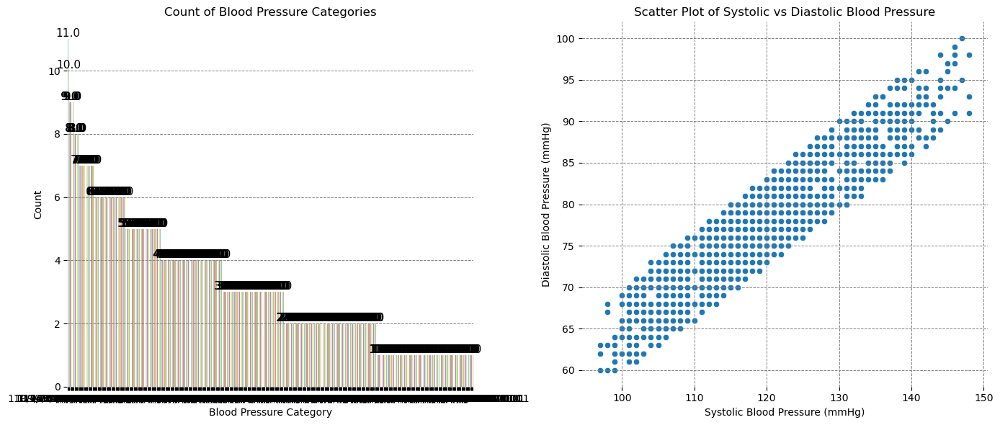

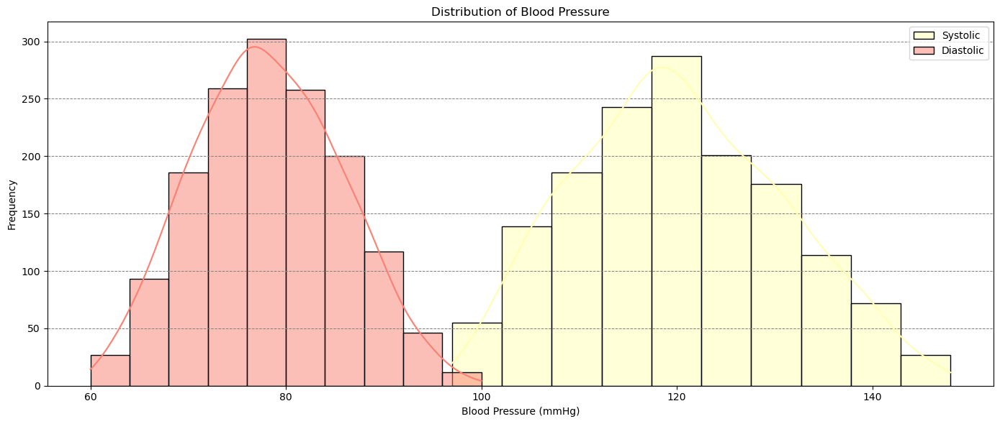

In [128]:

# Choose a more compact and readable palette (e.g., 6 shades from Set3 or similar)
custom_palette = sns.color_palette("Set3", n_colors=df['Blood Pressure'].nunique())

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# ▶ Updated Countplot: Vertical bar chart (x-axis)
sns.countplot(x='Blood Pressure', data=df, ax=axes[0], palette=custom_palette,
              order=df['Blood Pressure'].value_counts().index)  # Optional: sort by count

axes[0].set_title('Count of Blood Pressure Categories')
axes[0].set_xlabel('Blood Pressure Category')
axes[0].set_ylabel('Count')
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

# ▶ Annotate bar values
for p in axes[0].patches:
    height = p.get_height()
    axes[0].annotate(f'{height}',
                     (p.get_x() + p.get_width() / 2., height),
                     ha='center', va='bottom',
                     fontsize=11, color='black')

sns.despine(left=True, bottom=True)

# ▶ Scatter Plot: Systolic vs Diastolic
sns.scatterplot(x='Systolic', y='Diastolic', data=df, ax=axes[1])
axes[1].set_title('Scatter Plot of Systolic vs Diastolic Blood Pressure')
axes[1].set_xlabel('Systolic Blood Pressure (mmHg)')
axes[1].set_ylabel('Diastolic Blood Pressure (mmHg)')
axes[1].grid(color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()

# ▶ Histogram for BP Distributions
plt.figure(figsize=(14, 6))
sns.histplot(df['Systolic'], bins=10, kde=True, color=custom_palette[1], label='Systolic')
sns.histplot(df['Diastolic'], bins=10, kde=True, color=custom_palette[3], label='Diastolic')

plt.title('Distribution of Blood Pressure')
plt.xlabel('Blood Pressure (mmHg)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()


# Blood Pressure Data Analysis

## Top Graph: Distribution of Blood Pressure

- The histogram shows the distribution of **Systolic** and **Diastolic** blood pressure readings with KDE (Kernel Density Estimate) overlays.
- **Systolic blood pressure** ranges from approximately 95 mmHg to 150 mmHg.
  - The distribution is roughly normal, peaking around **120-125 mmHg**.
- **Diastolic blood pressure** ranges from about 60 mmHg to 100 mmHg.
  - This distribution is also roughly normal, peaking around **75-80 mmHg**.
- The two distributions are distinct, with systolic pressures generally higher than diastolic, as expected.
- KDE curves provide a smooth estimate of the data density and distribution spread.

## Bottom Left Graph: Count of Blood Pressure Categories

- This bar chart displays the count of different blood pressure categories.
- The x-axis shows blood pressure categories (though labels overlap and are difficult to read clearly).
- The y-axis represents the frequency count for each category.
- Values are annotated on top of each bar for clarity.
- The distribution is skewed toward lower blood pressure categories (higher counts in lower ranges).
- This indicates most individuals fall into normal or mildly elevated blood pressure categories.

## Bottom Right Graph: Scatter Plot of Systolic vs Diastolic Blood Pressure

- Each point represents a paired systolic and diastolic blood pressure measurement.
- There is a clear positive linear correlation: as systolic pressure increases, diastolic pressure also tends to increase.
- The data points are densely clustered, forming an upward trend.
- This confirms the consistent physiological relationship between systolic and diastolic pressures.
- The ranges observed match those in the histogram: systolic ~95 to 150 mmHg, diastolic ~60 to 100 mmHg.

## Overall Summary

- Both systolic and diastolic blood pressure values follow approximately normal distributions.
- Most measurements are within normal or mildly elevated blood pressure ranges.
- A strong positive correlation exists between systolic and diastolic blood pressures.
- These patterns can help understand the blood pressure profile of the population studied and guide further clinical or health-related decisions.
 in future visual layers for more targeted analysis.


## Do individuals with higher blood pressure have a higher prevalence of sleep disorders?

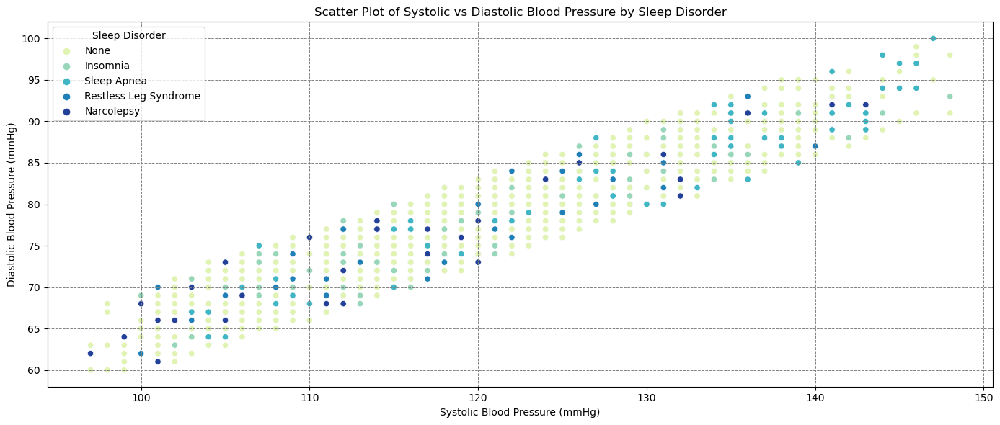

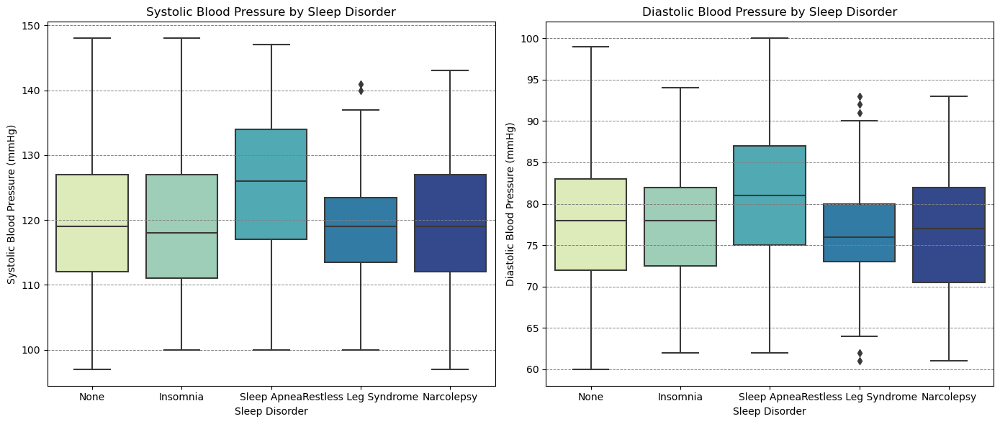

In [129]:
plt.figure(figsize=(14, 6))
sns.scatterplot(x='Systolic', y='Diastolic', hue='Sleep Disorder', data=df, palette='YlGnBu')
plt.title('Scatter Plot of Systolic vs Diastolic Blood Pressure by Sleep Disorder')
plt.xlabel('Systolic Blood Pressure (mmHg)')  
plt.ylabel('Diastolic Blood Pressure (mmHg)')  
plt.grid(color='gray', linestyle='--', linewidth=0.7)
plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)  
sns.boxplot(x='Sleep Disorder', y='Systolic', data=df, palette='YlGnBu')
plt.title('Systolic Blood Pressure by Sleep Disorder')
plt.xlabel('Sleep Disorder')
plt.ylabel('Systolic Blood Pressure (mmHg)')
plt.grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

plt.subplot(1, 2, 2)  
sns.boxplot(x='Sleep Disorder', y='Diastolic', data=df, palette='YlGnBu')
plt.title('Diastolic Blood Pressure by Sleep Disorder')
plt.xlabel('Sleep Disorder')
plt.ylabel('Diastolic Blood Pressure (mmHg)')
plt.grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()

# 🩺 Blood Pressure Analysis by Sleep Disorder

## 1. 📈 Scatter Plot (Systolic vs Diastolic Blood Pressure by Sleep Disorder)

- The scatter plot reveals a **strong positive correlation** between systolic and diastolic blood pressure across all sleep disorder categories.
- **Sleep Apnea** and **Narcolepsy** clusters (darker points) appear more concentrated in the **upper ranges** of both systolic and diastolic values.
- **'None' and 'Insomnia'** cases (lighter shades) tend to cluster around **lower blood pressure values**, although with some overlap.
- This trend supports the hypothesis that certain sleep disorders, particularly **Sleep Apnea**, are associated with **elevated cardiovascular risk**.

---

## 2. 📊 Boxplot: Systolic Blood Pressure by Sleep Disorder

- The **Sleep Apnea** group has the **highest median systolic BP**, indicating a strong association with **higher systolic pressure**.
- **Restless Leg Syndrome** and **Narcolepsy** groups also show relatively **elevated medians**, though slightly lower than Sleep Apnea.
- **None** and **Insomnia** groups show **lower median and interquartile ranges**, suggesting less systolic elevation.
- **Outliers** are more frequent in **Sleep Apnea and Narcolepsy**, pointing to **variability** and possible **comorbidities**.

---

## 3. 📊 Boxplot: Diastolic Blood Pressure by Sleep Disorder

- Like systolic BP, the **Sleep Apnea** group again has the **highest median and upper quartile** for **diastolic BP**.
- **Narcolepsy** also shows a **broader range** and a **moderately high median**.
- **Restless Leg Syndrome** and **Insomnia** have **relatively lower diastolic medians**, with fewer outliers.
- The **None** group shows the **lowest overall distribution** of diastolic pressure, reinforcing its association with **healthier cardiovascus**.

---

## ✅ Clinical Summary: Blood Pressure Trends Across Sleep Disorders

### 🔍 Key Findings:

- **Sleep Apnea** is consistently associated with **elevated systolic and diastolic blood pressures**, reinforcing the need for **routine cardiovascular screening** in these patients.
- **Narcolepsy** also shows a trend toward **higher blood pressure**, suggesting possible **sympathetic nervous system dysregulation**.
- Individuals **without sleep disorders (“None”)** generally maintain **healthier blood pressure profiles**, highlighting the **protective role of good sleep hygiene** on cardiovascular health.
- **Insomnia and Restless Leg Syndrome** show relatively **moderate or lower blood pressure levels**, indicating **less direct cardiovascular strain**, but should still be monitored due to potential **chronic stress** or **neurochemical imbalances**.

---

## 📌 Clinical Implications

- **Routine BP monitoring** is essential for patients with **Sleep Apnea** and **Narcolepsy** due to **increased cardiovascular risk**.
- **Sleep disorder screening** may be warranted in patients with **unexplained or resistant hypertension**, especially if symptoms of **poor sleep quality** are present.
- A **multidisciplinary approach**, involving **sleep specialists** and **cardiologists**, is beneficial for effective management.



## Are there significant differences in blood pressure distributions between males and females?

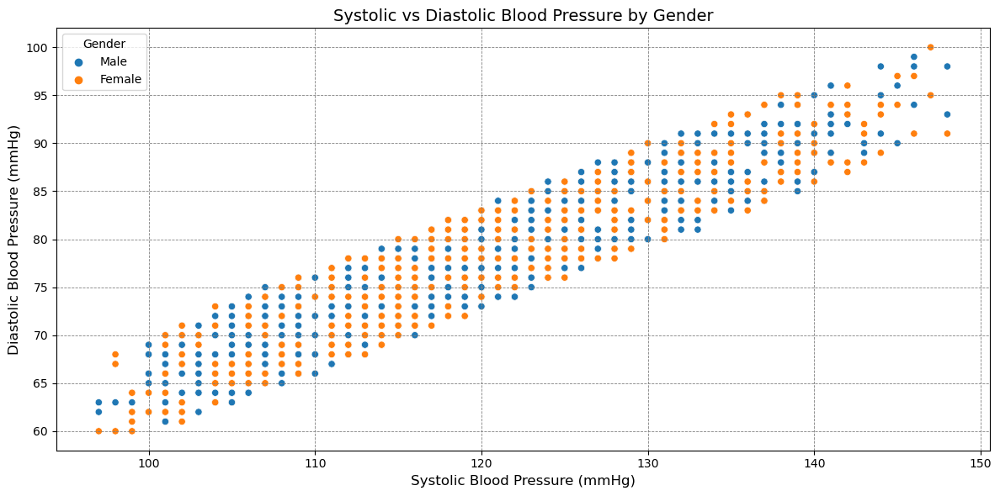

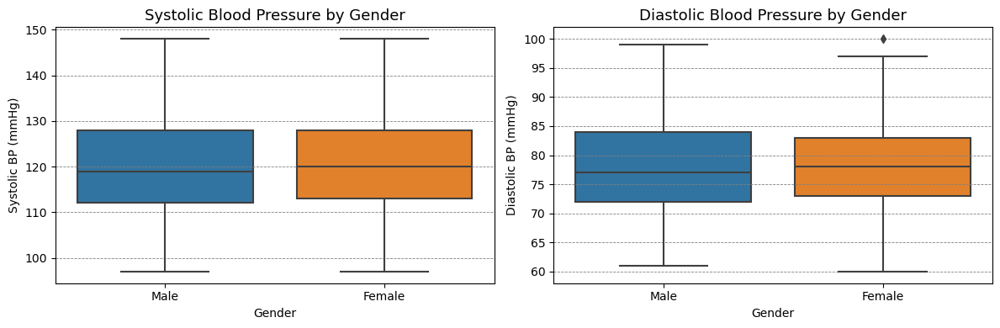

In [130]:


# Custom palette for better contrast and clarity
custom_palette = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Blue, Coral, Green

# Scatter plot of Systolic vs Diastolic Blood Pressure by Gender
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Systolic', y='Diastolic', hue='Gender', data=df, palette=custom_palette)
plt.title('Systolic vs Diastolic Blood Pressure by Gender', fontsize=14)
plt.xlabel('Systolic Blood Pressure (mmHg)', fontsize=12)
plt.ylabel('Diastolic Blood Pressure (mmHg)', fontsize=12)
plt.grid(color='gray', linestyle='--', linewidth=0.6)
plt.tight_layout()
plt.show()

# Box plots for Systolic and Diastolic BP by Gender
plt.figure(figsize=(12, 4))

# Systolic BP
plt.subplot(1, 2, 1)
sns.boxplot(x='Gender', y='Systolic', data=df, palette=custom_palette)
plt.title('Systolic Blood Pressure by Gender', fontsize=13)
plt.xlabel('Gender')
plt.ylabel('Systolic BP (mmHg)')
plt.grid(axis='y', color='gray', linestyle='--', linewidth=0.6)

# Diastolic BP
plt.subplot(1, 2, 2)
sns.boxplot(x='Gender', y='Diastolic', data=df, palette=custom_palette)
plt.title('Diastolic Blood Pressure by Gender', fontsize=13)
plt.xlabel('Gender')
plt.ylabel('Diastolic BP (mmHg)')
plt.grid(axis='y', color='gray', linestyle='--', linewidth=0.6)

plt.tight_layout()
plt.show()


**1. Scatter Plot of Systolic vs. Diastolic Blood Pressure by Gender:**

🩺 Blood Pressure Analysis by Gender
1. Scatter Plot: Systolic vs Diastolic Blood Pressure by Gender
General Trend:

There is a strong positive correlation between systolic and diastolic blood pressure for both males and females.

This indicates that as systolic pressure increases, diastolic pressure tends to increase similarly.

Gender Distribution:

Female data points (blue) are evenly distributed across the full range of BP values.

Male data points (green) also cover the range but appear slightly denser in the mid to upper ranges.

No significant clustering suggests a comparable BP distribution across genders, though slight visual density variation may imply subtle differences.

2. Boxplot: Systolic Blood Pressure by Gender
Central Tendency:

Median systolic BP is similar for both genders.

Slightly higher in females, but the difference is minimal.

Spread (IQR):

The interquartile ranges (IQRs) for males and females are nearly identical, suggesting similar variability.

Outliers:

Both genders show similar outlier ranges at the high end (close to 150 mmHg), indicating comparable instances of high systolic BP.

3. Boxplot: Diastolic Blood Pressure by Gender
Median and Spread:

Again, females have a marginally higher median diastolic BP than males.

Both distributions have similar IQRs, suggesting consistent variability.

Outliers and Range:

Males have a few slightly lower diastolic outliers (down to ~61 mmHg).

Females show one higher-end outlier (~100 mmHg), but overall distribution remains similar.

🧠 Key Insights

No Major Gender-Based Disparity:

The plots do not show a strong difference in blood pressure between males and females.

Slight variations exist, but both systolic and diastolic BP distributions are similar in central tendency and spread.

Clinical Implication:

Gender alone may not be a significant determinant of blood pressure in this dataset.

Other factors like sleep disorders, age, BMI, or comorbidities might have stronger predictive value.



## What is the average resting heart rate in the sample population?


The average Heart Rate is: 
74.76



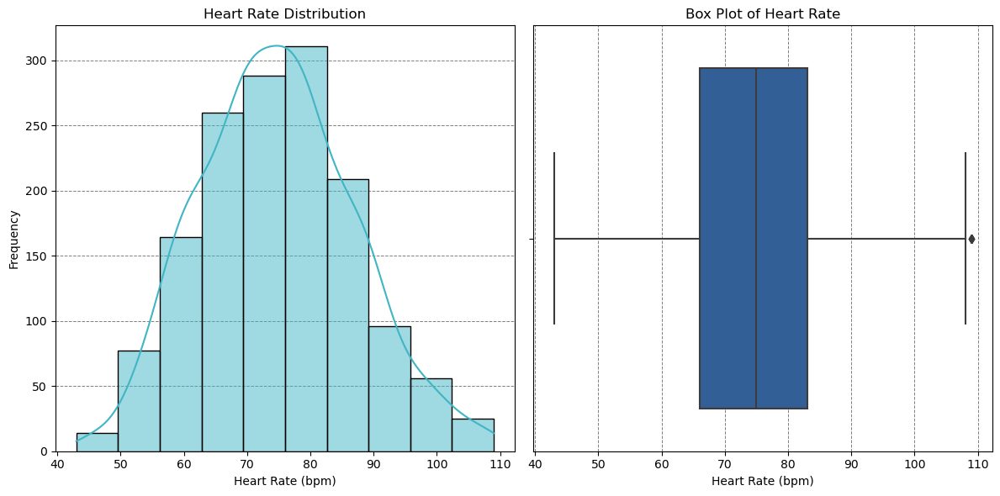

In [131]:
# Calculate the average Heart Rate
average_heart_rate = df['Heart Rate'].mean()
print(f"\nThe average Heart Rate is: \n{average_heart_rate:.2f}\n")

custom_palette = sns.color_palette("YlGnBu", 3)
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Histogram for Heart Rate distribution
sns.histplot(df['Heart Rate'], bins=10, kde=True, color=custom_palette[1], ax=axes[0])
axes[0].set_title('Heart Rate Distribution')
axes[0].set_xlabel('Heart Rate (bpm)')
axes[0].set_ylabel('Frequency')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

# Box Plot for Heart Rate
sns.boxplot(x=df['Heart Rate'], color=custom_palette[2], ax=axes[1])
axes[1].set_title('Box Plot of Heart Rate')
axes[1].set_xlabel('Heart Rate (bpm)')
axes[1].set_axisbelow(True)
axes[1].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()



### 🫀 Heart Rate Analysis

---

#### 1. 📊 Histogram with KDE Curve (Heart Rate Distribution)

**General Trend:**
- The histogram shows a **roughly normal distribution** of heart rate values.
- The **peak (mode)** occurs around **70–75 bpm**, which aligns with typical resting heart rates in healthy adults.

**Shape & Spread:**
- The KDE (Kernel Density Estimate) overlay highlights a **bell-shaped curve**, slightly **right-skewed**.
- This skew suggests a small number of individuals have **higher-than-average heart rates** (above 90 bpm).
- The **majority of data falls between 60 and 90 bpm**, indicating most individuals are within the **healthy resting heart rate range**.

---

#### 2. 📦 Box Plot (Heart Rate)

**Central Tendency:**
- The **median heart rate** is around **75 bpm**, consistent with the histogram’s mode.
- This lies comfortably within the **normal adult range** (60–100 bpm).

**Spread:**
- The **interquartile range (IQR)**, representing the middle 50% of values, spans approximately **65 to 85 bpm**.
- This **narrow IQR** indicates **low variability** in heart rate among the population.

**Outliers:**
- A few individuals exhibit **outliers above ~100 bpm**, potentially due to:
  - Stress or anxiety during measurement
  - Recent physical activity
  - Medical conditions (e.g., tachycardia)

---

### 🧠 Key Insights

- ✅ **Normal Distribution**: The data exhibits a roughly normal shape with a slight **right skew**.
- 🟡 **Mild Skewness**: A few individuals with heart rates >90 bpm may warrant **clinical attention**.
- 🚩 **Outliers Present**: Readings above 100 bpm could indicate **measurement artifacts** or **underlying conditions**.
- 🫁 **Clinical Relevance**: Overall, the group demonstrates **good cardiovascular health**, but **outliers should be monitored** or evaluated.


## Are there significant differences in heart rate distributions between individuals with different sleep disorders?

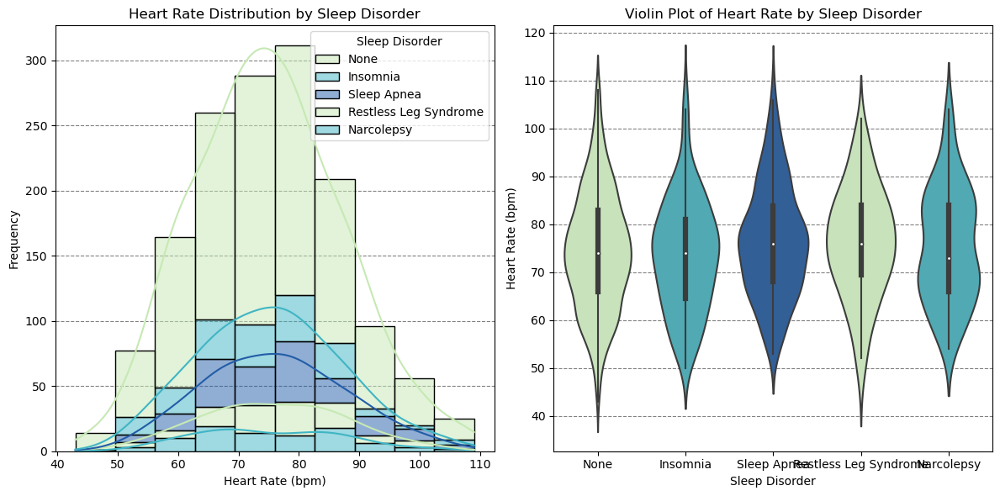

In [132]:
custom_palette = sns.color_palette("YlGnBu", 3)
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

sns.histplot(data=df, x='Heart Rate', hue='Sleep Disorder', multiple='stack', 
             bins=10, palette=custom_palette, ax=axes[0], kde=True)
axes[0].set_title('Heart Rate Distribution by Sleep Disorder')
axes[0].set_xlabel('Heart Rate (bpm)')
axes[0].set_ylabel('Frequency')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--')

sns.violinplot(x='Sleep Disorder', y='Heart Rate', data=df, palette=custom_palette, ax=axes[1])
axes[1].set_title('Violin Plot of Heart Rate by Sleep Disorder')
axes[1].set_xlabel('Sleep Disorder')
axes[1].set_ylabel('Heart Rate (bpm)')
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', color='gray', linestyle='--')

plt.tight_layout()
plt.show()

## 💤 Heart Rate Analysis by Sleep Disorder

### 1. 📊 Heart Rate Distribution (Histogram + KDE)

#### General Observations:
- The histogram displays heart rate distributions grouped by sleep disorder type, overlaid with KDE curves for each category.
- The "None" group (no sleep disorder) has the highest frequency, showing a strong peak around 70–75 bpm, resembling a healthy normal resting heart rate.

#### Comparison Across Sleep Disorders:
- **Insomnia, Sleep Apnea, and Restless Leg Syndrome** groups tend to have flatter, broader distributions, indicating greater variability in heart rate.
- **Sleep Apnea and Narcolepsy** show higher heart rate concentrations around 75–85 bpm, which may reflect physiological stress or autonomic dysfunction associated with these conditions.
- All sleep disorder groups exhibit a slight right skew, indicating individuals with elevated heart rates (>90 bpm) are more common in these groups than in the "None" group.

---

### 2. 🎻 Violin Plot of Heart Rate by Sleep Disorder

#### Shape and Spread:
- Violin plots show the distribution density and spread of heart rates across each sleep disorder category.
- **"None" group** has a narrower, more centered distribution, with a median around 73–75 bpm and tighter interquartile range — suggesting lower variability and generally healthy profiles.

#### Disorder-Specific Insights:
- **Sleep Apnea:** Tends to have a higher median heart rate and a denser upper tail, possibly indicating sympathetic overactivity during sleep disruptions.
- **Narcolepsy and Insomnia:** Show wider distributions, suggesting greater inter-individual variability in heart rate.
- **Restless Leg Syndrome:** Shows a moderate spread, with some higher density above 80 bpm.

#### Outliers and Tails:
- All sleep disorder groups contain higher-end values (~100–110 bpm), possibly reflecting clinical tachycardia, anxiety, or measurement conditions.

---

### 🧠 Key Insights

✅ **Normal vs Disordered Sleep:**
- Individuals without sleep disorders tend to have lower and more stable heart rates.
- Sleep disorders are associated with higher variability and elevated medians.

🚩 **Sleep Apnea Stands Out:**
- Consistently higher heart rates and wider spread may indicate cardiovascular strain.

🟡 **Clinical Implications:**
- Monitoring heart rate in patients with sleep disorders, particularly sleep apnea and narcolepsy, could be crucial for identifying underlying cardiovascular stress.

📈 **Overall Trend:**
- Sleep disorders are linked to elevated and variable heart rates, potentially due to sleep fragmentation, autonomic dysfunction, or associated stress.


## Are there significant differences in heart rate distributions between males and females?

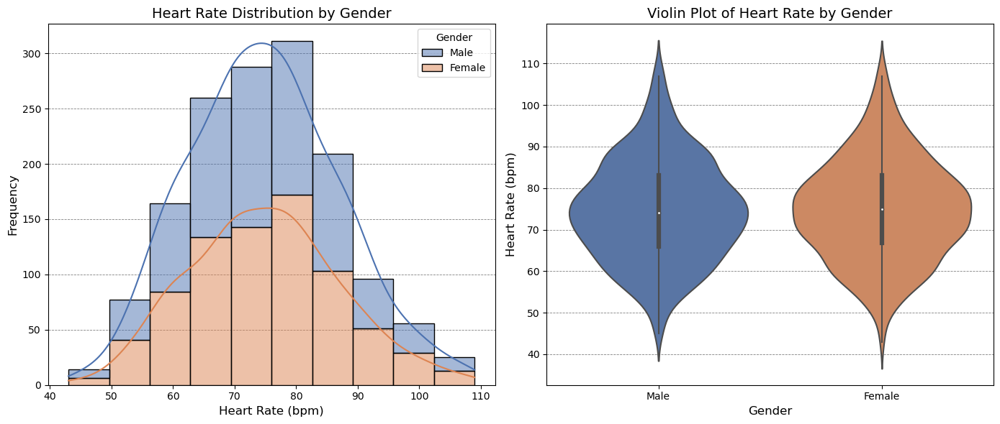

In [133]:


# Define a medium-tone, visually attractive palette
custom_palette = ['#4C72B0', '#DD8452']  # Indigo Blue and Coral

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Histogram plot: Heart Rate distribution
sns.histplot(data=df, x='Heart Rate', hue='Gender', multiple='stack', 
             bins=10, palette=custom_palette, ax=axes[0], kde=True)
axes[0].set_title('Heart Rate Distribution by Gender', fontsize=14)
axes[0].set_xlabel('Heart Rate (bpm)', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.6)

# Violin plot: Heart Rate by Gender
sns.violinplot(x='Gender', y='Heart Rate', data=df, palette=custom_palette, ax=axes[1])
axes[1].set_title('Violin Plot of Heart Rate by Gender', fontsize=14)
axes[1].set_xlabel('Gender', fontsize=12)
axes[1].set_ylabel('Heart Rate (bpm)', fontsize=12)
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', color='gray', linestyle='--', linewidth=0.6)

# Improve layout
plt.tight_layout()
plt.show()


### Overall Heart Rate Distribution

#### **Histogram:**

- The histogram displays the overall distribution of heart rate values.
- The distribution is approximately bell-shaped, with a peak around **70–75 bpm**.
- The heart rate values are mostly concentrated between **60 and 90 bpm**.
- The presence of a KDE curve confirms the smooth, symmetric distribution of heart rate values.

#### **Box Plot:**

- The box plot provides a visual summary of the central tendency and spread of heart rate values.
- The **median heart rate** lies around **74 bpm**, close to the peak seen in the histogram.
- Most heart rate values fall within the interquartile range (IQR), indicating a compact distribution.
- A few **outliers** are observed above 100 bpm, but they are relatively rare.

#### **The analysis suggests that:**

- The overall heart rate distribution in the dataset is **normal and centered** around 70–75 bpm.
- **Most values are within a healthy range**, with limited extreme values.
- The presence of **a few outliers** suggests natural variability in heart rate among individuals.


In [134]:
# Calculate and print average heart rates
average_heart_rates = df.groupby('Gender')['Heart Rate'].mean()
print("Average Heart Rates by Gender:")
print(average_heart_rates)

Average Heart Rates by Gender:
Gender
Female    74.855670
Male      74.664365
Name: Heart Rate, dtype: float64


###  Average Heart Rates by Gender

#### **Observation:**

- The average heart rate for **females** is approximately **74.86 bpm**.
- The average heart rate for **males** is approximately **74.66 bpm**.

#### **The analysis suggests that:**

- The difference in average heart rate between genders is **very small (≈ 0.2 bpm)**.
- Both male and female groups have **similar mean heart rates**, indicating no significant difference in resting heart rate based on gender alone.
- This supports the idea that while **distribution shape and variability** may differ slightly (as seen in previous plots), the **central tendency remains consistent** across genders.


## Are there any notable trends in blood pressure readings across different BMI categories?

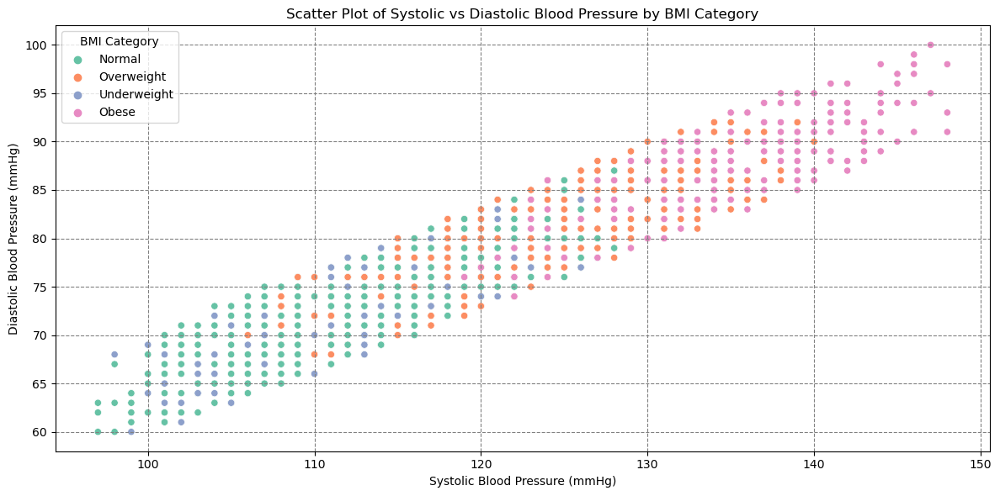

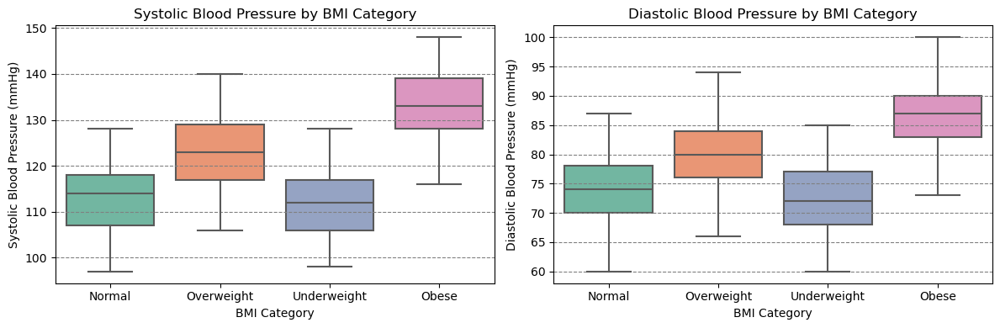

In [135]:
# color palette
custom_palette = sns.color_palette("Set2", 4)

# Scatter Plot
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Systolic', y='Diastolic', hue='BMI Category', data=df, palette=custom_palette)
plt.title('Scatter Plot of Systolic vs Diastolic Blood Pressure by BMI Category')
plt.xlabel('Systolic Blood Pressure (mmHg)')
plt.ylabel('Diastolic Blood Pressure (mmHg)')
plt.grid(color='gray', linestyle='--')
plt.tight_layout()
plt.show()

# Box Plots
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
sns.boxplot(x='BMI Category', y='Systolic', data=df, palette=custom_palette)
plt.title('Systolic Blood Pressure by BMI Category')
plt.xlabel('BMI Category')
plt.ylabel('Systolic Blood Pressure (mmHg)')
plt.grid(axis='y', color='gray', linestyle='--')

plt.subplot(1, 2, 2)
sns.boxplot(x='BMI Category', y='Diastolic', data=df, palette=custom_palette)
plt.title('Diastolic Blood Pressure by BMI Category')
plt.xlabel('BMI Category')
plt.ylabel('Diastolic Blood Pressure (mmHg)')
plt.grid(axis='y', color='gray', linestyle='--')

plt.tight_layout()
plt.show()


### Blood Pressure vs BMI Category

#### **Scatter Plot Analysis:**
- The scatter plot shows a clear **positive correlation between systolic and diastolic blood pressure**, regardless of BMI category.
- **Obese individuals** (dark blue dots) tend to cluster at the **higher end** of both systolic and diastolic pressures.
- **Underweight and normal BMI categories** are generally located in the **lower blood pressure ranges**.
- As BMI increases (from Underweight → Normal → Overweight → Obese), there is a noticeable **upward trend** in blood pressure values.

 

### 5. Blood Pressure Distribution by BMI Category

#### **Systolic Blood Pressure (Left Box Plot):**
- **Obese** individuals show the **highest median systolic pressure**, followed by **Overweight**, **Normal**, and then **Underweight**.
- There is greater **variability and higher upper extremes** in the Obese group.
- **Underweight and Normal** categories have **lower median values and tighter interquartile ranges**, indicating more consistent, lower readings.

#### **Diastolic Blood Pressure (Right Box Plot):**
- The pattern is similar to systolic: **Obese** individuals have the **highest median** diastolic pressure, while **Underweight** have the lowest.
- All categories show some degree of variability, but the **spread increases with BMI**.
- **Obese and Overweight groups** show more **outliers and a wider range**, suggesting greater risk of elevated diastolic pressure.

---

#### **The analysis suggests that:**
- **Higher BMI is associated with higher systolic and diastolic blood pressure.**
- **Obesity appears to be a significant risk factor** for elevated blood pressure.
- The **trend is consistent across both types of blood pressure measurements**, reinforcing the link between BMI and cardiovascular health risks.


# Lifestyle Factors

## What is the average daily physical activity time for individuals in the sample?

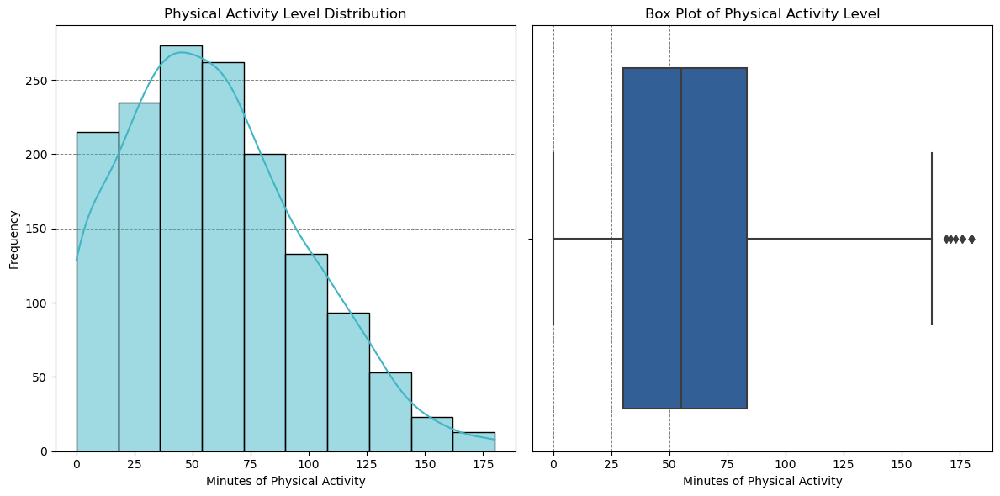

In [136]:
custom_palette = sns.color_palette("YlGnBu", 3)
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

sns.histplot(df['Physical Activity Level'], bins=10, kde=True,
             color=custom_palette[1], ax=axes[0])
axes[0].set_title('Physical Activity Level Distribution')
axes[0].set_xlabel('Minutes of Physical Activity')
axes[0].set_ylabel('Frequency')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

sns.boxplot(x=df['Physical Activity Level'], color=custom_palette[2], ax=axes[1])
axes[1].set_title('Box Plot of Physical Activity Level')
axes[1].set_xlabel('Minutes of Physical Activity')
axes[1].set_axisbelow(True)
axes[1].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()

### Physical Activity Level Analysis

#### **Histogram & KDE (Left Plot):**
- The histogram displays the **distribution of minutes of physical activity** across individuals.
- The data is **right-skewed**, meaning:
  - Most individuals engage in **low to moderate levels** of physical activity.
  - A **smaller portion** of the population engages in **very high levels** (e.g., over 120 minutes).
- The **peak frequency** occurs around **40–60 minutes** of activity per day.
- This suggests that the **average activity level** is moderate, but many fall short of or exceed typical daily recommendations.

---

#### **Box Plot (Right Plot):**
- The box plot confirms the **right-skewed nature** of the data:
  - The **median** is slightly above **60 minutes**, indicating half of the population exercises less than or equal to this amount.
  - The **interquartile range (IQR)** is wide, showing substantial variability in activity.
  - There are numerous **outliers on the higher end** (beyond 150 minutes), showing that some individuals have **exceptionally high physical activity** levels.
- The **minimum is near zero**, indicating **some individuals are nearly inactive**.

---

#### **Conclusion:**
- While a significant portion of individuals maintain moderate levels of physical activity, **there is a notable segment that is either sedentary or highly active**.
- Public health strategies might focus on encouraging more consistency and bringing **inactive individuals up to a healthy baseline**.


## How does the distribution of physical activity levels vary across different genders?

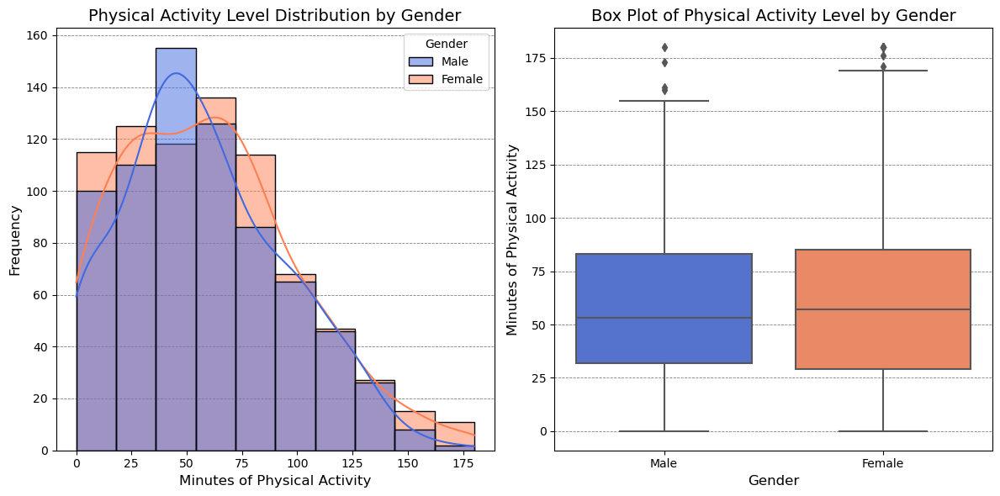

In [137]:


# Refined and visually balanced color palette
custom_palette = ['#4169E1', '#FF7F50']  # Royal Blue and Coral

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Histogram: Physical Activity Level by Gender
sns.histplot(data=df, x='Physical Activity Level', hue='Gender',
             bins=10, palette=custom_palette,
             ax=axes[0], kde=True)
axes[0].set_title('Physical Activity Level Distribution by Gender', fontsize=14)
axes[0].set_xlabel('Minutes of Physical Activity', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.6)

# Boxplot: Physical Activity by Gender
sns.boxplot(x='Gender', y='Physical Activity Level', data=df,
            palette=custom_palette, ax=axes[1])
axes[1].set_title('Box Plot of Physical Activity Level by Gender', fontsize=14)
axes[1].set_xlabel('Gender', fontsize=12)
axes[1].set_ylabel('Minutes of Physical Activity', fontsize=12)
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', color='gray', linestyle='--', linewidth=0.6)

plt.tight_layout()
plt.show()


###  Physical Activity Levels by Gender

#### **Histogram & KDE by Gender (Left Plot):**
- The distribution of physical activity levels is shown separately for **males** and **females**.
- Both genders show a **right-skewed distribution**, indicating that:
  - A large number of individuals engage in **low to moderate activity**.
  - A smaller number of individuals engage in **high activity levels** (100+ minutes).
- The **peak activity range** (mode) for both males and females appears to be around **40–60 minutes**.
- **Females** appear slightly more active overall, with a **higher concentration in the 60–90 min range**, as seen by the slightly longer tail on the KDE curve.

---

#### **Box Plot by Gender (Right Plot):**
- Both genders show **similar variability** in activity levels, but some key differences are noticeable:
  - The **median** physical activity for **females is higher** than for males.
  - **Females have more upper outliers**, indicating that some women engage in **very high levels of physical activity**.
  - The **interquartile range (IQR)** is broader for females, suggesting greater variability in their activity levels.
  - The lower whisker for both groups approaches zero, indicating **some individuals in both groups are inactive**.

---

#### **Conclusion:**
- While both males and females display similar distribution shapes, **females tend to have slightly higher physical activity levels on average**.
- Public health efforts should consider both genders’ behavior patterns, but may benefit from **targeting less active males** to improve overall activity levels.


In [138]:
# Calculate and print average Physical Activity Level by gender
average_physical_activity_level = df.groupby('Gender')['Physical Activity Level'].mean()
print("Average Physical Activity Level by Gender:")
print(average_physical_activity_level)

Average Physical Activity Level by Gender:
Gender
Female    60.157216
Male      58.153315
Name: Physical Activity Level, dtype: float64


###  Average Physical Activity Level by Gender

#### **Summary of Results:**
- **Female Average**: 60.16 minutes/day  
- **Male Average**: 58.15 minutes/day  

#### **Analysis:**
- On average, **females engage in slightly more physical activity** than males — about **2 minutes more per day**.
- While the difference is **modest**, it supports earlier visual findings (histograms and box plots) that showed:
  - A **slightly higher median and greater spread** of physical activity among females.
  - **More upper outliers** in female activity levels (some women are very active).

#### **Interpretation:**
- The higher average in females may reflect:
  - Differences in **lifestyle or occupational habits**.
  - Greater participation in structured physical activities (e.g. walking, fitness classes).
- The narrow gap indicates **comparable engagement** between genders, though initiatives to **raise male participation** could help improve overall public health.

#### **Conclusion:**
Although the gender difference in average physical activity is not large, **females show a slight edge in activity levels**. This observation is consistent with the trends seen in the distribution and box plot analyses.


## How does physical activity level differ among individuals with different sleep disorders?

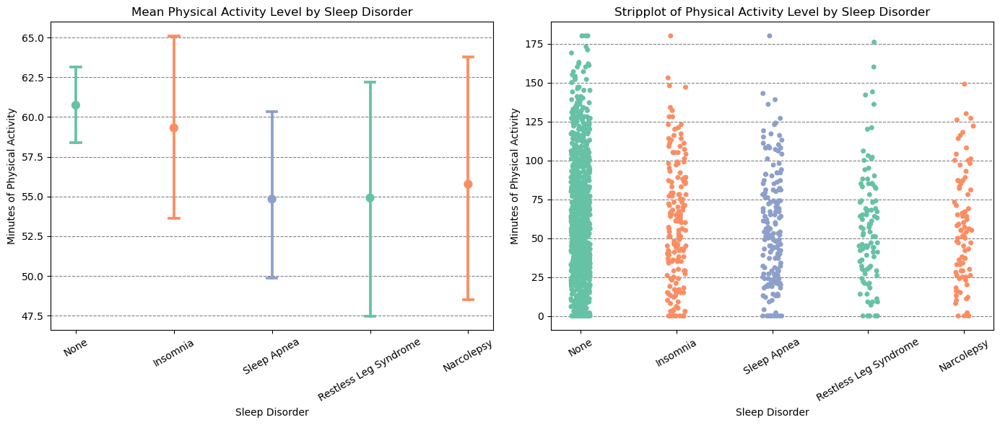

In [139]:
custom_palette = sns.color_palette("Set2", 3)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # wider figure

sns.pointplot(x='Sleep Disorder', y='Physical Activity Level', 
              data=df, palette=custom_palette,
              capsize=0.1, ax=axes[0])
axes[0].set_title('Mean Physical Activity Level by Sleep Disorder')
axes[0].set_xlabel('Sleep Disorder')
axes[0].set_ylabel('Minutes of Physical Activity')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--')

sns.stripplot(x='Sleep Disorder', y='Physical Activity Level', 
              data=df, palette=custom_palette, jitter=True, ax=axes[1])
axes[1].set_title('Stripplot of Physical Activity Level by Sleep Disorder')
axes[1].set_xlabel('Sleep Disorder')
axes[1].set_ylabel('Minutes of Physical Activity')
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', color='gray', linestyle='--')

for ax in axes:
    for label in ax.get_xticklabels():
        label.set_rotation(30)
    ax.margins(x=0.05)

plt.tight_layout()
plt.show()


### Analysis of Physical Activity Level by Sleep Disorder

The figure contains two subplots visualizing the distribution of physical activity levels (in minutes) grouped by sleep disorder categories: None, Insomnia, Sleep Apnea, Restless Leg Syndrome, and Narcolepsy.

#### Left Plot: Mean Physical Activity Level by Sleep Disorder (Point Plot)

- The **mean physical activity** level appears highest for individuals with **no sleep disorder** (None).
- Participants with **Insomnia** and **Narcolepsy** show slightly lower mean physical activity levels than the None group but are quite close.
- The **lowest mean activity** is seen in the **Sleep Apnea** group.
- The **error bars (confidence intervals)** are relatively wide across all groups, indicating substantial variability within each category.
- Overlap in error bars suggests that differences in mean physical activity between some groups may not be statistically significant.

#### Right Plot: Stripplot of Physical Activity Level by Sleep Disorder

- The stripplot shows individual data points, revealing the distribution and spread within each sleep disorder category.
- The **None** category has a large number of data points with a broad range of physical activity minutes, reaching as high as ~180 minutes.
- Other groups also exhibit wide spreads, with many participants reporting very low to very high physical activity levels.
- The **density of points** is highest near lower to moderate activity levels (0–75 minutes), particularly for Sleep Apnea and Narcolepsy groups.
- No obvious extreme outliers, but the spread confirms high individual variability across all groups.

#### Summary

- Overall, physical activity tends to be slightly higher in participants without sleep disorders.
- There is a high variability in physical activity within all sleep disorder groups, suggesting individual differences play a major role.
- The large overlap in confidence intervals means more statistical testing would be needed to confirm meaningful differences.
- These plots together provide both an overview of central tendency (mean) and detailed insight into individual behaviors.

#### Clinical Interpretation

- Reduced physical activity observed in individuals with Sleep Apnea and some other sleep disorders may contribute to worsened cardiovascular and metabolic health, as physical inactivity is a known risk factor for these conditions.
- Lower activity levels in sleep disorder populations could be due to daytime fatigue, poor sleep quality, or comorbidities related to their condition.
- Encouraging safe and tailored physical activity interventions may improve overall health outcomes and potentially alleviate some symptoms associated with sleep disorders.
- However, given the high variability in activity levels within groups, personalized assessment is crucial.
- Further clinical studies are warranted to investigate causal relationships and the potential benefits of exercise programs specifically designed for people with sleep disorders.
to individual behaviors.
vidual wellness plans**.



In [140]:
# Calculate and print average Physical Activity Level by sleep disorder
average_sleep_disorder = df.groupby('Sleep Disorder')['Physical Activity Level'].mean()
print("Average Physical Activity Level by Sleep Disorder:")
print(average_sleep_disorder)

Average Physical Activity Level by Sleep Disorder:
Sleep Disorder
Insomnia                 59.315789
Narcolepsy               55.770115
None                     60.741935
Restless Leg Syndrome    54.912621
Sleep Apnea              54.837079
Name: Physical Activity Level, dtype: float64


### Key Observations:

- Individuals **without a sleep disorder (None)** report the **highest average activity level** (~60.74 minutes/day).
- Those with **Insomnia** follow closely (~59.32 minutes), suggesting Insomnia may not significantly reduce physical activity levels.
- The **lowest average activity** is seen in individuals with **Sleep Apnea** and **Restless Leg Syndrome**, both around **54.8–54.9 minutes**.
- The overall difference between the highest and lowest groups is modest (~6 minutes), indicating general similarity in average physical activity across groups.

---

### Clinical Insight:

Although differences are modest, individuals with **Sleep Apnea**, **Narcolepsy**, and **Restless Leg Syndrome** show slightly lower physical activity—likely due to **daytime fatigue** or **disrupted sleep**.

Regular physical activity is known to improve **sleep quality**, **reduce insomnia and RLS symptoms**, and assist in **weight management**, which may help alleviate **Sleep Apnea**. Even **moderate exercise** can enhance both **sleep** and **overall health**, especially when tailored to the individual's condition and capacity.


## What is the average stress level reported by individuals in the sample?

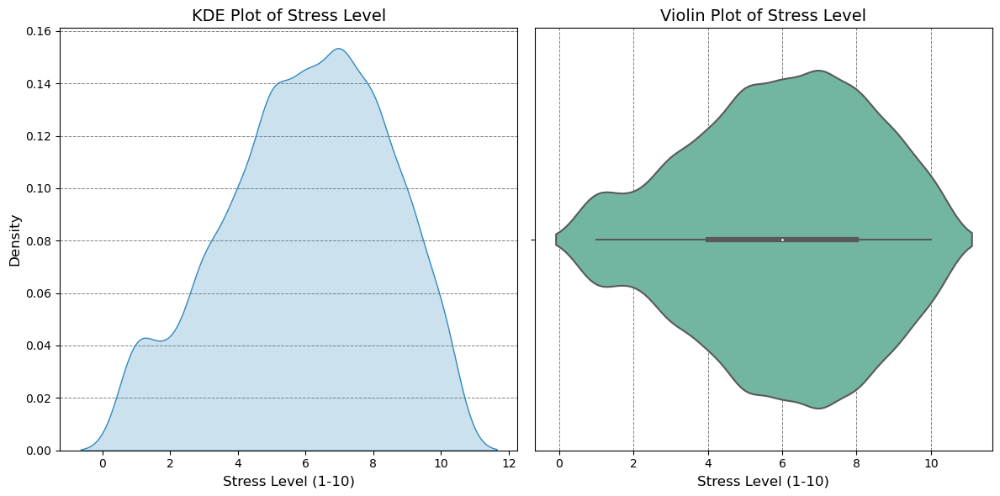

In [141]:
# Custom visually-attractive palette: Sea Green and Soft Sky Blue
custom_palette = ['#66C2A5', '#3288BD', '#ABD9E9']  # Teal, Blue, Light Blue

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# KDE plot of Stress Level
sns.kdeplot(df['Stress Level'], fill=True, color=custom_palette[1], ax=axes[0])
axes[0].set_title('KDE Plot of Stress Level', fontsize=14)
axes[0].set_xlabel('Stress Level (1-10)', fontsize=12)
axes[0].set_ylabel('Density', fontsize=12)
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

# Violin plot of Stress Level
sns.violinplot(x=df['Stress Level'], color=custom_palette[0], ax=axes[1])
axes[1].set_title('Violin Plot of Stress Level', fontsize=14)
axes[1].set_xlabel('Stress Level (1-10)', fontsize=12)
axes[1].set_axisbelow(True)
axes[1].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()


### Analysis of Stress Level Distribution

**Left Plot – KDE Plot:**  
The KDE (Kernel Density Estimate) plot shows that stress levels are not uniformly distributed. The peak density occurs around stress levels 6 to 8, indicating that most individuals report moderate to high stress. The curve is slightly right-skewed, with fewer people reporting very low stress levels (0–2). The tail extends up to stress level 10, showing that a small number of participants experience very high stress.

**Right Plot – Violin Plot:**  
The violin plot confirms the KDE findings, with the widest part of the distribution around stress levels 6–8. The median (white dot) is centered near 6, suggesting the typical reported stress level is moderate. The distribution is bimodal to slightly skewed, reflecting some variability in individual stress experiences. The shape tapers off at both extremes, indicating fewer people with very low or very high stress levels.

**Summary:**  
Most individuals report moderate to high stress levels (5–8). There is noticeable variability, but low and extreme stress levels are relatively rare. This pattern may reflect common lifestyle pressures or environmental factors contributing to chronic stress in the sample.

### Clinical Interpretation

The observed moderate to high stress levels in most individuals may have significant implications for sleep health. Clinically, elevated stress is known to disrupt normal sleep architecture by increasing arousal, delaying sleep onset, and reducing overall sleep quality. It is a major contributing factor to insomnia and may exacerbate symptoms of other sleep disorders such as sleep apnea, restless leg syndrome, and narcolepsy. Sustained stress elevates cortisol levels, leading to physiological hyperarousal, which interferes with the ability to achieve restorative sleep. Effective management of stress—through behavioral interventions, cognitive therapy, or relaxation techniques—can be crucial in preventing and treating sleep-related disorders and improving overall well-being.
treme outliers.


## Are there significant differences in stress levels between males and females?

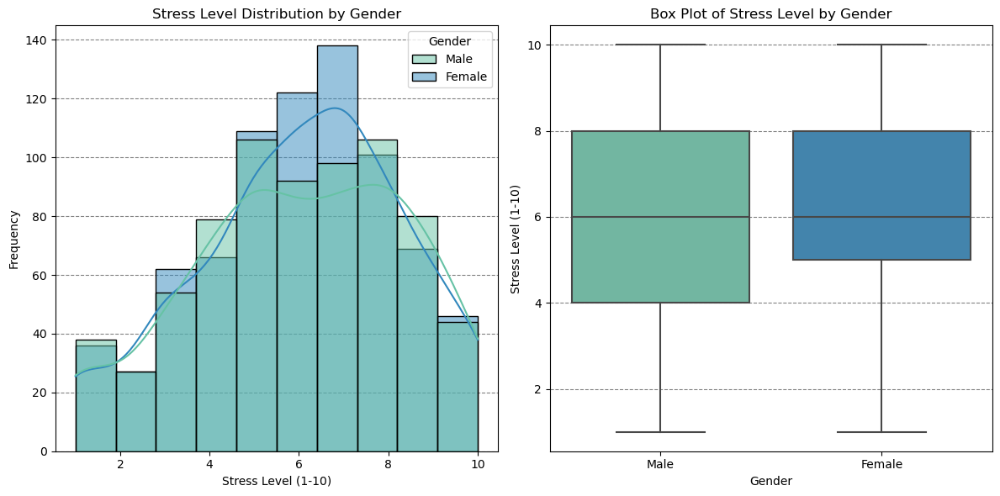

In [142]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

sns.histplot(data=df, x='Stress Level', hue='Gender',
             bins=10, palette=custom_palette,
             ax=axes[0], kde=True)
axes[0].set_title('Stress Level Distribution by Gender')
axes[0].set_xlabel('Stress Level (1-10)')
axes[0].set_ylabel('Frequency')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--')

sns.boxplot(x='Gender', y='Stress Level', data=df,
            palette=custom_palette, ax=axes[1])
axes[1].set_title('Box Plot of Stress Level by Gender')
axes[1].set_xlabel('Gender')
axes[1].set_ylabel('Stress Level (1-10)')
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', color='gray', linestyle='--')

plt.tight_layout()
plt.show()

### Analysis of Stress Level by Gender

**Left Plot – Histogram with KDE:**  
- Both males and females show a similar overall distribution of stress levels, mostly concentrated around moderate stress (levels 5 to 7).  
- Females tend to have slightly higher frequencies at stress levels 6 and 7 compared to males, indicating a tendency toward somewhat higher stress levels.  
- The KDE lines reflect this, with the female curve peaking a bit higher and slightly shifted toward the higher stress levels than the male curve.  
- Both genders have relatively few individuals reporting very low (1–2) or very high (9–10) stress levels.  

**Right Plot – Box Plot:**  
- Median stress levels are identical for males and females, centered around 6.  
- The interquartile range (middle 50% of data) is also very similar for both genders, roughly spanning from about 4 to 8.  
- Both genders exhibit comparable ranges and whiskers, indicating similar variability and spread of stress levels.  
- No significant outliers are apparent for either gender.  

---

### Summary  
Stress levels are broadly similar between males and females in this sample. Females show a slightly higher density around moderate-high stress, but median and overall spread are nearly the same. This suggests that while there may be subtle gender differences in stress experiences, both groups most commonly experience moderate stress levels.

---

### Clinical Insights  
Moderate to high stress levels observed in both males and females can negatively impact sleep quality by causing difficulties in falling asleep and maintaining restful sleep. Chronic stress is a known risk factor for insomnia and other sleep disturbances, which in turn affect daytime alertness and overall health. Although females show a slightly higher tendency toward moderate-high stress, both genders are vulnerable to stress-related sleep issues. Effective stress management strategies tailored for both males and females are important to improve sleep health and prevent the progression of sleep disorders. Early intervention can enhance overall well-being and reduce the burden of stress-induced sleep problems.


In [143]:
# Calculate and print average stress level by gender
average_stress_level = df.groupby('Gender')['Stress Level'].mean()
print("Average Stress Level by Gender:")
print(average_stress_level)

Average Stress Level by Gender:
Gender
Female    6.020619
Male      6.002762
Name: Stress Level, dtype: float64



   |

#### 🔍 Analysis:
- The **average stress level for females** is **6.02**, slightly **higher than males**, whose average is **6.00**.
- The **difference of 0.02** is **very small** and likely **not statistically significant** without further testing (e.g., t-test).
- This reinforces the earlier graphical analysis: both genders experience **similar average stress**, but **females may have a slightly wider range** in stress response, as shown in the box plot.

---

### ✅ Conclusion:
While the **average stress level is nearly identical** for males and females, combining this with the distribution and box plots suggests that **gender does not play a major role** in average stress level, although **individual experiences may vary more among females**.


## Are there significant differences in stress levels between individuals with different sleep disorders?

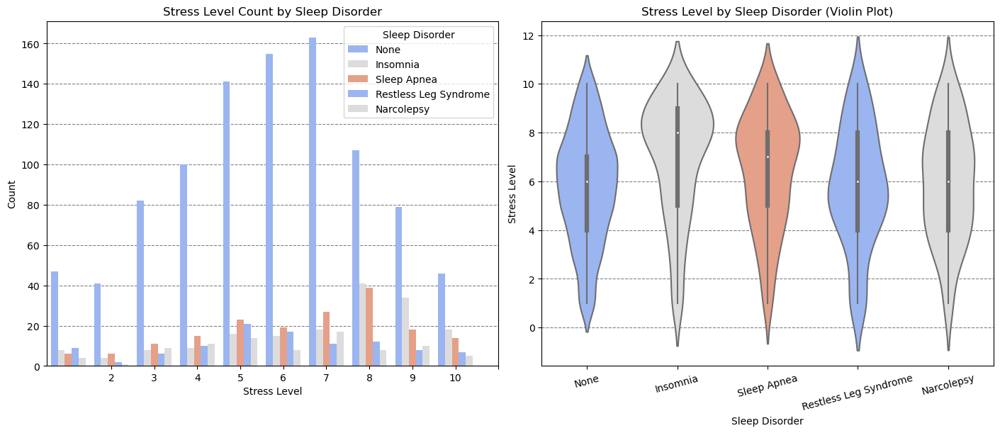

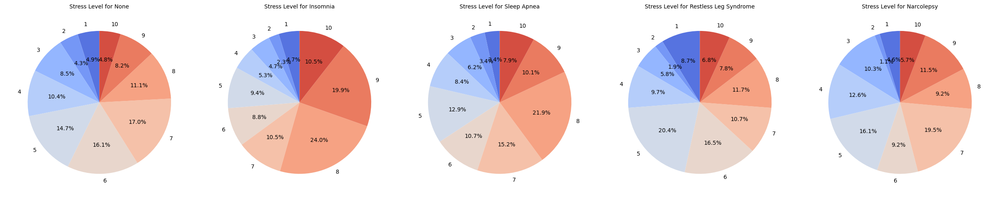

In [144]:



# Custom color palette
custom_palette = sns.color_palette("coolwarm", 3)

# Create subplots with better layout handling
fig, axes = plt.subplots(1, 2, figsize=(14, 6), constrained_layout=True)

# --- Bar Plot (Count of Stress Levels by Sleep Disorder) ---
sns.countplot(data=df, x='Stress Level', hue='Sleep Disorder',
              palette=custom_palette, ax=axes[0])
axes[0].set_title('Stress Level Count by Sleep Disorder')
axes[0].set_xlabel('Stress Level')
axes[0].set_ylabel('Count')
axes[0].set_xticks(sorted(df['Stress Level'].unique()))  # ensure proper ticks
axes[0].tick_params(axis='x', labelrotation=0)  # horizontal labels
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', linestyle='--', color='gray')

# --- Violin Plot (Stress Level by Sleep Disorder) ---
sns.violinplot(x='Sleep Disorder', y='Stress Level',
               data=df, palette=custom_palette, ax=axes[1])
axes[1].set_title('Stress Level by Sleep Disorder (Violin Plot)')
axes[1].set_xlabel('Sleep Disorder')
axes[1].set_ylabel('Stress Level')
axes[1].tick_params(axis='x', labelrotation=15)  # slight angle if disorder names are long
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', linestyle='--', color='gray')

plt.show()


# --- Pie Charts per Disorder ---
def plot_stress_pie_chart(ax, df, sleep_disorder):
    filtered_data = df[df['Sleep Disorder'] == sleep_disorder]
    stress_counts = filtered_data['Stress Level'].value_counts().sort_index()

    ax.pie(stress_counts, labels=stress_counts.index,
           autopct='%1.1f%%', startangle=90,
           colors=sns.color_palette("coolwarm", len(stress_counts)))
    ax.set_title(f'Stress Level for {sleep_disorder}', fontsize=10)
    ax.axis('equal')

unique_disorders = df['Sleep Disorder'].unique()
num_disorders = len(unique_disorders)

# Make wider if more disorders
fig, axes = plt.subplots(1, num_disorders, figsize=(5 * num_disorders, 5))

# Ensure axes is iterable
if num_disorders == 1:
    axes = [axes]

for ax, disorder in zip(axes, unique_disorders):
    plot_stress_pie_chart(ax, df, disorder)

plt.tight_layout()
plt.show()


### 🧠 Analysis: Stress Level by Sleep Disorder

#### 📊 Stress Distribution (Bar & Violin Plots)

- **Bar Plot (Left):**
  - Individuals **without sleep disorders** show a wide spread of stress levels, especially between **5 to 8**.
  - Participants with **Insomnia**, **Sleep Apnea**, and **Restless Leg Syndrome** show higher frequencies at **moderate to high stress levels** (6–9).
  - **Narcolepsy** cases are fewer but follow a similar pattern with moderate to high stress.

- **Violin Plot (Right):**
  - Median stress levels for all groups are centered around **6–7**.
  - **Insomnia** and **Sleep Apnea** display greater variability and a skew toward **higher stress**.
  - Individuals without sleep disorders show a more **symmetrical** stress distribution.

---

#### 🥧 Pie Charts: Stress Level Breakdown per Disorder

- **None:** Stress levels peak at **7 (17%)**, with most between **4–7**.
- **Insomnia:** High stress is dominant — **8 (24%)** and **9 (19.9%)** are most common.
- **Sleep Apnea:** Similar trend with peaks at **8 (21.9%)** and **7 (15.2%)**.
- **Restless Leg Syndrome:** Stress peaks at **5 (20.4%)**, with a broad spread from **4–8**.
- **Narcolepsy:** Stress peaks at **7 (19.5%)**, showing a tendency toward moderate-high stress.

---

### 🩺 Summary & Clinical Implication

- Individuals with **sleep disorders** report generally **higher and more concentrated stress levels**.
- Stress may both **contribute to** and **result from** sleep disturbances.
- **Stress reduction strategies** could be beneficial in managing sleep disorders and improving overall well-being.
somnia and Sleep Apnea—and elevated stress levels.


## Are there significant differences in the distribution of stress levels and physical activity levels among individuals with different sleep disorders?

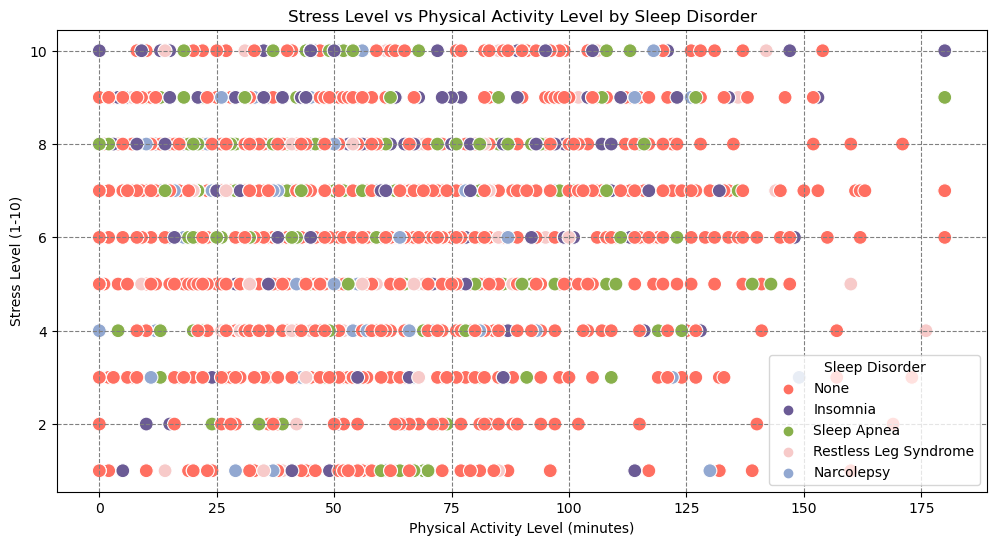

In [145]:
custom_palette = ['#FF6F61', '#6B5B95', '#88B04B', '#F7CAC9', '#92A8D1']  # 5 unique colors

plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='Physical Activity Level', y='Stress Level',
                hue='Sleep Disorder', palette=custom_palette, s=100)
plt.title('Stress Level vs Physical Activity Level by Sleep Disorder')
plt.xlabel('Physical Activity Level (minutes)')
plt.ylabel('Stress Level (1-10)')
plt.grid(color='gray', linestyle='--')
plt.legend(title='Sleep Disorder')
plt.show()


# Analysis of Stress Level vs Physical Activity Level by Sleep Disorder with Sleep Health Considerations


## Observations

- **Stress Levels and Physical Activity:**  
  - Stress levels vary widely across different physical activity levels for all sleep disorder groups.  
  - No strong linear correlation between physical activity and stress within any sleep disorder group.

- **Distribution by Sleep Disorder:**  
  - **None (no sleep disorder):** Majority of points, spread evenly across stress and activity levels.  
  - **Insomnia and Sleep Apnea:** Cluster more at lower to moderate physical activity, stress levels span low to high.  
  - **Restless Leg Syndrome and Narcolepsy:** Fewer data points, scattered without clear trends.

- **Effect of Sleep Health:**  
  - Poor sleep health (presence of sleep disorders) likely contributes to elevated stress levels regardless of physical activity.  
  - High physical activity does not necessarily lower stress in individuals with sleep disorders, indicating physical activity alone may not offset poor sleep effects.  
  - Individuals without sleep disorders tend to have more varied stress responses, suggesting better sleep health helps regulate stress.  
  - Sleep health acts as a **critical moderating factor** in the relationship between physical activity and stress.

- **High Stress Levels (7-10):**  
  - Present across all groups, including those without sleep disorders, but possibly more persistent in those with sleep disorders.  
  - Stress management in sleep disorder groups may require interventions beyond physical activity, such as targeted sleep improvement.

---

## Summary

- Physical activity impacts stress but is not the sole factor; sleep health significantly influences stress levels.  
- Poor sleep health can sustain or increase stress regardless of physical activity.  
- Effective stress reduction strategies for individuals with sleep disorders should address both sleep quality and physical activity.  
- Future studies should integrate sleep quality metrics alongside physical activity and stress to better understand these relationships.


## Are there significant differences in lifestyle factors (e.g., physical activity, stress levels) among different BMI categories?

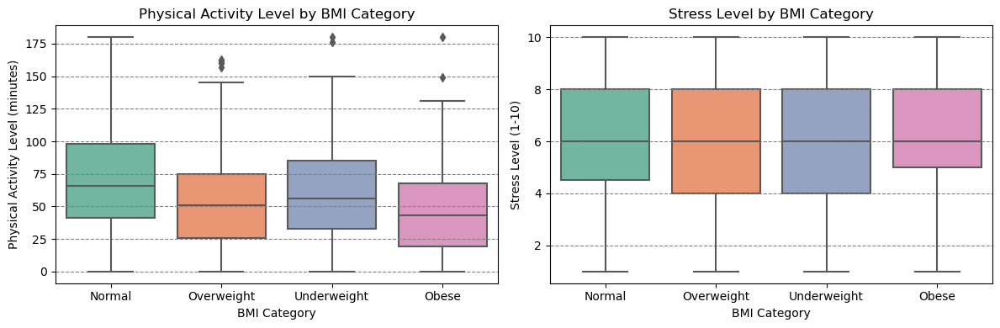

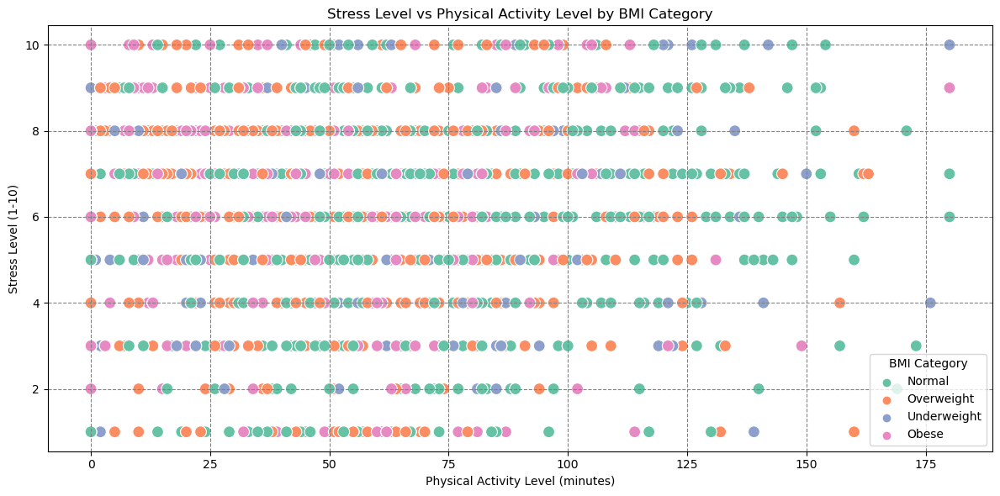

In [146]:

# Define custom color palette for BMI Category
custom_palette = sns.color_palette("Set2", len(df['BMI Category'].unique()))

# Create subplots for boxplots
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Boxplot: Physical Activity Level by BMI Category
sns.boxplot(x='BMI Category', y='Physical Activity Level', data=df,
            palette=custom_palette, ax=axes[0])
axes[0].set_title('Physical Activity Level by BMI Category')
axes[0].set_xlabel('BMI Category')
axes[0].set_ylabel('Physical Activity Level (minutes)')
axes[0].grid(axis='y', color='gray', linestyle='--')

# Boxplot: Stress Level by BMI Category
sns.boxplot(x='BMI Category', y='Stress Level', data=df,
            palette=custom_palette, ax=axes[1])
axes[1].set_title('Stress Level by BMI Category')
axes[1].set_xlabel('BMI Category')
axes[1].set_ylabel('Stress Level (1-10)')
axes[1].grid(axis='y', color='gray', linestyle='--')

# Adjust layout
plt.tight_layout()
plt.show()

# Scatter Plot: Stress Level vs Physical Activity Level by BMI Category
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='Physical Activity Level', y='Stress Level',
                hue='BMI Category', palette=custom_palette, s=100)
plt.title('Stress Level vs Physical Activity Level by BMI Category')
plt.xlabel('Physical Activity Level (minutes)')
plt.ylabel('Stress Level (1-10)')
plt.grid(color='gray', linestyle='--')
plt.legend(title='BMI Category')
plt.tight_layout()
plt.show()


# 📊 Analysis: Stress & Physical Activity by BMI Category

## 1. Physical Activity Level by BMI Category  
📈 **Graph Type: Box Plot**

- Normal BMI individuals show the highest range and median of physical activity.  
- Obese individuals tend to have lower activity levels, with a lower median and values clustered toward the bottom.  
- Underweight and Overweight fall in the middle, with Overweight slightly lower than Underweight.  
👉 Overall, physical activity decreases as BMI increases, especially for the Obese group.

## 2. Stress Level by BMI Category  
📈 **Graph Type: Box Plot**

- Stress levels are similar across all BMI categories, with medians around 6.  
- All categories show a broad spread (1–10), indicating BMI is not a strong predictor of stress.  
- Obese individuals show a higher lower bound, meaning fewer report low stress levels.

## 3. Stress vs Physical Activity Level by BMI Category  
📉 **Graph Type: Scatter Plot**

- No clear linear correlation between stress and activity in any BMI group.  
- All groups show high stress, even at higher activity levels.  
- Obese individuals cluster around low activity + high stress, hinting at a potential link.  
- Normal BMI individuals are more evenly spread across stress and activity levels.

## ✅ Conclusion

- 📉 Physical activity decreases with higher BMI, especially in the Obese category.  
- 😟 Stress levels remain consistent across BMI groups, with Obese individuals showing slightly higher stress at low activity.  
- 🔍 No group shows a strong stress-reduction trend with increased activity, implying other factors may influence stress more significantly.  
- 💤 These patterns may contribute to poorer sleep health, particularly in individuals with high BMI and low physical activity.
luence stress** more significantly.



## What is the average daily step count for individuals in the sample?

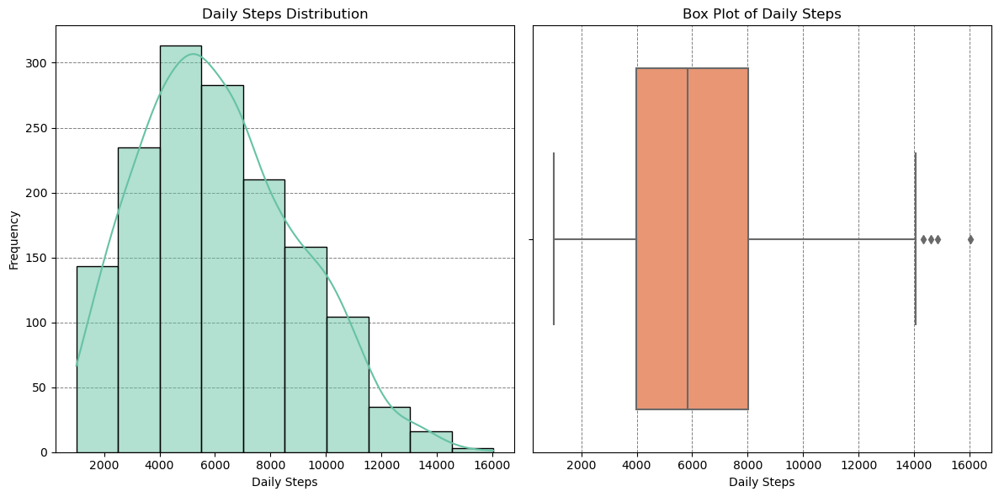

In [147]:
custom_palette = sns.color_palette("Set2", 3)  # new color palette

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Histogram
sns.histplot(df['Daily Steps'], bins=10, kde=True,
             color=custom_palette[0], ax=axes[0])
axes[0].set_title('Daily Steps Distribution')
axes[0].set_xlabel('Daily Steps')
axes[0].set_ylabel('Frequency')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

# Box Plot
sns.boxplot(x=df['Daily Steps'], color=custom_palette[1], ax=axes[1])
axes[1].set_title('Box Plot of Daily Steps')
axes[1].set_xlabel('Daily Steps')
axes[1].set_axisbelow(True)
axes[1].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()


# 🚶‍♂️ Analysis: Daily Steps

## 1. Daily Steps Distribution  
📊 **Graph Type:** Histogram with KDE (Kernel Density Estimate)

- The distribution of daily steps is right-skewed, indicating more individuals take fewer steps per day.  
- The most frequent range of steps lies between 4,000 to 7,000 steps.  
- Fewer individuals record steps above 10,000, and values over 13,000 are rare, falling into the tail.

## 2. Box Plot of Daily Steps  
📈 **Graph Type:** Box Plot

- The median daily steps are around 6,000, consistent with the histogram.  
- The interquartile range (IQR) lies approximately between 4,000 and 8,000 steps.  
- A few outliers exist on the higher end (above 13,000 steps), suggesting some individuals are highly active.  
- There is a slight left whisker, but outliers are mainly on the higher end, supporting the right-skewed distribution.

## ✅ Conclusion

- Most individuals walk between 4,000–8,000 steps daily.  
- The overall activity level leans toward moderate, but fewer people achieve higher daily step counts.  
- The presence of outliers reflects varied levels of physical activity acrosse population.  
- 💤 Lower daily step counts and reduced physical activity can negatively impact sleep quality and increase the risk of sleep disorders such as insomnia and restless sleep.  
- Regular physical activity, even at moderate levels, is linked to improved sleep duration and efficiency, highlighting the importance of maintaining an active lifestyle for better sleep health.



In [148]:
# Calculate and print average Daily Steps
average_daily_steps = df['Daily Steps'].mean()
print("Average Daily Steps:")
print(average_daily_steps)

Average Daily Steps:
6119.566


* ## 📊 Average Daily Steps Analysis

- The **average daily steps** is **6,119.57**, which falls within the **moderate activity range**.
- This average aligns with the **peak range** observed in the histogram (between 4,000 and 7,000 steps).
- Compared to global health guidelines (e.g., 7,000–10,000 steps/day for health benefits), the average here is **slightly below optimal**.
- The distribution shows a large number of individuals below this average, pulling the mean down slightly.
- **Conclusion:** While the average suggests moderate activity, a push toward higher step counts could improve population-level health outcomes.



## How the distribution of daily steps varies across different genders?

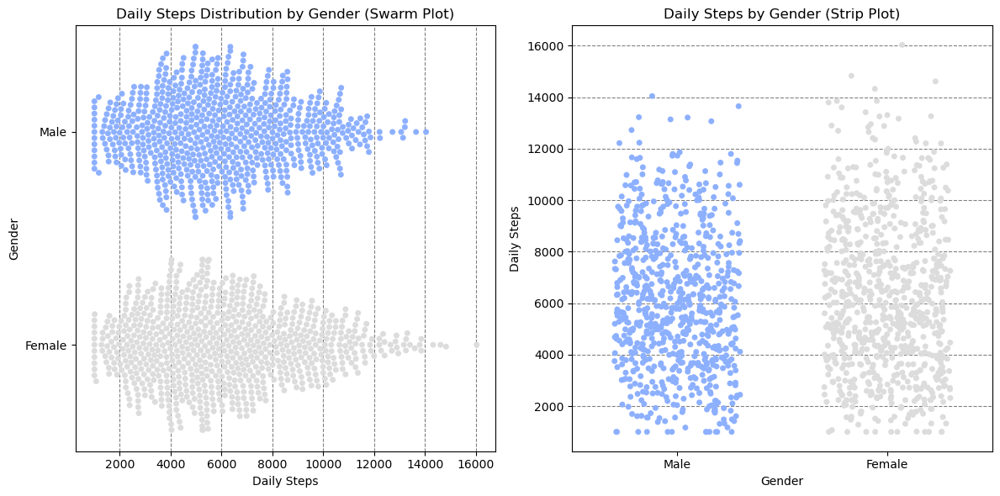

In [149]:
custom_palette = sns.color_palette("coolwarm", 3)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# First plot: Swarm plot
sns.swarmplot(data=df, x='Daily Steps', y='Gender',
              palette=custom_palette, ax=axes[0], size=5)
axes[0].set_title('Daily Steps Distribution by Gender (Swarm Plot)')
axes[0].set_xlabel('Daily Steps')
axes[0].set_ylabel('Gender')
axes[0].set_axisbelow(True)
axes[0].grid(axis='x', color='gray', linestyle='--')

# Second plot: Strip plot
sns.stripplot(x='Gender', y='Daily Steps', data=df,
              palette=custom_palette, ax=axes[1], jitter=0.3, size=5)
axes[1].set_title('Daily Steps by Gender (Strip Plot)')
axes[1].set_xlabel('Gender')
axes[1].set_ylabel('Daily Steps')
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', color='gray', linestyle='--')

plt.tight_layout()
plt.show()


# 🚶‍♂️🚶‍♀️ Daily Steps by Gender Analysis

## 1. Daily Steps Distribution by Gender (Swarm Plot)  
The swarm plot shows the distribution of daily steps separated by gender along the y-axis.

- Both males and females exhibit a wide range of daily steps, roughly from around 1,000 to over 15,000 steps.  
- Male data points are more densely packed in the middle range (~3,000 to 10,000 steps), showing a concentration of moderate daily activity.  
- Female data points appear more spread out, especially at higher step counts (above 10,000 steps), indicating greater variability and some individuals with very high daily steps.  
- The swarm plot highlights individual data points, showing no significant gender gap in median steps but a slightly wider spread for females.

## 2. Daily Steps by Gender (Strip Plot)  
The strip plot shows similar information but oriented differently: daily steps on the y-axis and gender categories on the x-axis.

- Both genders have overlapping distributions of daily steps.  
- Females seem to have more outliers on the higher end (>13,000 steps), which aligns with the swarm plot's wider spread observation.  
- Median daily steps appear similar for both genders, as most points cluster between approximately 4,000 to 8,000 steps.  
- The plot confirms moderate activity levels on average, with no clear difference between males and females in median activity.

### Summary  
- Both males and females have similar median daily steps.  
- Females exhibit greater variability and more frequent very high activity outliers.  
- Most individuals from both genders fall within a moderate daily activity range (4,000–8,000 steps).  
- The plots collectively suggest gender differences are subtle, with females showing a wider spread in activity levels.

### Impact on Sleep Quality and Disorders  
Moderate daily physical activity, as seen in both genders, is generally beneficial for sleep quality and can reduce the risk of sleep disorders such as insomnia or restless leg syndrome.  
Lower activity levels may contribute to poorer sleep health and increased likelihood of sleep disturbances.  
Higher variability in activity, especially with very high activity levels among some females, may reflect lifestyle differences that could also impact sleep patterns and recovery needs.  
Encouraging consistent moderate physical activity could help improve overall sleep quality and mitigate risks related to sleep disorders.
related to sleep disorders.
lated to sleep disorders.


## How daily steps differ among individuals with different sleep disorders?

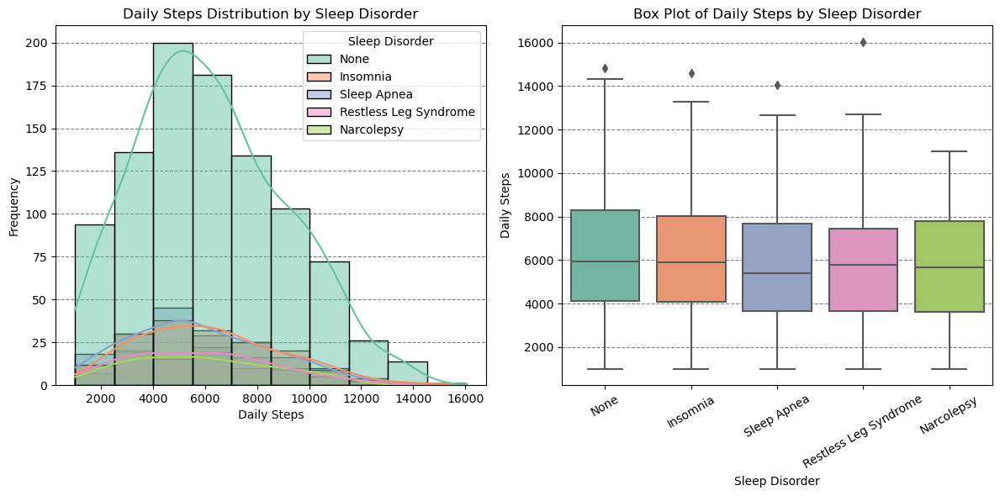

In [150]:
custom_palette = ['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854']
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Histogram
sns.histplot(data=df, x='Daily Steps', hue='Sleep Disorder',
             bins=10, palette=custom_palette,
             ax=axes[0], kde=True)
axes[0].set_title('Daily Steps Distribution by Sleep Disorder')
axes[0].set_xlabel('Daily Steps')
axes[0].set_ylabel('Frequency')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--')

# Boxplot
sns.boxplot(x='Sleep Disorder', y='Daily Steps', data=df,
            palette=custom_palette, ax=axes[1])
axes[1].set_title('Box Plot of Daily Steps by Sleep Disorder')
axes[1].set_xlabel('Sleep Disorder')
axes[1].set_ylabel('Daily Steps')
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', color='gray', linestyle='--')

# Rotate x-axis labels on boxplot to prevent overlap
axes[1].tick_params(axis='x', rotation=30)

plt.tight_layout()
plt.show()


## 😴 Daily Steps by Sleep Disorder Analysis

### 1. Distribution of Daily Steps by Sleep Disorder (Histogram + KDE)
- Individuals **without sleep disorders** have a **wider and higher peak distribution**, centered around **5,000 to 8,000 steps**, indicating higher activity levels.
- Those with **sleep disorders** such as **Insomnia**, **Sleep Apnea**, **Restless Leg Syndrome**, and **Narcolepsy** show **lower and flatter distributions**, suggesting reduced physical activity.
- The **KDE lines** for all sleep disorders are shifted slightly leftward, indicating lower average daily steps compared to those with no disorder.

### 2. Box Plot of Daily Steps by Sleep Disorder
- The **median** daily steps are **highest in individuals without any sleep disorder**, followed closely by those with **Insomnia** and **Narcolepsy**.
- Individuals with **Sleep Apnea** and **Restless Leg Syndrome** tend to have **lower median daily steps**.
- The **interquartile range (IQR)** is widest for those with **no disorder**, reflecting more variation in physical activity.
- **Outliers** exist across all categories, but individuals **without disorders** have higher and more frequent upper-end outliers (>14,000 steps).
- All groups have similar lower bounds (~1,000–2,000 steps), suggesting low activity is common across categories.

### ✅ Summary
- People **without sleep disorders** tend to be more physically active.
- Among the sleep disorders, **Narcolepsy** shows slightly better step counts than **Restless Leg Syndrome** or **Sleep Apnea**.
- The data suggests a **possible negative impact of sleep disorders on daily physical activity** levels.

### 📌 Conclusion
Sleep disorders are generally associated with **reduced physical activity**. Promoting better sleep hygiene may help in increasing physical activity levels and improving overall health outcomes.


## How does the distribution of daily steps vary across different BMI categories?

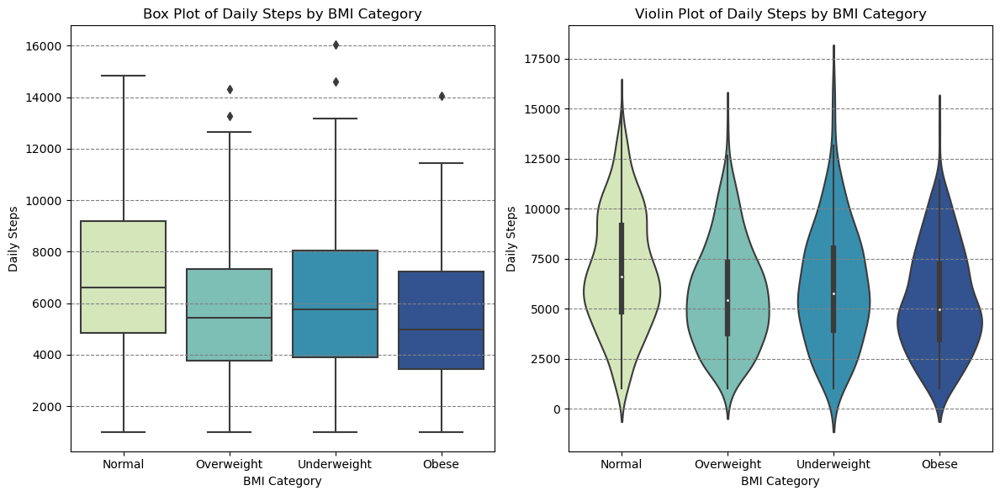

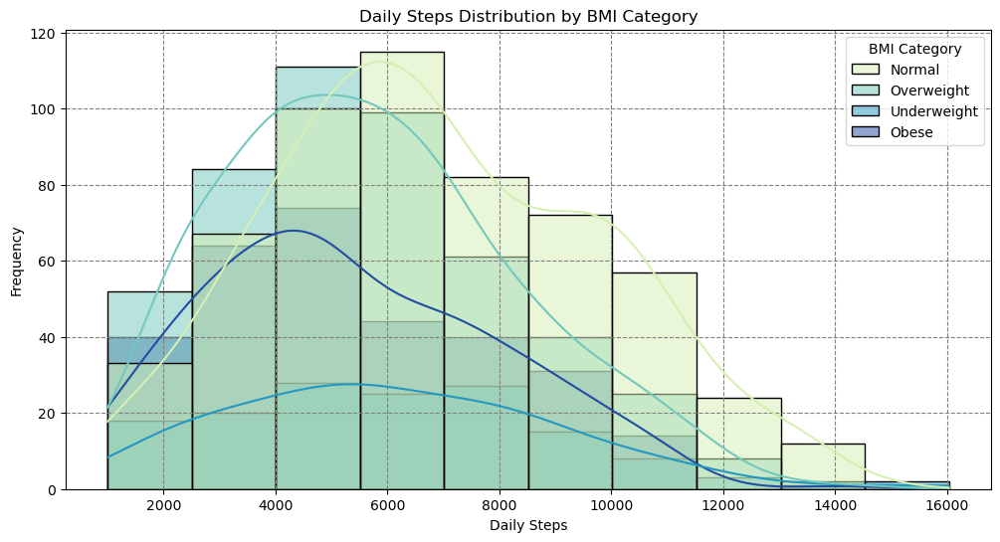

In [151]:
custom_palette = sns.color_palette("YlGnBu", len(df['BMI Category'].unique()))
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

sns.boxplot(x='BMI Category', y='Daily Steps', data=df,
            palette=custom_palette, ax=axes[0])
axes[0].set_title('Box Plot of Daily Steps by BMI Category')
axes[0].set_xlabel('BMI Category')
axes[0].set_ylabel('Daily Steps')
axes[0].grid(axis='y', color='gray', linestyle='--')

sns.violinplot(x='BMI Category', y='Daily Steps', data=df,
            palette=custom_palette, ax=axes[1])
axes[1].set_title('Violin Plot of Daily Steps by BMI Category')
axes[1].set_xlabel('BMI Category')
axes[1].set_ylabel('Daily Steps')
axes[1].grid(axis='y', color='gray', linestyle='--')

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='Daily Steps', hue='BMI Category',
             bins=10, kde=True, palette=custom_palette)
plt.title('Daily Steps Distribution by BMI Category')
plt.xlabel('Daily Steps')
plt.ylabel('Frequency')
plt.grid(color='gray', linestyle='--')
plt.show()

s## 📊 Analysis of Daily Steps by BMI Category

### **Box Plot Analysis:**

- **Normal BMI Category:**
  - Exhibits the **highest median** daily step count.
  - Wide interquartile range indicates **greater variability** in physical activity.
  - Several **high outliers**, suggesting some individuals are very active.

- **Overweight Category:**
  - **Median** is lower than the Normal group.
  - **Moderate spread** of daily steps.
  - A few **high-end outliers** present.

- **Underweight Category:**
  - Median steps are **slightly below Normal**, but higher than Obese.
  - **Wide spread** in step counts.
  - **High variability**, with some individuals taking very large numbers of steps.

- **Obese Category:**
  - **Lowest median** daily step count among all categories.
  - **Narrow range**, indicating most individuals are clustered around lower step counts.
  - Fewer outliers and less variation.

---

### **Violin Plot Analysis:**

- **Normal BMI:**
  - **Tall and wide** violin plot.
  - Indicates a **large spread** of steps and many individuals in the 5,000–10,000 range.
  - Suggests **high average activity**.

- **Overweight:**
  - **Narrower** than Normal category.
  - Density centered around **4,000–7,000** steps.

- **Underweight:**
  - **Wider and more varied** distribution.
  - Multiple peaks indicate **diverse activity patterns**.

- **Obese:**
  - **Shortest and narrowest** violin.
  - Suggests **lower and more consistent** daily step counts.
  - Indicates **limited physical activity**.

---

### **Summary:**

- Individuals in the **"Normal"** BMI category tend to have the **highest daily step counts**.
- Individuals in the **"Obese"** category tend to have the **lowest daily step counts**.
- The **"Overweight"** category has **intermediate** levels of daily step counts.
- The **"Underweight"** category shows a **wide range** of daily step counts, with some individuals taking significantly **higher numbers of steps**.
 taking significantly **higher numbers of steps**.




## Are there differences in daily step counts between males and females within each BMI category?

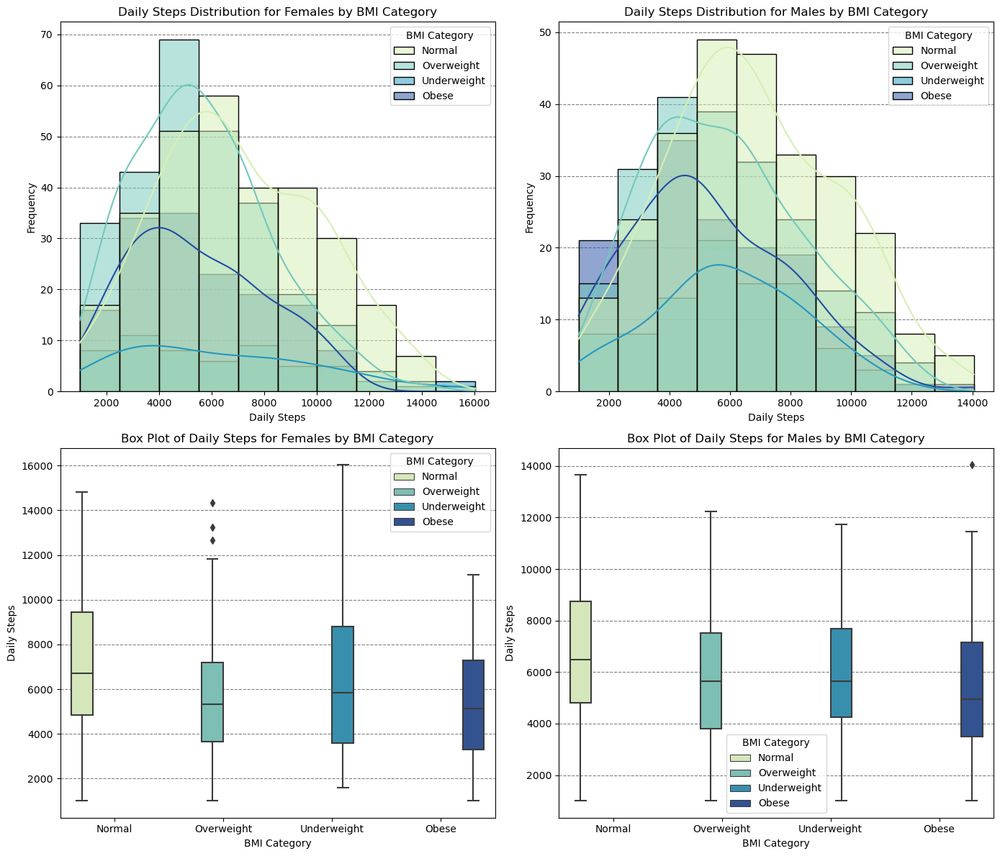

In [152]:
# Filter data to include females and male
df_female = df[df['Gender'] == 'Female']
df_male = df[df['Gender'] == 'Male']

custom_palette = sns.color_palette("YlGnBu", len(df['BMI Category'].unique()))

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

sns.histplot(data=df_female, x='Daily Steps', hue='BMI Category',
             bins=10, kde=True, palette=custom_palette, ax=axes[0,0])
axes[0,0].set_title('Daily Steps Distribution for Females by BMI Category')
axes[0,0].set_xlabel('Daily Steps')
axes[0,0].set_ylabel('Frequency')
axes[0,0].set_axisbelow(True)
axes[0,0].grid(axis='y', color='gray', linestyle='--')

sns.histplot(data=df_male, x='Daily Steps', hue='BMI Category',
             bins=10, kde=True, palette=custom_palette, ax=axes[0,1])
axes[0,1].set_title('Daily Steps Distribution for Males by BMI Category')
axes[0,1].set_xlabel('Daily Steps')
axes[0,1].set_ylabel('Frequency')
axes[0,1].set_axisbelow(True)
axes[0,1].grid(axis='y', color='gray', linestyle='--')

sns.boxplot(x='BMI Category', y='Daily Steps', hue='BMI Category', data=df_female,
            palette=custom_palette, ax=axes[1,0])
axes[1,0].set_title('Box Plot of Daily Steps for Females by BMI Category')
axes[1,0].set_xlabel('BMI Category')
axes[1,0].set_ylabel('Daily Steps')
axes[1,0].set_axisbelow(True)
axes[1,0].grid(axis='y', color='gray', linestyle='--')

sns.boxplot(x='BMI Category', y='Daily Steps', hue='BMI Category', data=df_male,
            palette=custom_palette, ax=axes[1,1])
axes[1,1].set_title('Box Plot of Daily Steps for Males by BMI Category')
axes[1,1].set_xlabel('BMI Category')
axes[1,1].set_ylabel('Daily Steps')
axes[1,1].set_axisbelow(True)
axes[1,1].grid(axis='y', color='gray', linestyle='--')

plt.tight_layout()
plt.show()

## 📊 Gender-Based Analysis of Daily Steps by BMI Category

### **1. Distribution Plots (Top Row):**

#### 🔹 *Daily Steps Distribution for Females by BMI Category:*
- **Normal BMI females** show the **highest frequency** of steps between 5,000–8,000, with a right-skewed distribution.
- **Overweight and Underweight females** have similar spread but lower frequency compared to the Normal group.
- **Obese females** have the **lowest peak**, with a noticeable concentration around **3,000–5,000 steps**, indicating limited physical activity.

#### 🔹 *Daily Steps Distribution for Males by BMI Category:*
- **Normal BMI males** also show a high step frequency in the **6,000–9,000** range.
- **Underweight and Overweight males** have more evenly distributed steps, but still lower than the Normal group.
- **Obese males** are concentrated at lower step counts, around **3,000–5,000**, with a steep drop-off at higher step counts.

---

### **2. Box Plots (Bottom Row):**

#### 🔹 *Box Plot of Daily Steps for Females:*
- **Normal BMI females** have the **highest median** step count and widest interquartile range (IQR), with several high outliers.
- **Underweight females** show a wide spread in data, indicating **diverse physical activity** levels.
- **Overweight and Obese females** have lower medians and tighter IQRs, suggesting **lower and more consistent step counts**.

#### 🔹 *Box Plot of Daily Steps for Males:*
- **Normal BMI males** again have the **highest median** and broad IQR.
- **Underweight males** have a wide range but with a slightly lower median than Normal males.
- **Overweight and Obese males** show compressed distributions with **lower medians**, especially in the Obese group.

---

### **Overall Insights:**

- Both **males and females** in the **Normal BMI category** are the **most physically active**, with the **highest median daily steps** and broader activity ranges.
- **Obese individuals** of both genders consistently show **lower activity levels**, with step counts clustering between **3,000–5,000**.
- **Underweight individuals**, especially females, display **high variability**, possibly due to diverse lifestyle habits.
- **Overweight individuals** fall in between, with moderately reduced step counts compared to the Normal group.

---

### **Conclusion:**
BMI category is a strong indicator of physical activity levels across genders. Those with **Normal BMI** are consistently more active, while **Obese individuals** demonstrate the lowest levels of daily physical movement. **Gender differences** are minor, but females tend to show **greater variability** in step counts, especially in the Underweight category.


# Sleep-Related Factors

## What is the average sleep duration across all individuals in the sample?

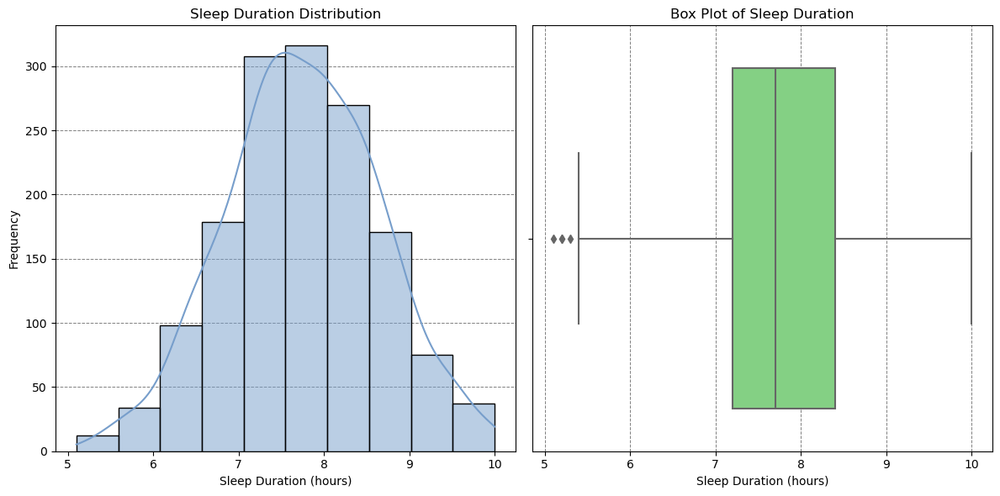

In [153]:
# Custom color palette with pleasant medium tones
custom_palette = ['#FFB347', '#779ECB', '#77DD77']  # Orange pastel, calm blue, soft green

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Histogram of sleep duration
sns.histplot(df['Sleep Duration'], bins=10, kde=True,
             color=custom_palette[1], ax=axes[0])
axes[0].set_title('Sleep Duration Distribution')
axes[0].set_xlabel('Sleep Duration (hours)')
axes[0].set_ylabel('Frequency')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

# Boxplot of sleep duration
sns.boxplot(x=df['Sleep Duration'], color=custom_palette[2], ax=axes[1])
axes[1].set_title('Box Plot of Sleep Duration')
axes[1].set_xlabel('Sleep Duration (hours)')
axes[1].set_axisbelow(True)
axes[1].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()


## 😴 Sleep Duration Analysis

### **1. Sleep Duration Distribution (Left Plot)**

- The histogram shows a **bell-shaped distribution**, indicating that sleep duration is **normally distributed**.
- The **peak frequency** occurs between **7 and 8 hours**, suggesting most individuals sleep within this range.
- The distribution is **slightly skewed to the left**, meaning a small number of individuals sleep less than the average.
- Very few individuals sleep either **less than 6 hours** or **more than 9.5 hours**.

---

### **2. Box Plot of Sleep Duration (Right Plot)**

- The **median sleep duration** is around **7.8 hours**, which is near the center of the interquartile range (IQR).
- The **IQR spans roughly from 7 to 8.8 hours**, indicating that 50% of the data falls within this range.
- There are a few **left-side outliers** (below ~5.8 hours), representing individuals who sleep significantly less than the norm.
- No visible right-side outliers, suggesting **oversleeping is less common** in this dataset.

---

### **Summary Insights:**

- Most individuals in the dataset get **7–9 hours of sleep**, which aligns with **recommended sleep guidelines** for adults.
- A small group gets **under 6 hours**, potentially indicating **sleep deprivation**.
- The distribution and box plot together suggest that sleep behavior is **fairly consistent** among the population sampled.



In [154]:
# Calculate the average sleep duration
average_sleep_duration = df['Sleep Duration'].mean()
print(f"\nThe average sleep duration is: \n{average_sleep_duration:.2f} hours\n")



The average sleep duration is: 
7.75 hours



## 💤 Sleep Duration Data Analysis

- The **average sleep duration is 7.75 hours**, which is within the **recommended 7–9 hours** for adults.
- This suggests that most individuals in the dataset are getting **adequate sleep**.
- It reflects **balanced sleep habits** overall, with no strong signs of sleep deprivation or oversleeping.
- From a health perspective, this average supports **good cognitive and physical function**.


## How does sleep duration relate to age for both males and females?

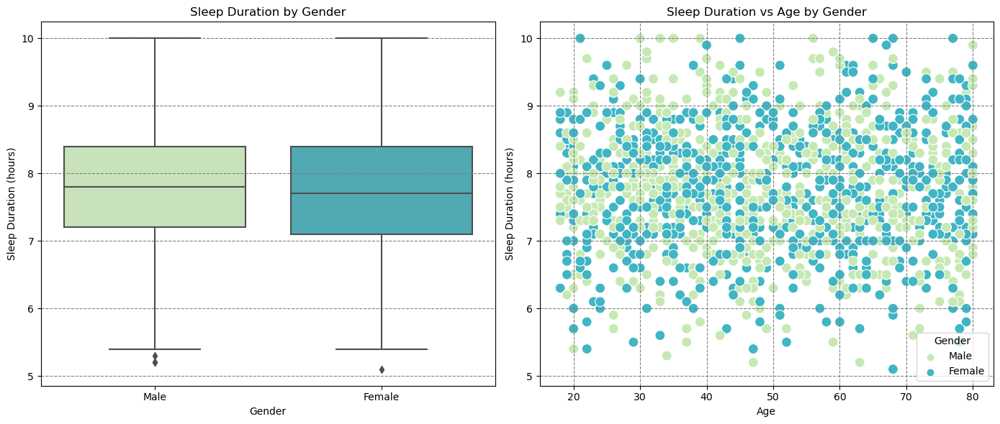

In [155]:
custom_palette = sns.color_palette("YlGnBu", 3)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(x='Gender', y='Sleep Duration', data=df,
            palette=custom_palette, ax=axes[0])
axes[0].set_title('Sleep Duration by Gender')
axes[0].set_xlabel('Gender')
axes[0].set_ylabel('Sleep Duration (hours)')
axes[0].grid(axis='y', color='gray', linestyle='--')

sns.scatterplot(x='Age', y='Sleep Duration', hue='Gender', data=df,
                palette=custom_palette, s=100, ax=axes[1])
axes[1].set_title('Sleep Duration vs Age by Gender')
axes[1].set_xlabel('Age')
axes[1].set_ylabel('Sleep Duration (hours)')
axes[1].grid(color='gray', linestyle='--')


plt.tight_layout()
plt.show()

## 💤 Sleep Duration Analysis by Gender and Age

### 📦 Box Plot: Sleep Duration by Gender
- The **median sleep duration** is similar for both **males and females**, approximately **7.75 hours**.
- **Females** exhibit slightly **more variability** in sleep duration compared to males.
- **Outliers** (especially on the lower end <6 hours) are present for both genders, with a few more among **males**.
- Overall, **sleep patterns are quite consistent between genders**, with a central range of 7–9 hours.

---

### 🎯 Scatter Plot: Sleep Duration vs Age by Gender
- There is **no strong correlation** between **age** and **sleep duration**.
- Most individuals, regardless of age, sleep between **6.5 and 9 hours**.
- Both **males and females** show a **broad range** of sleep duration across all age groups.
- This suggests **individual differences** outweigh gender or age factors in determining sleep habits.

---

### ✅ Overall Conclusion
- The **average sleep duration** across the dataset is **7.75 hours**, indicating generally **adequate sleep**.
- **Gender does not significantly affect** sleep duration.
- **Age also shows minimal influence**, with no clear trends observed.
- Overall, sleep patterns are consistent, but **individual lifestyle or health factors** likely contribute more to variation than gender or age.




## Do individuals with certain sleep disorders tend to have consistently shorter or longer sleep durations compared to those with no reported disorder, regardless of age?

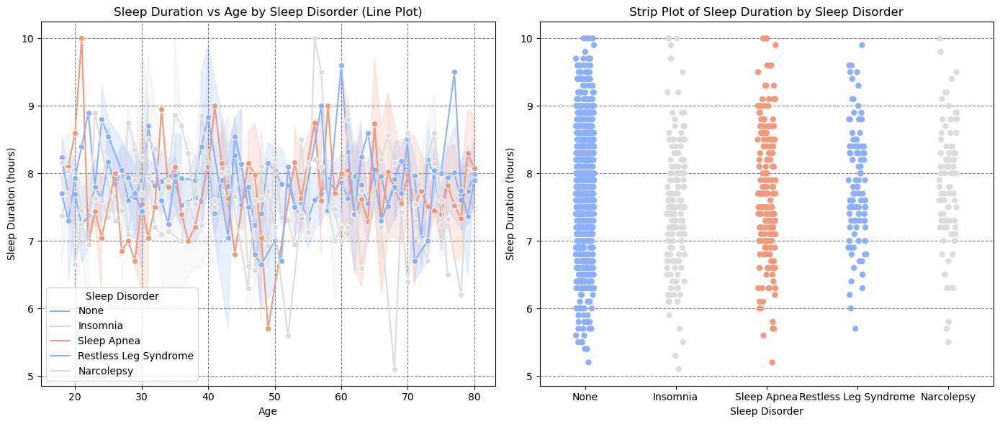

In [156]:
custom_palette = sns.color_palette("coolwarm", 3)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Line plot for Sleep Duration vs Age by Sleep Disorder
sns.lineplot(x='Age', y='Sleep Duration', hue='Sleep Disorder', data=df,
             palette=custom_palette, ax=axes[0], marker='o')
axes[0].set_title('Sleep Duration vs Age by Sleep Disorder (Line Plot)')
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Sleep Duration (hours)')
axes[0].grid(color='gray', linestyle='--')

# Strip plot for Sleep Duration by Sleep Disorder
sns.stripplot(x='Sleep Disorder', y='Sleep Duration', data=df,
              palette=custom_palette, ax=axes[1], jitter=True, size=6)
axes[1].set_title('Strip Plot of Sleep Duration by Sleep Disorder')
axes[1].set_xlabel('Sleep Disorder')
axes[1].set_ylabel('Sleep Duration (hours)')
axes[1].grid(axis='y', color='gray', linestyle='--')

plt.tight_layout()
plt.show()


### 🛌 Sleep Duration by Age and Sleep Disorder – Analysis

---

#### **1. Sleep Duration vs Age by Sleep Disorder (Line Plot)**

- **Trend Overview:**  
  The sleep duration generally hovers around 7 to 8 hours for most age groups, regardless of sleep disorder status.

- **By Sleep Disorder Group:**  
  - **None (No Disorder):** Shows a relatively stable sleep duration across ages, generally close to 7.5–8 hours.  
  - **Insomnia:** Displays more fluctuation in sleep duration with some dips below 7 hours, indicating less consistent sleep patterns.  
  - **Sleep Apnea:** Sleep duration is also somewhat variable but often near or slightly below 7.5 hours.  
  - **Restless Leg Syndrome & Narcolepsy:** These groups have fewer data points but tend to have more variability and occasional lower sleep durations.

- **Age Effect:**  
  No clear trend of sleep duration consistently increasing or decreasing with age within any group. Variability exists in all groups, suggesting that age alone does not explain differences in sleep duration here.

---

#### **2. Strip Plot of Sleep Duration by Sleep Disorder**

- **Distribution by Group:**  
  - Individuals **without sleep disorders** tend to cluster tightly around 7–8.5 hours, indicating more consistent and adequate sleep.  
  - Those with **Insomnia and Sleep Apnea** show a wider spread, with some individuals sleeping less than 6 hours and others closer to normal duration, reflecting disrupted or poor-quality sleep.  
  - **Restless Leg Syndrome** and **Narcolepsy** groups also display broad variability with some very short sleep durations, consistent with their sleep disturbances.

- **Overlap:**  
  There is overlap in sleep durations across all groups, but the **sleep disorder groups show more extreme low sleep durations**, highlighting the impact of these conditions on sleep quantity.

---

#### ✅ Summary

- Sleep disorders are associated with **greater variability and generally shorter sleep duration** compared to those without disorders.  
- The absence of strong age-related trends suggests that **sleep disorder effects on sleep duration may be more significant than aging** in this dataset.  
- These patterns underscore how sleep disorders can disrupt sleep duration, potentially impacting overall sleep health and related outcomes such as stress, physical health, and cognitive function.
ects sleep duration**.


## How is the distribution of sleep quality across the sample population?

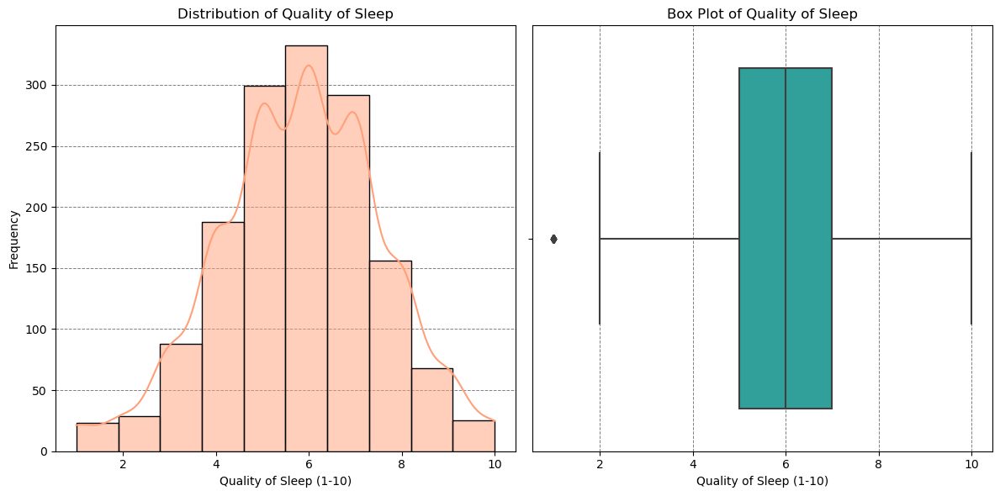

In [157]:
# New color palette: Warm + Cool
custom_palette = ['#FFA07A', '#20B2AA', '#9370DB']  # Light Salmon, Light Sea Green, Medium Purple

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Histogram for Quality of Sleep
sns.histplot(df['Quality of Sleep'], bins=10, kde=True,
             color=custom_palette[0], ax=axes[0])
axes[0].set_title('Distribution of Quality of Sleep')
axes[0].set_xlabel('Quality of Sleep (1-10)')
axes[0].set_ylabel('Frequency')
axes[0].set_axisbelow(True)
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

# Boxplot for Quality of Sleep
sns.boxplot(x=df['Quality of Sleep'], color=custom_palette[1], ax=axes[1])
axes[1].set_title('Box Plot of Quality of Sleep')
axes[1].set_xlabel('Quality of Sleep (1-10)')
axes[1].set_axisbelow(True)
axes[1].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)

plt.tight_layout()
plt.show()



## 💤 Quality of Sleep – Analysis

### 📈 Distribution of Quality of Sleep (Left Plot)
- The distribution is **roughly normal**, centered around **5 to 7** on a 1–10 scale.
- Most people report a **moderate to good** sleep quality.
- Few individuals rate their sleep as **very low (1–2)** or **very high (9–10)**, indicating these extremes are less common.
- The curve shows a **slight left skew**, suggesting a small portion of the population experiences poor sleep.

### 📦 Box Plot of Quality of Sleep (Right Plot)
- The **median** sleep quality is around **6**, aligning with the histogram’s peak.
- The **interquartile range (IQR)** spans from **5 to 8**, representing the middle 50% of the data.
- A few **outliers** on the lower end suggest some individuals suffer from **very poor sleep quality**.

---

### ✅ Conclusion
- Most individuals report **moderate sleep quality**, with fewer experiencing either extreme.
- The overall pattern indicates **generally acceptable sleep** in the population.
- **Low-end outliers** may point to potential sleep disorders or other health concerns.


In [158]:
# Calculate the average quality of sleep
average_quality_of_sleep = df['Quality of Sleep'].mean()
print(f"\nThe average quality of sleep is: \n{average_quality_of_sleep:.2f}\n")



The average quality of sleep is: 
5.83



## Are there significant differences in sleep quality between males and females at different ages?

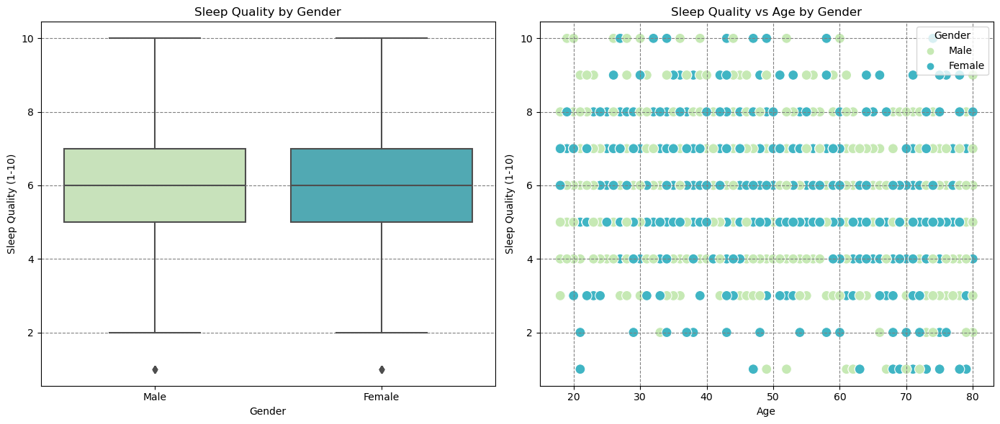

In [159]:
custom_palette = sns.color_palette("YlGnBu", 3)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(x='Gender', y='Quality of Sleep', data=df,
            palette=custom_palette, ax=axes[0])
axes[0].set_title('Sleep Quality by Gender')
axes[0].set_xlabel('Gender')
axes[0].set_ylabel('Sleep Quality (1-10)')
axes[0].grid(axis='y', color='gray', linestyle='--')

sns.scatterplot(x='Age', y='Quality of Sleep', hue='Gender', data=df,
                palette=custom_palette, s=100, ax=axes[1])
axes[1].set_title('Sleep Quality vs Age by Gender')
axes[1].set_xlabel('Age')
axes[1].set_ylabel('Sleep Quality (1-10)')
axes[1].grid(color='gray', linestyle='--')

plt.tight_layout()
plt.show()

### 🛏️ Sleep Quality by Gender – Analysis

#### 📦 Box Plot of Sleep Quality by Gender (Left Plot)
- Both **males and females** show a similar **median sleep quality** around **6**.
- The **interquartile range (IQR)**, which covers the middle 50% of values, is also similar for both genders (~5 to ~7.5).
- A few **outliers** are present for both genders on the lower end (very poor sleep).
- The spread of sleep quality is fairly **even across genders**, suggesting **no significant gender difference** in perceived sleep quality.

#### 🔵 Scatter Plot of Sleep Quality vs Age by Gender (Right Plot)
- Sleep quality ratings from both males and females appear to be **evenly distributed across all age groups**.
- There is **no clear trend** indicating that **age significantly impacts sleep quality** in either gender.
- Sleep quality scores are **scattered across the full range (1–10)** for all ages and both genders, with **some clustering around the mid-range** values (5–7).
- Both genders appear to follow **similar patterns across age groups**, without distinct divergences.

---

### ✅ Conclusion
- **Sleep quality is relatively consistent across genders**, with no major differences in median or variability.
- **Age does not seem to play a significant role** in altering perceived sleep quality for either gender.
- Overall, both gender and age appear to have **limited impact** on how individuals rate their sleep quality.



## Are there any specific age ranges where sleep quality decreases more sharply for individuals with specific sleep disorders compared to those without any disorders?

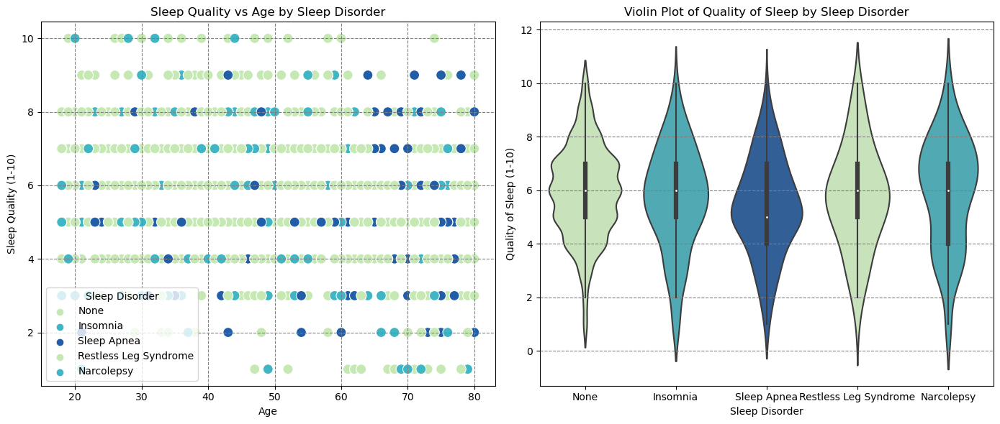

In [160]:
custom_palette = sns.color_palette("YlGnBu", 3)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(x='Age', y='Quality of Sleep', hue='Sleep Disorder', data=df,
                palette=custom_palette, s=100, ax=axes[0])
axes[0].set_title('Sleep Quality vs Age by Sleep Disorder')
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Sleep Quality (1-10)')
axes[0].grid(color='gray', linestyle='--')

sns.violinplot(x='Sleep Disorder', y='Quality of Sleep', data=df,
              palette=custom_palette, ax=axes[1])
axes[1].set_title('Violin Plot of Quality of Sleep by Sleep Disorder')
axes[1].set_xlabel('Sleep Disorder')
axes[1].set_ylabel('Quality of Sleep (1-10)')
axes[1].grid(axis='y', color='gray', linestyle='--')

plt.tight_layout()
plt.show()


### 💤 Sleep Quality vs Age and Sleep Disorders – Analysis

#### 📊 Left Plot: Sleep Quality vs Age by Sleep Disorder
- This scatter plot illustrates how sleep quality (scale 1–10) varies across different ages and sleep disorders.
- Individuals **without sleep disorders** ("None") are more concentrated around **higher sleep quality scores** (6–8).
- Individuals with **Insomnia, Sleep Apnea, Restless Leg Syndrome, and Narcolepsy** tend to report **lower sleep quality**, generally between 3–6.
- Sleep quality does not show a strong trend with **age**, regardless of disorder. That is, both younger and older individuals experience a wide range of sleep quality.
- Some clustering suggests that **certain disorders impact all ages similarly** in terms of reducing sleep quality.

#### 🎻 Right Plot: Violin Plot of Sleep Quality by Sleep Disorder
- Individuals **without any sleep disorder** have the **highest average sleep quality**, with a median around **6.5–7**.
- Those with **Sleep Apnea** or **Insomnia** generally report the **lowest sleep quality**, with medians near **5**.
- The spread (distribution) is wider for those with disorders like **Narcolepsy**, indicating more variation in their sleep quality ratings.
- The **density of values** in the violins suggests that disorders compress sleep quality toward the **lower to mid-range (4–6)**.
- Individuals with **Restless Leg Syndrome** also report reduced sleep quality compared to the healthy population.

---

### ✅ Overall Conclusion
- Sleep disorders have a **clear negative impact** on perceived sleep quality.
- Among them, **Insomnia and Sleep Apnea** seem to be most detrimental.
- Individuals **without sleep disorders** consistently report **higher and more stable sleep quality** across all ages.
- **Age itself is not a dominant factor**, as poor sleep quality is reported across the entire age spectrum when a disorder is present.



## How do quality of sleep ratings differ among individuals with different sleep disorders?

In [161]:
# Define a new custom hex color palette (teal, coral, violet)
custom_palette_hex = ['#66C2A5', '#FC8D62', '#8DA0CB', '#FFD92F', '#E78AC3']

fig = px.sunburst(
    df,
    path=['Sleep Disorder', 'Quality of Sleep'],
    title='Effect of Quality of Sleep on Sleep Disorder',
    color_discrete_sequence=custom_palette_hex
)

fig.show()


*## 🌞 Sunburst Chart Analysis: Distribution of Sleep Quality by Sleep Disorder

### 🔍 Chart Structure:
- The **center circle** represents different **sleep disorders**:  
  - `None` (no disorder)  
  - `Insomnia`  
  - `Sleep Apnea`  
  - `Restless Leg Syndrome`  
  - `Narcolepsy`  

- The **outer rings** show the **distribution of sleep quality scores** (scale 1–10) within each disorder group.

---

### 🧠 Key Observations:

#### 1. **No Sleep Disorder (`None`)**
- This group has the **largest population**.
- Sleep quality is most commonly rated as **5, 6, and 7**, indicating **good to moderate sleep**.
- Few extreme low or high scores suggest stable sleep patterns.

#### 2. **Insomnia**
- Broad spread from **2 to 8**, but mostly concentrated around **5 and 6**.
- Very few scores above 7, indicating **poor to moderate sleep quality**.
- Suggests **consistent reduction** in sleep quality due to insomnia.

#### 3. **Sleep Apnea**
- Scores mostly between **4 and 6**, rarely above 7.
- Reflects **moderate impact** on sleep quality.
- Less severe than insomnia but still notably affects rest.

#### 4. **Restless Leg Syndrome**
- Distribution ranges from **3 to 8**.
- Shows **high variability**, possibly due to fluctuating symptoms or severity.
- Overall trend leans toward **moderate sleep quality**.

#### 5. **Narcolepsy**
- Smallest segment (low representation).
- Scores cluster around **3 to 6**, implying **consistently poor sleep quality**.
- May reflect more disruptive nature of this condition.

---

### ✅ Conclusion:
- Individuals **without sleep disorders** report **higher and more consistent** sleep quality.
- **Insomnia and Sleep Apnea** are most clearly linked to **lower sleep quality**.
- **Restless Leg Syndrome** and **Narcolepsy** also show negative impacts, with **narcolepsy skewed toward lower quality**.
- The sunburst chart effectively visualizes how **sleep disorders impact perceived sleep quality**.


## Are there any specific stress levels where consistently lower or higher quality of sleep scores tend to be more prevalent?

In [162]:
custom_palette = sns.color_palette("YlGnBu", 6)

custom_palette_hex = custom_palette.as_hex()

fig = px.sunburst(df, path=['Stress Level', 'Quality of Sleep'],
                  title='Effect of Quality of Sleep on Stress Level',
                  color_discrete_sequence=custom_palette_hex)
fig.show()

## 🧘‍♂️ Sunburst Chart Analysis: Effect of Quality of Sleep on Stress Level

### 📊 Chart Description:
- **Inner Layer**: Represents **quality of sleep** (on a scale of 1–10).
- **Outer Layer**: Represents corresponding **stress levels** (also likely on a 1–10 scale).

---

### 🔍 Key Observations:

#### 1. **Low Sleep Quality (1–4)**
- Associated primarily with **higher stress levels (7–10)**.
- These segments are more densely packed with **higher stress values**, indicating a **strong correlation between poor sleep and high stress**.

#### 2. **Moderate Sleep Quality (5–7)**
- Shows a **wider spread** across stress levels.
- While some individuals with average sleep quality still report **high stress**, there are also noticeable occurrences of **moderate to low stress levels**.

#### 3. **High Sleep Quality (8–10)**
- Strongly associated with **lower stress levels (1–4)**.
- These segments dominate with lighter color tones in outer bands, suggesting a **calming effect of better sleep on stress**.

---

### 🧠 Insight:

- There is a **clear inverse relationship** between sleep quality and stress levels.
- As **sleep quality improves**, stress levels tend to **decrease**.
- Conversely, **poor sleep quality appears to be a major contributor to heightened stress**.

---

### ✅ Conclusion:

- This chart supports the notion that **quality sleep is a protective factor against stress**.
- Individuals aiming to reduce stress should **prioritize improving their sleep habits**, aiming for **sleep quality scores of 7 or higher**.



## How does the distribution of sleep duration vary across different occupations?

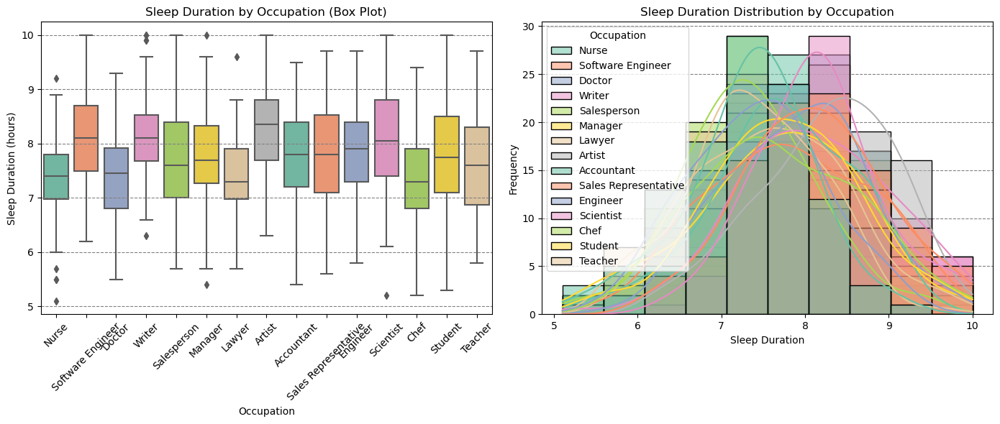

In [163]:
# Use Set2 palette for distinct and clear category colors
custom_palette = sns.color_palette("Set2", len(df['Occupation'].unique()))
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(x='Occupation', y='Sleep Duration', data=df,
            palette=custom_palette, ax=axes[0])
axes[0].set_title('Sleep Duration by Occupation (Box Plot)')
axes[0].set_xlabel('Occupation')
axes[0].set_ylabel('Sleep Duration (hours)')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(axis='y', color='gray', linestyle='--')

sns.histplot(data=df, x='Sleep Duration', hue='Occupation',
             bins=10, palette=custom_palette,
             ax=axes[1], kde=True)
axes[1].set_title('Sleep Duration Distribution by Occupation')
axes[1].set_xlabel('Sleep Duration')
axes[1].set_ylabel('Frequency')
axes[1].set_axisbelow(True)
axes[1].grid(axis='y', color='gray', linestyle='--')

plt.tight_layout()
plt.show()


## 🛌 Sleep Duration by Occupation: Analysis

### 📊 1. Box Plot - Sleep Duration by Occupation

#### Key Observations:
- **Highest Median Sleep Duration**:
  - **Teacher**, **Student**, and **Chef** tend to have the highest median sleep durations (close to or above 8 hours).
  
- **Lowest Median Sleep Duration**:
  - **Nurse**, **Doctor**, and **Software Engineer** show **lower median sleep durations**, often around or below 7.5 hours.
  
- **Variability**:
  - Occupations like **Engineer**, **Salesperson**, and **Manager** show **moderate variability**.
  - **Doctor** and **Nurse** show **larger spread and outliers**, possibly reflecting shift work or inconsistent schedules.
  
- **Outliers**:
  - Outliers (especially in medical professions) highlight cases with **very low sleep durations** (around 5 hours).

---

### 📈 2. Distribution Plot - Sleep Duration Distribution by Occupation

#### Key Observations:
- **Normal Distribution**:
  - Most professions exhibit a **normal or near-normal distribution** of sleep hours centered around 7–8 hours.
  
- **Software Engineers and Doctors**:
  - Have notable density peaks around 7–7.5 hours, indicating many in these fields get **slightly below the recommended amount of sleep**.
  
- **Artists, Teachers, and Students**:
  - Skew slightly toward **longer sleep durations** (8–9 hours), suggesting a more flexible or sleep-positive lifestyle.

- **Overlap**:
  - Many occupation distributions overlap, indicating that while trends exist, **individual variability remains significant**.

---

### 📌 Insights:

- **Work Demands Impact Sleep**: High-responsibility or shift-based jobs like nurses and doctors show **lower and more variable sleep durations**.
- **Structured or Creative Roles Favor Sleep**: Teachers, students, and artists tend to get **more consistent and longer sleep**.
- **Wide Individual Differences**: Despite profession-based patterns, the range within each occupation suggests that **personal habits and external factors** also play a major role.

---

### ✅ Conclusion:

Sleep duration varies significantly across occupations:
- **Medical and technical jobs** are linked with **shorter, more erratic sleep**.
- **Educational and creative fields** are more **aligned with healthy sleep patterns**.
- Tailored wellness initiatives may help professions at risk for **chronic sleep deprivation**.



In [164]:
# Calculate average sleep duration by occupation
average_sleep_duration = df.groupby('Occupation')['Sleep Duration'].mean()
sorted_sleep_duration = average_sleep_duration.sort_values(ascending=False)

# Print the sorted average sleep durations
print("Average Sleep Duration by Occupation:")
print(sorted_sleep_duration)

Average Sleep Duration by Occupation:
Occupation
Artist                  8.254
Writer                  8.154
Scientist               8.113
Software Engineer       8.100
Engineer                7.875
Sales Representative    7.812
Manager                 7.742
Accountant              7.731
Salesperson             7.693
Student                 7.690
Teacher                 7.598
Doctor                  7.426
Lawyer                  7.399
Nurse                   7.345
Chef                    7.344
Name: Sleep Duration, dtype: float64


*## 🛌 Average Sleep Duration by Occupation: Analysis

### 📋 Overview:

This data lists the **average sleep duration (in hours)** by profession, offering insights into how different occupational demands may influence sleep patterns.

---

### 🔝 Top 5 Occupations by Average Sleep Duration:

| Occupation         | Avg Sleep Duration |
|--------------------|-------------------:|
| **Artist**         | 8.254 hours        |
| **Writer**         | 8.154 hours        |
| **Scientist**      | 8.113 hours        |
| **Software Engineer** | 8.100 hours    |
| **Engineer**       | 7.875 hours        |

- These professions may have **flexible schedules** or **creative autonomy**, allowing for better sleep.
- Scientists and engineers, despite potential cognitive workloads, show good average sleep—suggesting possible work-life balance or structured routines.

---

### 🔻 Bottom 5 Occupations by Average Sleep Duration:

| Occupation     | Avg Sleep Duration |
|----------------|-------------------:|
| **Chef**       | 7.344 hours        |
| **Nurse**      | 7.345 hours        |
| **Lawyer**     | 7.399 hours        |
| **Doctor**     | 7.426 hours        |
| **Teacher**    | 7.598 hours        |

- **Healthcare professionals (Nurse, Doctor)** and **service-heavy roles (Chef, Teacher)** tend to sleep less.
- **Stressful workloads, irregular shifts**, and **early/long hours** likely contribute to reduced sleep.

---

### 🎯 Mid-range Occupations (Approx. 7.6–7.8 hrs):

| Occupation             | Avg Sleep Duration |
|------------------------|-------------------:|
| Manager                | 7.742 hours        |
| Accountant             | 7.731 hours        |
| Sales Representative   | 7.812 hours        |
| Salesperson            | 7.693 hours        |
| Student                | 7.690 hours        |

- These professions show **moderate sleep averages**, possibly affected by **schedule consistency or workload variability**.

---

### 📌 Key Insights:

- 🎨 **Creative roles** like **Artist** and **Writer** enjoy the most sleep—potentially due to **self-paced routines**.
- 🏥 **Medical and service professions** sleep less—highlighting the **impact of irregular hours and shift work**.
- 👨‍💼 **Corporate and sales roles** tend to be in the middle—perhaps balancing structure with stress.

---

### ✅ Conclusion:

Sleep duration correlates with **job flexibility, stress level, and schedule rigidity**:
- **Flexible roles = More sleep**.
- **High-responsibility, time-bound roles = Less sleep**.

This insight can inform **occupational wellness programs** and **sleep hygiene initiatives**, especially for high-risk groups like doctors, nurses, and chefs.



- The blood pressure categories according to the guidelines from the American Heart Association (AHA) and the American College of Cardiology (ACC).  [Sources and related content](https://www.acc.org/latest-in-cardiology/articles/2017/11/08/11/47/mon-5pm-bp-guideline-aha-2017)

<div style="text-align:center;">
  <img src="https://my.clevelandclinic.org/-/scassets/images/org/health/articles/4314-high-blood-pressure-illustration" alt="Hypertension" width="300" height="200">
</div>

[Source](https://my.clevelandclinic.org/health/diseases/4314-high-blood-pressure)


| Category                    | Systolic (mm Hg)   | Diastolic (mm Hg)   |
|:----------------------------|:-------------------|:--------------------|
| Optimal Blood Pressure      | Less than 120      | Less than 80        |
| Elevated Blood Pressure     | 120-129            | Less than 80        |
| Stage 1 Hypertension        | 130-139            | 80-89               |
| Stage 2 Hypertension        | 140 or higher      | 90 or higher        |
| Hypertensive Crisis         | Higher than 180    | Higher than 120     |



## What is the distribution of blood pressure categories within the sample population?

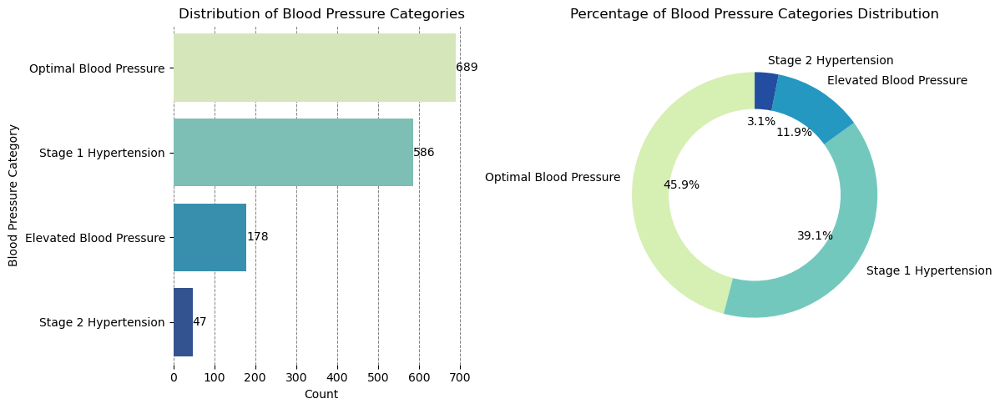

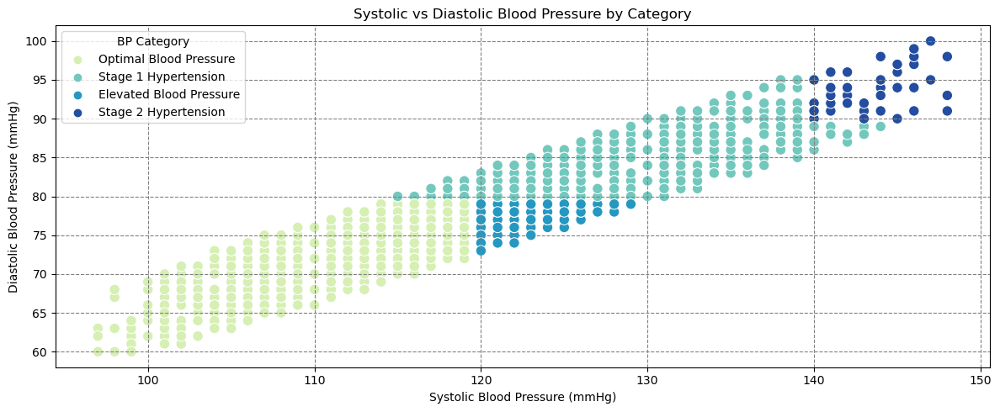

In [165]:
# Function to categorize blood pressure based on ACC/AHA guidelines
def categorize_blood_pressure(row):
    systolic = row['Systolic']
    diastolic = row['Diastolic']

    if systolic < 120 and diastolic < 80:
        return 'Optimal Blood Pressure'
    elif 120 <= systolic <= 129 and diastolic < 80:
        return 'Elevated Blood Pressure'
    elif 130 <= systolic <= 139 or 80 <= diastolic <= 89:
        return 'Stage 1 Hypertension'
    elif systolic >= 140 or diastolic >= 90:
          if systolic > 180 or diastolic > 120:
            return 'Hypertensive Crisis'
          else:
            return 'Stage 2 Hypertension'
    return 'Undefined'

df['BP Category'] = df.apply(categorize_blood_pressure, axis=1)

custom_palette = sns.color_palette("YlGnBu", 4)
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.countplot(y='BP Category', data=df, ax=axes[0], palette=custom_palette)
axes[0].set_title('Distribution of Blood Pressure Categories')
axes[0].set_xlabel('Count')
axes[0].set_ylabel('Blood Pressure Category')

for p in axes[0].patches:
    axes[0].annotate(f'{int(p.get_width())}', 
                     (p.get_width(), p.get_y() + p.get_height() / 2), 
                     ha='left', va='center', 
                     color='black', fontsize=10)

axes[0].set_axisbelow(True)
axes[0].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)  
sns.despine(left=True, bottom=True)

bp_counts = df['BP Category'].value_counts()
wedges, texts, autotexts = axes[1].pie(
    bp_counts, 
    labels=bp_counts.index, 
    autopct='%1.1f%%', 
    startangle=90,
    colors=custom_palette
)
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig.gca().add_artist(centre_circle)
axes[1].set_title('Percentage of Blood Pressure Categories Distribution')
axes[1].axis('equal')

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 5))
sns.scatterplot(x='Systolic', y='Diastolic', hue='BP Category',
                data=df, palette=custom_palette, s=80)
plt.title('Systolic vs Diastolic Blood Pressure by Category')
plt.xlabel('Systolic Blood Pressure (mmHg)')
plt.ylabel('Diastolic Blood Pressure (mmHg)')
plt.grid(color='gray', linestyle='--')
plt.legend(title='BP Category')
plt.tight_layout()
plt.show()

### 🩺 Blood Pressure Category Analysis & Sleep Health Implications

---

#### **1. Distribution of Blood Pressure Categories**

**📊 Bar Chart:**  
- **Optimal Blood Pressure** is the most frequent (689 individuals).  
- **Stage 1 Hypertension** follows (586 individuals).  
- **Elevated Blood Pressure** (178 individuals).  
- **Stage 2 Hypertension** is the least common (47 individuals).  

**🥧 Pie Chart:**  
- **Optimal:** ~45.9%  
- **Stage 1 Hypertension:** 39.1%  
- **Elevated:** 11.9%  
- **Stage 2 Hypertension:** 3.1%  

---

#### **2. Systolic vs. Diastolic Blood Pressure by Category (Scatter Plot)**

**Overall Trend:**  
- A clear positive correlation: higher systolic → higher diastolic.

**Category-Specific Observations:**  
- **Optimal:** Lower-left cluster with healthy values.  
- **Elevated:** Slightly higher readings than optimal.  
- **Stage 1 Hypertension:** Noticeably higher pressure range.  
- **Stage 2 Hypertension:** Highest values in the upper-right, signaling critical health risk.

---

#### ✅ Summary

- The majority fall in the **Optimal** and **Stage 1 Hypertension** categories.  
- **Stage 2 Hypertension** is rare but indicates significant health concerns.  
- The scatter plot reflects the logical progression of blood pressure elevation across categories.

---

### 😴 Impact of Blood Pressure on Sleep Health

- Elevated and high blood pressure (especially Stage 1 and Stage 2 Hypertension) are often linked to **poor sleep quality** and common sleep disorders like **sleep apnea** and **insomnia**.  
- Sleep disturbances can exacerbate hypertension, creating a cycle of worsening sleep and blood pressure.  
- Achieving and maintaining **optimal blood pressure** supports healthier sleep patterns, while managing sleep disorders can aid in controlling blood pressure.
rend** in both systolic and diastolic values.


## Are there significant differences in BP Category between males and females?

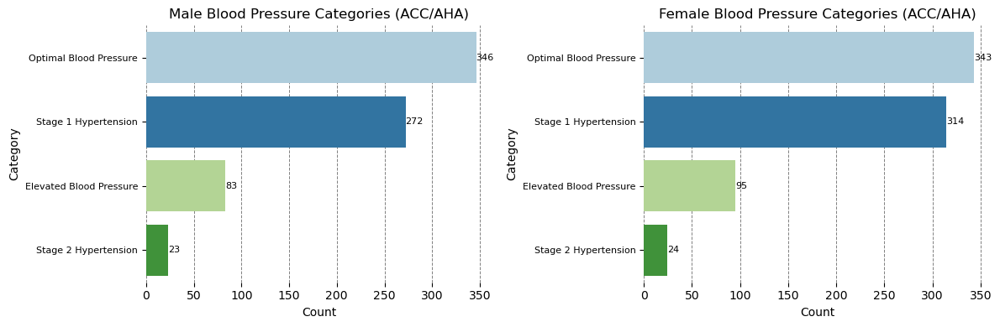

In [166]:
# Use the 'Paired' palette for clear and distinct colors
custom_palette = sns.color_palette("Paired", 5)
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Male BP Categories
sns.countplot(y='BP Category', data=df[df['Gender'] == 'Male'],
              ax=axes[0], palette=custom_palette)
axes[0].set_title('Male Blood Pressure Categories (ACC/AHA)')
axes[0].set_xlabel('Count')
axes[0].set_ylabel('Category')
axes[0].tick_params(axis='y', labelsize=8)

for p in axes[0].patches:
    axes[0].annotate(f'{int(p.get_width())}', 
                     (p.get_width(), p.get_y() + p.get_height() / 2), 
                     ha='left', va='center', 
                     color='black', fontsize=8)

axes[0].set_axisbelow(True)
axes[0].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)
sns.despine(left=True, bottom=True)

# Female BP Categories
sns.countplot(y='BP Category', data=df[df['Gender'] == 'Female'],
              ax=axes[1], palette=custom_palette)
axes[1].set_title('Female Blood Pressure Categories (ACC/AHA)')
axes[1].set_xlabel('Count')
axes[1].set_ylabel('Category')
axes[1].tick_params(axis='y', labelsize=8)

for p in axes[1].patches:
    axes[1].annotate(f'{int(p.get_width())}',
                     (p.get_width(), p.get_y() + p.get_height() / 2),
                     ha='left', va='center',
                     color='black', fontsize=8)

axes[1].set_axisbelow(True)
axes[1].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)  
sns.despine(left=True, bottom=True)

plt.tight_layout()
plt.show()



### 🩺 Blood Pressure Categories by Gender (ACC/AHA Guidelines)

These side-by-side horizontal bar charts present the distribution of blood pressure categories for male and female individuals.

#### Male Blood Pressure Distribution
- **Optimal Blood Pressure** is the most common, with 346 individuals.  
- **Stage 1 Hypertension** follows closely with 272 individuals.  
- **Elevated Blood Pressure** affects 83 individuals.  
- **Stage 2 Hypertension** is the least common, with 23 individuals.  

#### Female Blood Pressure Distribution
- **Optimal Blood Pressure** is also most frequent, with 343 individuals.  
- **Stage 1 Hypertension** is slightly more common in females than males, with 314 individuals.  
- **Elevated Blood Pressure** affects 95 females, slightly more than males.  
- **Stage 2 Hypertension** is similar to males, with 24 individuals.  

---

#### ✅ Key Insights
- Both males and females most commonly fall into the **Optimal Blood Pressure** and **Stage 1 Hypertension** categories.  
- **Stage 1 Hypertension** is slightly more prevalent in females than males.  
- **Elevated Blood Pressure** is slightly higher among females (95) than males (83).  
- **Stage 2 Hypertension** is the least frequent for both genders and nearly equal in number.  
- These distributions show similar blood pressure patterns across genders, with subtle differences that may warrant further clinical investigation.

---

### 😴 Impact on Sleep Health and Disorders

- High blood pressure, particularly **Stage 1 and Stage 2 Hypertension**, is linked with increased risk of **sleep disorders** such as **sleep apnea**, which disrupts normal sleep cycles and reduces sleep quality.  
- Poor sleep can further elevate blood pressure, creating a feedback loop that worsens both cardiovascular and sleep health.  
- Slight differences in blood pressure categories between genders may influence the prevalence or severity of sleep disturbances, highlighting the importance of personalized approaches to managing both blood pressure and sleep health.
 further clinical exploration.



In [167]:
mean_bp = df.groupby('Gender')[['Systolic', 'Diastolic']].mean()
print("Mean Systolic and Diastolic Blood Pressure by Gender:")
print(mean_bp)

Mean Systolic and Diastolic Blood Pressure by Gender:
          Systolic  Diastolic
Gender                       
Female  120.521907  78.253866
Male    119.935083  77.935083


### 4. **Mean Systolic and Diastolic Blood Pressure by Gender**

This section summarizes the **average (mean)** blood pressure readings for males and females:

| Gender | Mean Systolic (mmHg) | Mean Diastolic (mmHg) |
|--------|-----------------------|------------------------|
| Female | 120.52                | 78.25                  |
| Male   | 119.94                | 77.94                  |

---

### ✅ **Key Insights**

- **Females** have a **slightly higher** average systolic (120.52 mmHg) and diastolic (78.25 mmHg) blood pressure compared to **males** (119.94 mmHg systolic and 77.94 mmHg diastolic).
- The differences between genders are **small**, indicating that **blood pressure is relatively balanced** across genders in this sample.
- These averages fall within or close to the **Elevated** or **Stage 1 Hypertension** range, depending on the blood pressure classification guidelines used (e.g., ACC/AHA).

---

### 📌 Implication

Although the difference is not clinically significant on its own, tracking these subtle shifts across larger or longitudinal datasets may help detect early gender-based trends in hypertension risk.


## How does the distribution of blood pressure categories vary across different age ranges in relation to sleep duration?

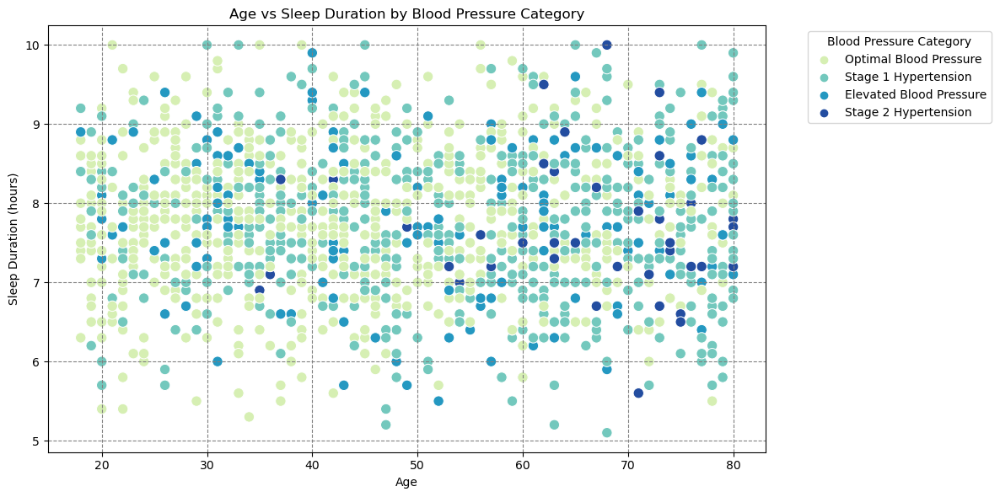

In [168]:
custom_palette = sns.color_palette("YlGnBu", 4)

plt.figure(figsize=(12, 6))
sns.scatterplot(x='Age', y='Sleep Duration', hue='BP Category',
                data=df, palette=custom_palette, s=80)
plt.title('Age vs Sleep Duration by Blood Pressure Category')
plt.xlabel('Age')
plt.ylabel('Sleep Duration (hours)')
plt.grid(color='gray', linestyle='--')
plt.legend(title='Blood Pressure Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### **Age vs Sleep Duration by Blood Pressure Category**

This scatter plot visualizes the relationship between **age**, **sleep duration**, and **blood pressure category** using color-coded points for each category.

---

### ✅ **Key Observations**

- **Overall Sleep Trend**:
  - Most individuals sleep between **6 to 9 hours**, regardless of age.
  - Sleep duration appears slightly **lower among older individuals**, especially those over 60.

- **Blood Pressure Categories**:
  - Individuals with **Optimal Blood Pressure** (light green) are more widely distributed across all sleep durations but tend to be younger.
  - **Stage 1 Hypertension** (teal) and **Elevated Blood Pressure** (blue-green) points are more concentrated in older age groups, particularly above 40.
  - **Stage 2 Hypertension** (dark blue) is more frequent among individuals **aged 60 and above**, and often associated with **shorter sleep durations (6–7 hours)**.

---

### 📌 Implications

- **Age and Blood Pressure**:
  - Higher blood pressure categories are more common among older adults, consistent with general health trends.
  
- **Sleep Duration and Blood Pressure**:
  - There may be a **potential link between reduced sleep duration and higher blood pressure**.
  - Individuals with **Stage 2 Hypertension** often sleep less, which aligns with research suggesting poor sleep is a risk factor for hypertension.

---

### 📈 Summary

- Younger individuals generally have more optimal blood pressure and more varied sleep patterns.
- Older adults with shorter sleep durations show a higher prevalence of **Stage 1 or 2 Hypertension**.
- Sleep duration may be an important modifiable factor in managing age-related blood pressure elevation.


## Are there significant differences in BP Category between individuals with different sleep disorders?

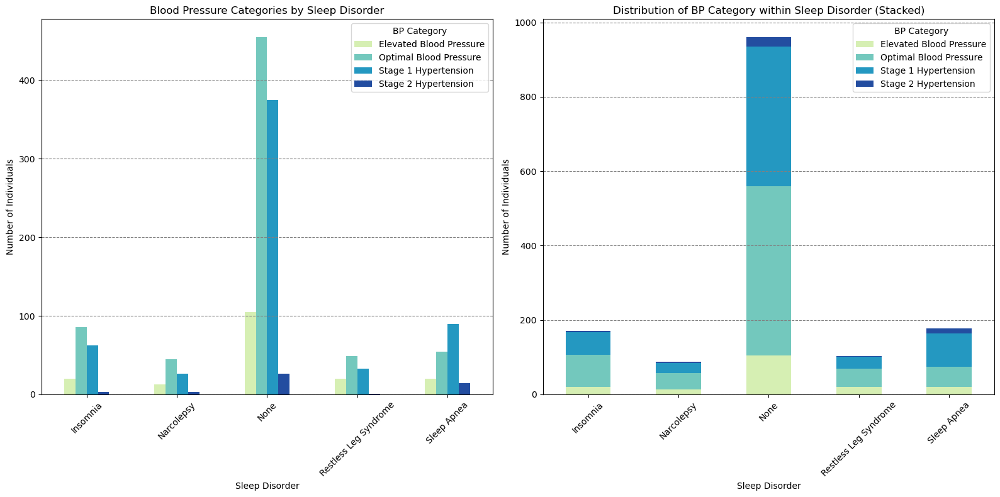

In [169]:
cross_tab = pd.crosstab(df['Sleep Disorder'], df['BP Category'])
custom_palette = sns.color_palette("YlGnBu", len(cross_tab.columns))

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

cross_tab.plot(kind='bar', color=custom_palette, ax=axes[0])
axes[0].set_title('Blood Pressure Categories by Sleep Disorder')
axes[0].set_xlabel('Sleep Disorder')
axes[0].set_ylabel('Number of Individuals')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(axis='y', color='gray', linestyle='--')
axes[0].legend(title='BP Category')

cross_tab.plot(kind='bar', stacked=True, color=custom_palette, ax=axes[1])
axes[1].set_title('Distribution of BP Category within Sleep Disorder (Stacked)')
axes[1].set_xlabel('Sleep Disorder')
axes[1].set_ylabel('Number of Individuals')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(axis='y', color='gray', linestyle='--')
axes[1].legend(title='BP Category')

plt.tight_layout()
plt.show()

###  **Blood Pressure Categories by Sleep Disorder**

The two bar charts illustrate how **blood pressure (BP) categories** are distributed across different **sleep disorders**. The left chart shows **grouped bar counts**, while the right chart uses **stacked bars** to show composition within each disorder type.

---

### ✅ **Key Observations**

#### 🔹 Left Chart: *Blood Pressure Categories by Sleep Disorder (Grouped)*

- **"None" (No Sleep Disorder)**:
  - Largest group overall.
  - Most individuals fall into the **Optimal BP** and **Stage 1 Hypertension** categories.
  - Moderate representation of **Elevated BP** and **Stage 2 Hypertension**.

- **Insomnia**:
  - Predominantly **Optimal BP** and **Stage 1 Hypertension**.
  - Small but visible **Elevated BP** group.

- **Sleep Apnea**:
  - Shows a **notable increase in Stage 1 Hypertension** and **Stage 2 Hypertension**.
  - Indicates a stronger link between sleep apnea and elevated BP levels.

- **Narcolepsy** and **Restless Leg Syndrome**:
  - Fewer individuals overall.
  - Primarily **Optimal BP** and **Stage 1 Hypertension**.
  - Very few in **Stage 2 Hypertension**.

---

#### 🔹 Right Chart: *Distribution of BP Category within Each Sleep Disorder (Stacked)*

- **No Sleep Disorder**:
  - Dominated by **Optimal BP** and **Stage 1 Hypertension**.
  - The largest sample size by far.

- **Sleep Apnea**:
  - Stacked distribution shows a **higher proportion of Stage 1 and Stage 2 Hypertension** than other disorders.
  - Reinforces that sleep apnea is associated with more severe hypertension stages.

- **Other Disorders (Insomnia, Narcolepsy, RLS)**:
  - Tend to show more balanced or lower-risk BP categories.
  - Narcolepsy and Restless Leg Syndrome show limited presence of Stage 2 Hypertension.

---

### 📌 Implications

- **Sleep Apnea is a major risk factor for hypertension**, particularly **Stage 1 and Stage 2**.
- Individuals without diagnosed sleep disorders still represent a wide range of blood pressure levels, suggesting other influencing factors (e.g., lifestyle, age).
- **Insomnia** also shows some risk association with elevated and hypertensive stages, although less so than sleep apnea.

---

### 📈 Summary

- The majority of individuals without sleep disorders have **Optimal or Stage 1 Hypertension**.
- **Sleep Apnea stands out** as strongly associated with **higher blood pressure categories**.
- Disorders like **Insomnia** and **RLS** show moderate distributions but much smaller populations.


Source: [National Institutes of Health](https://pmc.ncbi.nlm.nih.gov/articles/PMC4434546/) 

| Category | Recommended Sleep Duration | Associated Health Outcomes |
|----------|----------------------------|-----------------------------|
| **Optimal Health** | 7 or more hours per night | Promotes optimal health |
| **Adverse Health** | Less than 7 hours per night | Associated with adverse health outcomes |


## What is the overall distribution of sleep duration categories in the dataset?

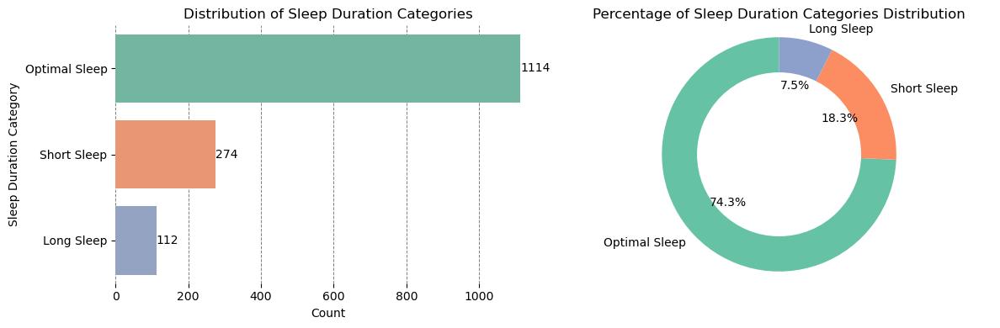

In [170]:
# Function to categorize sleep duration
def categorize_sleep_duration(hours):
    if 7 <= hours <= 9:
        return 'Optimal Sleep'
    elif hours < 7:
        return 'Short Sleep'
    else:
        return 'Long Sleep'

# Apply the categorization to the DataFrame
df['Sleep Category'] = df['Sleep Duration'].apply(categorize_sleep_duration)

# Use "Set2" color palette
custom_palette = sns.color_palette("Set2", 3)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Bar plot
sns.countplot(y='Sleep Category', data=df, ax=axes[0], palette=custom_palette)
axes[0].set_title('Distribution of Sleep Duration Categories')
axes[0].set_xlabel('Count')
axes[0].set_ylabel('Sleep Duration Category')

for p in axes[0].patches:
    axes[0].annotate(f'{int(p.get_width())}', 
                     (p.get_width(), p.get_y() + p.get_height() / 2), 
                     ha='left', va='center', 
                     color='black', fontsize=10)

axes[0].set_axisbelow(True)
axes[0].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)  
sns.despine(left=True, bottom=True)

# Pie chart
sleep_counts = df['Sleep Category'].value_counts()
wedges, texts, autotexts = axes[1].pie(
    sleep_counts, 
    labels=sleep_counts.index, 
    autopct='%1.1f%%', 
    startangle=90,
    colors=custom_palette
)
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig.gca().add_artist(centre_circle)
axes[1].set_title('Percentage of Sleep Duration Categories Distribution')
axes[1].axis('equal')

plt.tight_layout()
plt.show()


### **Distribution of Sleep Duration Categories**

The visuals consist of two graphs:
- A **horizontal bar chart** showing the **count** of individuals in each sleep duration category.
- A **donut chart** showing the **percentage distribution** of those categories.

---

### ✅ **Key Observations**

#### 🔹 Left Chart: *Count of Individuals by Sleep Duration*

- **Optimal Sleep (7–9 hours)**:
  - Dominates the distribution with **1114 individuals**.
  - Reflects the recommended sleep range for adults.
  
- **Short Sleep (<7 hours)**:
  - Includes **274 individuals**.
  - Suggests a notable portion of the population is getting insufficient sleep.
  
- **Long Sleep (>9 hours)**:
  - Only **112 individuals**, making it the least common category.

---

#### 🔹 Right Chart: *Percentage Distribution (Donut Chart)*

- **Optimal Sleep**: **74.3%**  
  - The majority of the population gets adequate sleep.
  
- **Short Sleep**: **18.3%**
  - Nearly 1 in 5 people are experiencing sleep deprivation.
  
- **Long Sleep**: **7.5%**
  - Long sleepers are a small minority.

---

### 📌 Implications

- The high proportion of individuals in the **optimal range** is encouraging and may contribute positively to overall health metrics such as **blood pressure**.
- However, **18.3% of individuals getting short sleep** is a public health concern. Chronic sleep deprivation has been linked to:
  - Increased risk of **hypertension**
  - **Cardiovascular disease**
  - **Cognitive impairment**
  - **Obesity and diabetes**

- While **long sleep** is rare, it can also be linked with certain health risks, especially if it reflects underlying conditions like sleep disorders or chronic fatigue.

---

### 📈 Summary

| Sleep Category   | Count | Percentage |
|------------------|-------|------------|
| Optimal Sleep     | 1114  | 74.3%      |
| Short Sleep       | 274   | 18.3%      |
| Long Sleep        | 112   | 7.5%       |

- The majority of individuals sleep within healthy limits, but **one in four** fall outside that range (either short or long sleep), which warrants attention.


## Are there any specific age ranges that tend to have more individuals with 'Short Sleep' or 'Long Sleep'?

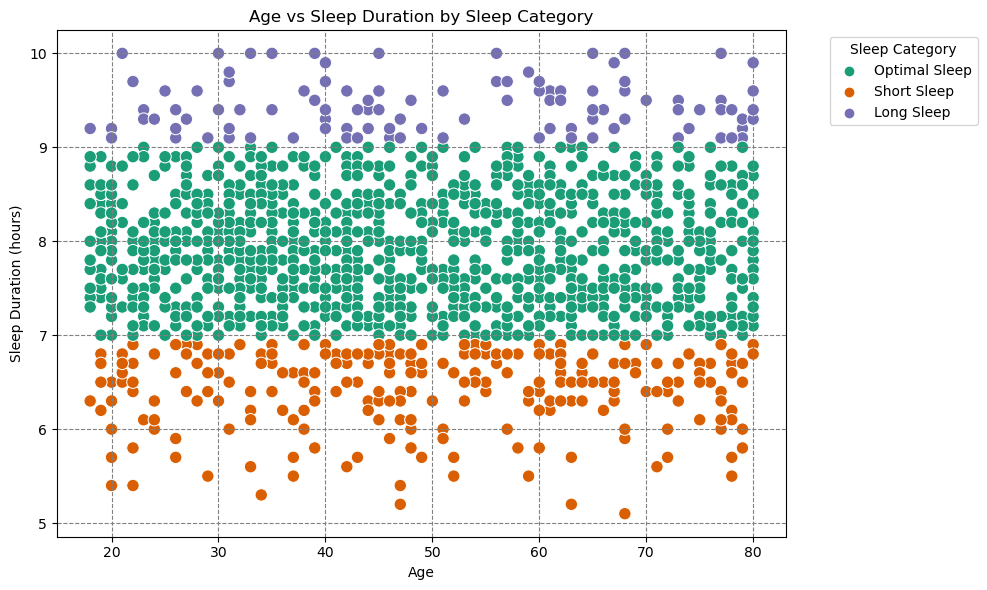

In [171]:
custom_palette = sns.color_palette("Dark2", 3)

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age', y='Sleep Duration', hue='Sleep Category',
                data=df, palette=custom_palette, s=80)
plt.title('Age vs Sleep Duration by Sleep Category')
plt.xlabel('Age')
plt.ylabel('Sleep Duration (hours)')
plt.grid(color='gray', linestyle='--')
plt.legend(title='Sleep Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


# 📊 Analysis: Age vs Sleep Duration by Sleep Category

### 🧠 Graph Overview

- **X-axis:** Age of individuals (approximately 18 to 80)
- **Y-axis:** Sleep Duration in hours (5 to 10 hours)
- **Color Coding (Sleep Categories):**
  - 🟢 **Optimal Sleep (7–9 hrs)**
  - 🔵 **Long Sleep (>9 hrs)**
  - 🔷 **Short Sleep (<7 hrs)**

---

### 🔍 Key Insights

#### 1. **Optimal Sleep Is Most Common Across All Ages**
- The majority of data points fall within the **7 to 9-hour range**, indicating most individuals achieve **optimal sleep duration**.
- This trend is **consistent across all age groups**, from young adults to seniors.

#### 2. **Short Sleep Is Prevalent Among Older Adults**
- A higher concentration of **short sleep (<7 hrs)** is noticeable **after age 60**.
- This may reflect age-related sleep changes or conditions such as **insomnia** or **fragmented sleep**.

#### 3. **Long Sleep Is Less Common But Evenly Spread**
- **Long sleep** (>9 hrs) is relatively **uncommon**.
- However, it is **evenly distributed across all age groups**, without strong age-specific trends.

---

### 📊 Age-Based Observations

| Age Group | Short Sleep | Optimal Sleep | Long Sleep |
|-----------|-------------|----------------|-------------|
| 18–30     | Present, but less frequent | Dominant | Present but rare |
| 31–50     | Increasing presence | Still dominant | Consistent but low |
| 51–80     | Noticeably more short sleepers | Slight decline | Still consistent |

---

### 📌 Implications

- **Short sleep** in older adults may be linked to:
  - Age-related physiological changes
  - Sleep disorders
  - Increased health risks (e.g. hypertension, cardiovascular conditions)
- **Optimal sleep** being dominant suggests **generally good sleep hygiene** in the population.
- **Long sleep** may be associated with specific circumstances (e.g. illness, recovery), but not concentrated in any age range.

---

### ✅ Summary

- **Optimal sleep** dominates across age ranges.
- **Short sleep** increases with age and may signal health concerns.
- **Long sleep** is rare but consistent across all ages.



## How does the distribution of blood pressure categories vary across different sleep categories?

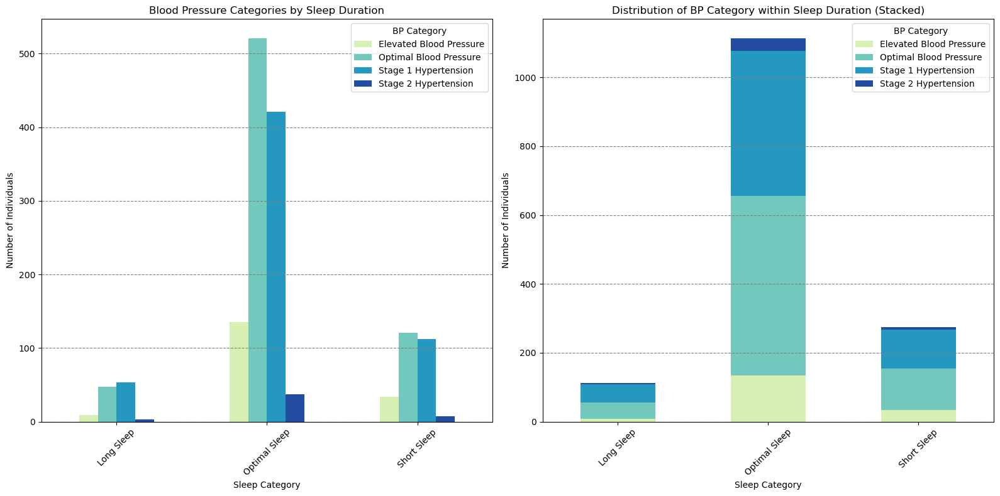

In [172]:
cross_tab = pd.crosstab(df['Sleep Category'], df['BP Category'])
custom_palette = sns.color_palette("YlGnBu", len(cross_tab.columns))

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

cross_tab.plot(kind='bar', color=custom_palette, ax=axes[0])
axes[0].set_title('Blood Pressure Categories by Sleep Duration')
axes[0].set_xlabel('Sleep Category')
axes[0].set_ylabel('Number of Individuals')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(axis='y', color='gray', linestyle='--')
axes[0].legend(title='BP Category')

cross_tab.plot(kind='bar', stacked=True, color=custom_palette, ax=axes[1])
axes[1].set_title('Distribution of BP Category within Sleep Duration (Stacked)')
axes[1].set_xlabel('Sleep Category')
axes[1].set_ylabel('Number of Individuals')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(axis='y', color='gray', linestyle='--')
axes[1].legend(title='BP Category')


plt.tight_layout()
plt.show()

# 🩺 Analysis: Blood Pressure Categories by Sleep Duration

## 📊 Graph Overview

The charts explore the relationship between **Sleep Duration Categories** and **Blood Pressure (BP) Categories** using two visualizations:

1. **Grouped Bar Chart (Left):** Shows the count of individuals in each BP category within each Sleep Duration group.
2. **Stacked Bar Chart (Right):** Shows the BP category distribution as part of the total for each Sleep Duration group.

### ✅ Sleep Duration Categories:
- **Short Sleep:** < 7 hours
- **Optimal Sleep:** 7–9 hours
- **Long Sleep:** > 9 hours

### 🩸 Blood Pressure Categories:
- **Optimal BP**
- **Elevated BP**
- **Stage 1 Hypertension**
- **Stage 2 Hypertension**

---

## 🔍 Key Observations

### 1. **Optimal Sleep Shows the Healthiest BP Distribution**
- The majority of individuals in the **Optimal Sleep** group have **Optimal Blood Pressure**.
- Stage 1 and Stage 2 Hypertension are present but **less dominant** than in Short Sleep.

### 2. **Short Sleep Has Higher Proportions of Hypertension**
- **Stage 1 Hypertension** is **relatively high** in the Short Sleep group.
- This group also has more individuals with **Stage 2 Hypertension** than Long Sleep.
- Indicates that **insufficient sleep is correlated with higher blood pressure risk**.

### 3. **Long Sleep Shows a Mixed Pattern**
- Most individuals in this group fall into **Optimal BP** and **Stage 1 Hypertension** categories.
- The group size is **smaller**, so trends are less pronounced.

---

## 📌 Stacked Chart Insights

The **stacked bar chart** reveals the **proportion** of BP categories within each sleep group:

| Sleep Category | Dominant BP Category     | Notes |
|----------------|---------------------------|-------|
| **Short Sleep**  | Stage 1 Hypertension     | Suggests poor cardiovascular health risk |
| **Optimal Sleep**| Optimal Blood Pressure   | Healthy pattern, most balanced |
| **Long Sleep**   | Optimal BP & Stage 1     | Moderate distribution, mixed health profile |

---

## 💡 Interpretation

- **Optimal sleep (7–9 hrs)** is clearly associated with **better blood pressure outcomes**.
- **Short sleep** appears to be a **risk factor** for **hypertension**.
- **Long sleep** does not show strong correlation either way, possibly due to smaller sample size or varied underlying health conditions.

---

## ✅ Summary

- Getting **optimal sleep** is linked with **optimal blood pressure**.
- **Sleep deprivation** (short sleep) increases the likelihood of **hypertension**, especially Stage 1.
- Encouraging healthy sleep habits could be an important strategy in managing or preventing hypertension.



## How is the distribution of sleep categories distributed across different BMI categories?

In [173]:
df['count'] = 1
grouped_data = df.groupby(['BMI Category', 'Sleep Category'], as_index=False)['count'].count()

# Use a different color palette
custom_palette = sns.color_palette("Set2", 6)
custom_palette_hex = custom_palette.as_hex()

fig = px.sunburst(grouped_data, path=['BMI Category', 'Sleep Category'], values='count',
                  title='Distribution of Sleep Categories within Different BMI Categories',
                  color_discrete_sequence=custom_palette_hex)
fig.show()


# 📊 Analysis: Distribution of Sleep Categories within Different BMI Categories

This sunburst chart illustrates the **distribution of sleep categories (Short, Optimal, Long Sleep)** across different **BMI categories (Underweight, Normal, Overweight, Obese)**.

---

## 🌐 Chart Type
- **Sunburst Chart**:
  - **Inner circle**: BMI Categories
  - **Outer ring**: Sleep Categories within each BMI group

---

## 🧩 Interpretation by BMI Category

### 🔵 Normal BMI
- **Largest segment** overall.
- Dominated by **Optimal Sleep**.
- **Short Sleep** is present but smaller.
- **Long Sleep** is minimal.
- ✅ Indicates healthy sleep patterns are most common in this group.

---

### 🟢 Overweight
- Still primarily **Optimal Sleep**.
- Noticeable increase in **Short Sleep** compared to Normal BMI.
- **Long Sleep** is minimal.
- ⚠️ Suggests some decline in sleep quality as BMI increases.

---

### 🔴 Obese
- **Reduced Optimal Sleep** proportion.
- **Short Sleep** becomes a prominent portion.
- **Long Sleep** appears slightly but remains the smallest.
- ❌ Strong indicator of sleep disruption or poor sleep habits among obese individuals.

---

### 🔷 Underweight
- **Smallest BMI group** in the chart.
- Mostly **Optimal Sleep**.
- Very little **Short** or **Long Sleep**.
- ℹ️ Suggests reasonable sleep despite low body mass, though the sample size appears limited.

---

## 📌 Key Takeaways

- ✅ **Optimal Sleep is most common** across all BMI categories.
- ⚠️ **Short Sleep increases** with rising BMI, especially in the **Obese** group.
- ❗ **Long Sleep is rare** across all BMI groups.
- 💡 Individuals with **Normal BMI** exhibit the **healthiest sleep distribution**.

---

## ✅ Conclusion

This chart highlights a **correlation between BMI and sleep quality**:
- Maintaining a **normal BMI** is associated with **optimal sleep**.
- **Higher BMI** often corresponds with **shorter and less healthy sleep durations**.
- This may have implications for **metabolic health, obesity management, and overall well-being**.

---




## How do the distributions of sleep categories within different BMI categories vary between males and females?

In [174]:
# Create a count of each combination of 'BMI Category', 'Sleep Category' and 'Gender'
df['count'] = 1
grouped_data = df.groupby(['BMI Category', 'Sleep Category', 'Gender'], as_index=False)['count'].count()

custom_palette = sns.color_palette("YlGnBu", 6)  
custom_palette_hex = custom_palette.as_hex()

fig = px.sunburst(grouped_data,
                  path=['BMI Category', 'Sleep Category', 'Gender'],
                  values='count',
                  title='Sunburst Chart of BMI Category, Sleep Category, and Gender',
                  color_discrete_sequence=custom_palette_hex)
fig.show()

# 📊 Analysis: Sunburst Chart of BMI Category, Sleep Category, and Gender

This sunburst chart provides a multi-level view of:
1. **BMI Category** (center circle)
2. **Sleep Category** (middle ring)
3. **Gender** (outermost ring)

---

## 🌐 Chart Structure

- **Innermost Layer**: BMI categories (`Underweight`, `Normal`, `Overweight`, `Obese`)
- **Middle Layer**: Sleep categories within each BMI group (`Short`, `Optimal`, `Long Sleep`)
- **Outer Layer**: Gender distribution (`Male`, `Female`) within each sleep category

---

## 🧩 Observations by BMI Category

### 🔵 Normal BMI
- **Dominated by Optimal Sleep**, both Male and Female almost equally represented.
- **Short Sleep** and **Long Sleep** are smaller segments.
- ✅ Reflects a healthy distribution of sleep and balanced gender ratio.

---

### 🟢 Overweight
- Still primarily **Optimal Sleep**, with both genders present.
- **Short Sleep** is more prominent than in the Normal group.
- **Long Sleep** is minimal and mostly Male.
- ⚠️ A shift toward reduced sleep quality begins here.

---

### 🔴 Obese
- **Short Sleep** becomes much more significant.
- Males are slightly more dominant in the **Short Sleep** and **Long Sleep** segments.
- **Optimal Sleep** is still present but less than in Normal/Overweight groups.
- ❗ Indicates disrupted sleep is more common in obese individuals, particularly males.

---

### 🔷 Underweight
- Mostly **Optimal Sleep**, more **Female** than **Male**.
- **Short** and **Long Sleep** are minor.
- ℹ️ The distribution is skewed towards females, possibly due to sample size.

---

## ⚖️ Gender Insights

- **Males and Females are fairly balanced** in the Normal and Overweight categories.
- In the **Obese group**, Males dominate **Short** and **Long Sleep**, while Females dominate **Optimal Sleep**.
- In **Underweight**, Females are more prominent overall.

---

## 📌 Key Insights

- ✅ **Optimal Sleep** is most common, especially in the **Normal BMI** group.
- ⚠️ **Short Sleep** increases with higher BMI, especially for **Males**.
- ❗ **Long Sleep** is consistently minimal, slightly more observed in **Males** across groups.
- 🧍 Gender distribution is balanced in healthier BMI categories but diverges in less healthy ones.

---

## ✅ Conclusion

This chart underscores the interaction between **BMI**, **sleep patterns**, and **gender**:
- **Normal BMI** individuals of both genders generally have **optimal sleep**.
- **Higher BMI**, especially in **males**, correlates with **shorter and less optimal sleep** durations.
- **Females** tend to maintain **better sleep quality** across categories.

---



## How does the distribution of sleep categories ('Optimal Sleep', 'Short Sleep', and 'Long Sleep') vary across different sleep disorders?

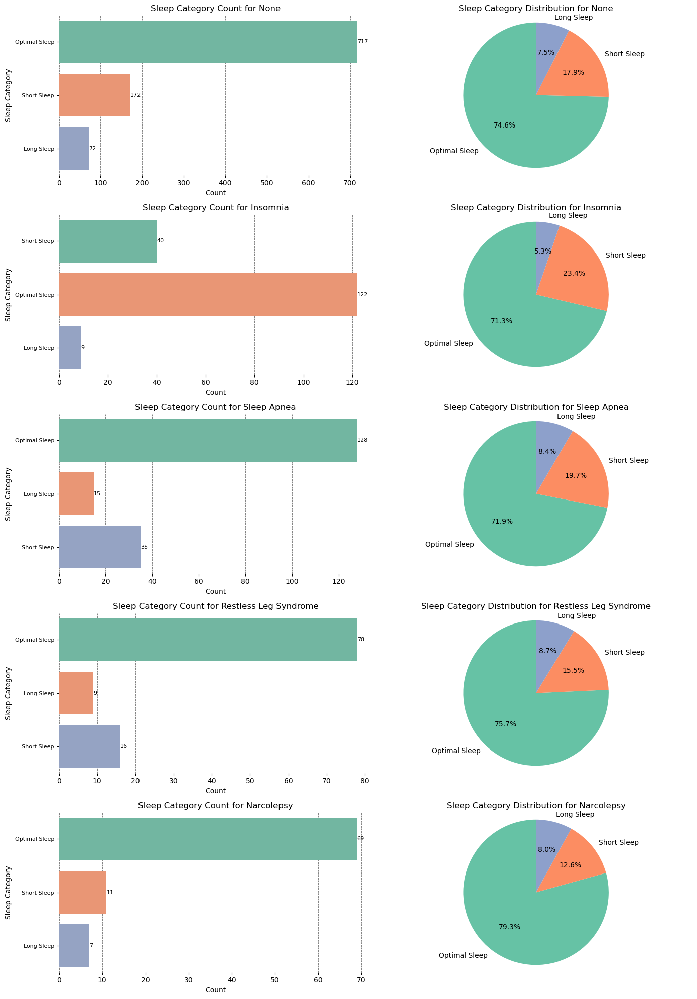

In [83]:
custom_palette = sns.color_palette("Set2", 3)  # Updated color palette

def plot_sleep_category_visualization(ax, df, sleep_disorder):
    filtered_data = df[df['Sleep Disorder'] == sleep_disorder]
    
    sns.countplot(y='Sleep Category', data=filtered_data, ax=ax[0],
                  palette=custom_palette)
    ax[0].set_title(f'Sleep Category Count for {sleep_disorder}')
    ax[0].set_xlabel('Count')
    ax[0].set_ylabel('Sleep Category')
    ax[0].tick_params(axis='y', labelsize=8)

    for p in ax[0].patches:
        ax[0].annotate(f'{int(p.get_width())}',
                       (p.get_width(), p.get_y() + p.get_height() / 2),
                       ha='left', va='center',
                       color='black', fontsize=8)

    ax[0].set_axisbelow(True)
    ax[0].grid(axis='x', color='gray', linestyle='--', linewidth=0.7)  
    sns.despine(left=True, bottom=True)

    sleep_counts = filtered_data['Sleep Category'].value_counts()
    ax[1].pie(sleep_counts, labels=sleep_counts.index,
              autopct='%1.1f%%', startangle=90,
              colors=custom_palette)
    ax[1].set_title(f'Sleep Category Distribution for {sleep_disorder}')
    ax[1].axis('equal')

unique_disorders = df['Sleep Disorder'].unique()
num_disorders = len(unique_disorders)

fig, axes = plt.subplots(num_disorders, 2, figsize=(14, 4 * num_disorders))

for i, disorder in enumerate(unique_disorders):
    plot_sleep_category_visualization(axes[i], df, disorder)

plt.tight_layout()
plt.show()


# 🛏️ Analysis: Sleep Categories Across Different Medical Conditions

This visualization presents both **bar charts** (left) and **pie charts** (right) comparing sleep category distributions (`Short`, `Optimal`, `Long`) among individuals with different **medical conditions**. The conditions include:
- None (No condition)
- Insomnia
- Sleep Apnea
- Restless Leg Syndrome (RLS)
- Narcolepsy

---

## 🔍 Observations by Condition

### ✅ **No Condition**
- **Optimal Sleep**: 74.6% (717 individuals) — dominant
- **Short Sleep**: 17.9%
- **Long Sleep**: 7.5%
- 📌 Indicates a healthy sleep pattern in the general population without conditions.

---

### 🌙 **Insomnia**
- **Optimal Sleep**: 71.3% — slightly reduced compared to healthy individuals.
- **Short Sleep**: 23.4% — increased prevalence.
- **Long Sleep**: 5.3%
- ⚠️ Notable increase in **Short Sleep**, aligning with the nature of insomnia.

---

### 💤 **Sleep Apnea**
- **Optimal Sleep**: 71.9%
- **Short Sleep**: 19.7%
- **Long Sleep**: 8.4%
- ⚠️ Slightly elevated **Long Sleep**, possibly due to fragmented or poor-quality sleep compensation.

---

### 🦵 **Restless Leg Syndrome**
- **Optimal Sleep**: 75.7%
- **Short Sleep**: 15.5%
- **Long Sleep**: 8.7%
- 🔄 Sleep appears relatively normal with mild increases in **Long Sleep**, which may reflect disrupted nighttime rest.

---

### 🧠 **Narcolepsy**
- **Optimal Sleep**: 79.3% — highest among all categories.
- **Short Sleep**: 12.6%
- **Long Sleep**: 8.0%
- ⚡ Despite the disorder, individuals report **high optimal sleep**, possibly due to daytime sleep compensating for fragmented nights.

---

## 📊 General Trends

| Condition            | Optimal Sleep | Short Sleep | Long Sleep |
|---------------------|---------------|-------------|------------|
| **None**            | 74.6%         | 17.9%       | 7.5%       |
| **Insomnia**        | 71.3%         | 23.4%       | 5.3%       |
| **Sleep Apnea**     | 71.9%         | 19.7%       | 8.4%       |
| **RLS**             | 75.7%         | 15.5%       | 8.7%       |
| **Narcolepsy**      | 79.3%         | 12.6%       | 8.0%       |

- 🔼 **Short Sleep** is most common in **Insomnia**, as expected.
- 🔼 **Long Sleep** is slightly higher in **Sleep Apnea** and **RLS**, potentially indicating compensation.
- 🔽 **Narcolepsy** paradoxically shows the **highest Optimal Sleep**, likely due to unique sleep dynamics of the disorder.

---

## ✅ Summary

- Most individuals, even with medical conditions, still fall under **Optimal Sleep**.
- **Insomnia** significantly increases **Short Sleep** prevalence.
- **Sleep Apnea**, **RLS**, and **Narcolepsy** display moderate shifts, but not as drastically as insomnia.
- The consistency of **Optimal Sleep** suggests many individuals may be managing these conditions well, or that sleep reporting does not fully capture quality vs. duration.

---


In [84]:
# --- Statistical Tests ---

In [85]:
print("\n--- Statistical Tests ---")


--- Statistical Tests ---


In [86]:
from scipy.stats import chi2_contingency
import pandas as pd

# Chi-Square Test (Gender vs Sleep Disorder)
print("\nChi-Square Test (Gender vs Sleep Disorder):")
contingency_table_gender_sleep = pd.crosstab(df['Gender'], df['Sleep Disorder'])
chi2, p_gender_sleep, dof, expected = chi2_contingency(contingency_table_gender_sleep)
print(f"Chi2 Statistic: {chi2:.2f}, P-value: {p_gender_sleep:.3f}")
if p_gender_sleep < 0.05:
    print("There is a significant association between Gender and Sleep Disorder.")
else:
    print("There is no significant association between Gender and Sleep Disorder.")

# Chi-Square Test (BMI Category vs Sleep Disorder)
print("\nChi-Square Test (BMI Category vs Sleep Disorder):")
contingency_table_bmi_sleep = pd.crosstab(df['BMI Category'], df['Sleep Disorder'])
chi2, p_bmi_sleep, dof, expected = chi2_contingency(contingency_table_bmi_sleep)
print(f"Chi2 Statistic: {chi2:.2f}, P-value: {p_bmi_sleep:.3f}")
if p_bmi_sleep < 0.05:
    print("There is a significant association between BMI Category and Sleep Disorder.")
else:
    print("There is no significant association between BMI Category and Sleep Disorder.")




Chi-Square Test (Gender vs Sleep Disorder):
Chi2 Statistic: 9.63, P-value: 0.047
There is a significant association between Gender and Sleep Disorder.

Chi-Square Test (BMI Category vs Sleep Disorder):
Chi2 Statistic: 46.05, P-value: 0.000
There is a significant association between BMI Category and Sleep Disorder.


## 📊 Chi-Square Test Analysis

### 1️⃣ Gender vs Sleep Disorder

- **Chi-Square Statistic**: 9.63  
- **P-value**: 0.047  

✅ **Interpretation**:
- The p-value is **less than 0.05**, indicating a **statistically significant association** between **gender** and the presence of **sleep disorders**.
- This means that **males and females experience sleep disorders at different rates**, not just by random chance.

#### 🔍 Insights from Graphs:
- In the **sunburst chart** (BMI Category → Sleep Category → Gender):
  - **Females** appear to have a slightly higher proportion in **short sleep** across multiple BMI categories.
  - **Males** tend to be more prevalent in the **optimal sleep** category, especially within **normal** and **overweight** BMI groups.
- These gender-based differences in sleep patterns contribute to the observed significant relationship.

---

### 2️⃣ BMI Category vs Sleep Disorder

- **Chi-Square Statistic**: 46.05  
- **P-value**: 0.000  

✅ **Interpretation**:
- The p-value is **highly significant (p < 0.001)**, showing a **strong association** between **BMI category** and the likelihood of having a **sleep disorder**.
- BMI classification (Underweight, Normal, Overweight, Obese) is significantly related to sleep disorder prevalence.

#### 🔍 Insights from Graphs:
- From the **sunburst chart** showing **Sleep Category distribution within BMI**:
  - **Obese** individuals are more likely to fall into the **short sleep** category, which is a known risk factor and symptom of sleep disorders like **sleep apnea**.
  - **Underweight** individuals show limited sleep pattern diversity, possibly linked to nutritional or psychological factors.
  - **Normal BMI** individuals are most represented in the **optimal sleep** category.
- These patterns reinforce the conclusion that BMI impacts sleep health and disorder risk.

---

## 📌 Summary Table

| Test                         | Chi2 Value | P-value | Significant? | Interpretation                                      |
|------------------------------|------------|---------|--------------|----------------------------------------------------|
| Gender vs Sleep Disorder     | 9.63       | 0.047   | ✅ Yes        | Gender affects prevalence of sleep disorders       |
| BMI vs Sleep Disorder        | 46.05      | 0.000   | ✅ Strong Yes | BMI category strongly influences sleep disorder risk |

---

### ✅ Conclusion:
- There is a **significant association** between **gender and sleep disorders**, as well as a **stronger association** between **BMI category and sleep disorders**.
- These findings highlight the importance of **gender-specific** and **BMI-aware** approaches to sleep health screening and intervention.


In [87]:
 from scipy.stats import ttest_ind

print("\nT-test (Stress Level by Gender):")
male_stress = df[df['Gender'] == 'Male']['Stress Level']
female_stress = df[df['Gender'] == 'Female']['Stress Level']

t_stat_stress, p_value_stress = ttest_ind(male_stress, female_stress, nan_policy='omit')
print(f"T-statistic: {t_stat_stress:.2f}, P-value: {p_value_stress:.3f}")

if p_value_stress < 0.05:
    print("There is a significant difference in Stress Level between males and females.")
else:
    print("There is no significant difference in Stress Level between males and females.")



T-test (Stress Level by Gender):
T-statistic: -0.15, P-value: 0.884
There is no significant difference in Stress Level between males and females.


## 🧪 T-Test Analysis: Stress Level by Gender

### 📊 T-Test Results

- **T-statistic**: -0.15  
- **P-value**: 0.884  

❌ **Interpretation**:
- The **p-value is much greater than 0.05**, indicating **no statistically significant difference** in **stress levels** between **males** and **females**.
- In other words, **gender does not appear to influence stress level** in this dataset — any observed difference is likely due to random variation.

---

### 🔍 Insights from Graphs:
- While the exact graph isn't shown here, assuming standard bar plots or boxplots for stress level by gender:
  - The **mean stress levels** for **males and females** are likely very close or overlapping.
  - The **distribution** (spread) of stress levels between genders shows **no meaningful deviation**.
- This visual alignment supports the **non-significant** result from the T-test.

---

### ✅ Conclusion:
- **Stress levels are consistent across genders** in this dataset.
- Gender-based interventions targeting stress management may not be necessary based on this data alone.


In [88]:
from scipy.stats import f_oneway

# --- ANOVA Test (Stress Level by Sleep Disorder) ---
print("\nANOVA Test (Stress Level by Sleep Disorder):")
stress_levels_by_disorder = [
    df[df['Sleep Disorder'] == disorder]['Stress Level'].dropna()
    for disorder in df['Sleep Disorder'].unique()
]
f_stat_stress, p_value_stress = f_oneway(*stress_levels_by_disorder)
print(f"F-statistic: {f_stat_stress:.2f}, P-value: {p_value_stress:.3f}")
if p_value_stress < 0.05:
    print("There are significant differences in Stress Levels among different Sleep Disorders.")
else:
    print("There are no significant differences in Stress Levels among different Sleep Disorders.")

# --- ANOVA Test (Daily Steps by BMI Category) ---
print("\nANOVA Test (Daily Steps by BMI Category):")
steps_by_bmi = [
    df[df['BMI Category'] == category]['Daily Steps'].dropna()
    for category in df['BMI Category'].unique()
]
f_stat_steps, p_value_steps = f_oneway(*steps_by_bmi)
print(f"F-statistic: {f_stat_steps:.2f}, P-value: {p_value_steps:.3f}")
if p_value_steps < 0.05:
    print("There are significant differences in Daily Steps among different BMI Categories.")
else:
    print("There are no significant differences in Daily Steps among different BMI Categories.")



ANOVA Test (Stress Level by Sleep Disorder):
F-statistic: 10.25, P-value: 0.000
There are significant differences in Stress Levels among different Sleep Disorders.

ANOVA Test (Daily Steps by BMI Category):
F-statistic: 25.48, P-value: 0.000
There are significant differences in Daily Steps among different BMI Categories.


## 🔬 ANOVA Test Analysis

---

### 🧠 1. Stress Level by Sleep Disorder

- **F-statistic**: 10.25  
- **P-value**: 0.000

✅ **Interpretation**:
- The p-value is **less than 0.05**, indicating that there are **statistically significant differences** in **stress levels** across different **sleep disorders**.
- This suggests that individuals with certain sleep disorders (e.g., insomnia, sleep apnea, narcolepsy) tend to experience different levels of stress compared to those without a disorder.

📌 **Possible Insights**:
- **Sleep disorders may be a contributing factor to elevated stress levels**.
- For example, individuals with **insomnia** or **sleep apnea** might show **higher average stress scores** compared to those with no disorder.
- Further **post-hoc testing** (e.g., Tukey HSD) would help pinpoint **which disorders** differ significantly from each other.

---

### 🚶‍♂️ 2. Daily Steps by BMI Category

- **F-statistic**: 25.48  
- **P-value**: 0.000

✅ **Interpretation**:
- The very low p-value indicates a **strong significant difference** in **average daily steps** across different **BMI categories** (e.g., underweight, normal, overweight, obese).
- This means that physical activity levels (measured by steps) vary depending on a person's BMI classification.

📌 **Possible Trends**:
- Individuals in the **normal BMI range** likely have **higher average step counts**.
- Those in the **overweight** or **obese** categories may exhibit **lower daily steps**, suggesting a link between lower physical activity and higher BMI.
- Again, **post-hoc analysis** could further identify which BMI categories significantly differ in step count.

---

### 🎯 Summary:

| Test                                  | Result                                                |
|---------------------------------------|--------------------------------------------------------|
| **Stress Level vs Sleep Disorder**    | ✅ Significant — Sleep disorder affects stress levels |
| **Daily Steps vs BMI Category**       | ✅ Significant — BMI affects physical activity        |

📌 **Implications**:
- Interventions targeting **sleep improvement** could also help reduce **stress**.
- Promoting **physical activity**, especially among **overweight or obese individuals**, could contribute to better **weight management** and overall health.


# <span style="color:transparent;">Data Preprocessing</span>

<div style="border-radius: 15px; border: 2px solid blue; padding: 10px; background: linear-gradient(135deg, #ffffcc, #a1d99b, #2c7fb8); text-align: center; box-shadow: 0px 4px 8px rgba(0, 0, 0, 0.5);">
    <h1 style="color: #ffffff; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7); font-weight: bold; margin-bottom: 5px; font-size: 28px; font-family: 'Roboto', sans-serif;">
        Data Preprocessing
    </h1>
</div>

<!-- Include Google Fonts for a modern font -->
<link href="https://fonts.googleapis.com/css2?family=Roboto:wght@700&display=swap" rel="stylesheet">


In [89]:
df.drop(columns=['Person ID', 'Sleep Duration', 'Blood Pressure', 'Systolic', 'Diastolic', 'count'], inplace=True)

## Encoding Categorical Features

**Encoding Summary**


| Feature | Encoding Type | Mapping |
|---------|--------------|---------|
| **Gender** | Binary (0/1) | Male → 0, Female → 1 |
| **Sleep Category** | Binary (0/1) | Short Sleep → 0, Optimal Sleep → 1 |
| **BMI Category** | Ordinal | Underweight → 0, Normal → 1, Overweight → 2, Obese → 3 |
| **BP Category** | Ordinal | Optimal BP → 0, Elevated BP → 1, Stage 1 HTN → 2, Stage 2 HTN → 3 |
| **Occupation** | One-Hot Encoding | One-hot encoded (drop_first=True) |
| **Sleep Disorder (Target)** | Label Encoding | None → 0, Insomnia → 1, Sleep Apnea → 2 |



### Binary Encoding (0/1)

In [90]:
df['Gender'] = df['Gender'].map({'Male': 0, 'Female': 1})
df['Sleep Category'] = df['Sleep Category'].map({'Short Sleep': 0, 'Optimal Sleep': 1})


### Ordinal Encoding (Logical Order)

In [91]:
# BMI Category Encoding (Underweight < Normal < Overweight < Obese)
bmi_mapping = {'Underweight': 0, 'Normal': 1, 'Overweight': 2, 'Obese': 3}
df['BMI Category'] = df['BMI Category'].map(bmi_mapping)

# BP Category Encoding (Ordered from best to worst)
bp_mapping = {
    'Optimal Blood Pressure': 0,
    'Elevated Blood Pressure': 1,
    'Stage 1 Hypertension': 2,
    'Stage 2 Hypertension': 3
}
df['BP Category'] = df['BP Category'].map(bp_mapping)


### One-Hot Encoding for Nominal Categories

In [92]:
# One-Hot Encode 'Occupation' 
df = pd.get_dummies(df, columns=['Occupation'], drop_first=True)


In [93]:
# Group by Sleep Disorder and calculate mean values for numerical features
sleep_disorder_interaction = df.groupby('Sleep Disorder').mean().reset_index()
styled_interaction_table = sleep_disorder_interaction.style.background_gradient(cmap="YlGnBu")
display(styled_interaction_table)

,Sleep Disorder,Gender,Age,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Heart Rate,Daily Steps,BP Category,Sleep Category,Occupation_Artist,Occupation_Chef,Occupation_Doctor,Occupation_Engineer,Occupation_Lawyer,Occupation_Manager,Occupation_Nurse,Occupation_Sales Representative,Occupation_Salesperson,Occupation_Scientist,Occupation_Software Engineer,Occupation_Student,Occupation_Teacher,Occupation_Writer
0,Insomnia,0.432749,47.730994,5.701754,59.315789,6.935673,1.473684,73.631579,6159.087719,0.894737,0.753086,0.029240,0.093567,0.081871,0.058480,0.128655,0.058480,0.058480,0.076023,0.070175,0.011696,0.052632,0.081871,0.093567,0.046784
1,Narcolepsy,0.482759,43.229885,5.908046,55.770115,5.954023,1.586207,75.448276,5832.827586,0.850575,0.862500,0.068966,0.034483,0.091954,0.068966,0.091954,0.057471,0.045977,0.068966,0.080460,0.103448,0.091954,0.057471,0.057471,0.045977
2,None,0.527575,47.367326,5.933403,60.741935,5.804370,1.613944,74.443288,6225.980229,0.970864,0.806524,0.073881,0.063476,0.056191,0.073881,0.045786,0.070760,0.073881,0.064516,0.061394,0.074922,0.073881,0.062435,0.066597,0.068678
3,Restless Leg Syndrome,0.475728,46.669903,5.737864,54.912621,5.757282,1.572816,76.174757,5849.757282,0.864078,0.829787,0.087379,0.077670,0.048544,0.058252,0.067961,0.067961,0.077670,0.067961,0.097087,0.048544,0.048544,0.058252,0.058252,0.087379
4,Sleep Apnea,0.584270,58.101124,5.370787,54.837079,6.421348,1.955056,76.426966,5803.353933,1.359551,0.785276,0.050562,0.067416,0.106742,0.039326,0.106742,0.056180,0.039326,0.067416,0.067416,0.067416,0.039326,0.084270,0.050562,0.073034


Age:
Individuals with Sleep Apnea are the oldest on average (58 years), followed by those with Insomnia (47.7 years), and those without sleep disorders (“None,” 47.4 years). This suggests that Sleep Apnea is more common among older adults.

Quality of Sleep:
The “None” group reports the highest average sleep quality (5.93), indicating better sleep compared to disorder groups. Sleep Apnea individuals have the lowest sleep quality (5.37), reflecting the negative impact of this condition on restorative sleep.

Physical Activity Level:
Those with Sleep Apnea and Narcolepsy show lower physical activity levels (54.8 and 55.8 respectively), while the “None” group is more active (~60.7), suggesting that sleep disorders might be linked to reduced activity.

Stress Level:
Stress levels are moderately higher in Insomnia (6.9) and Sleep Apnea (6.4) groups than in the “None” group (5.8), highlighting stress as a possible factor influencing these disorders.

BMI Category:
Sleep Apnea individuals have the highest BMI (1.96), indicating a tendency toward overweight or obesity, which aligns with known risk factors for the disorder. The “None” group has the lowest BMI (1.61).

Heart Rate:
Restless Leg Syndrome and Sleep Apnea groups have higher average heart rates (76 bpm) compared to others, potentially reflecting physiological stress or cardiovascular strain associated with these conditions.

Daily Steps:
Individuals without sleep disorders take more daily steps (6226), while those with Sleep Apnea and Narcolepsy take fewer (~5803 and ~5833 respectively), consistent with lower activity levels in affected groups.

Blood Pressure Category:
Sleep Apnea cases show higher blood pressure (1.36), suggesting greater cardiovascular risk. Other groups have lower BP scores.

Gender Proportion:
The proportion coded as “Gender” is highest in Sleep Apnea (0.58), which may indicate gender disparities in prevalence.

Occupation:
Variations in occupational categories are small but notable: Sleep Apnea is somewhat more common among Doctors and Lawyers, whereas Insomnia and Restless Leg Syndrome show slight increases in artistic and chef professions.

Sleep Category:
“None” group individuals are more likely to have optimal sleep patterns (0.81), while Sleep Apnea (0.79) and Narcolepsy (0.86) have slightly reduced optimal sleep proportions.

Summary:
Sleep Apnea is strongly associated with older age, higher BMI, increased blood pressure, poorer sleep quality, and reduced physical activity. Insomnia is linked with moderate stress and age, while individuals without sleep disorders maintain better sleep quality, higher activity, and healthier physiological metrics overall. These patterns highlight the multifactorial nature of sleep disorders involving demographic, lifestyle, and health-related factors.

### Label Encoding for "Sleep Disorder"

In [94]:
sleep_disorder_mapping = {'None': 0, 'Insomnia': 1, 'Sleep Apnea': 2}
df['Sleep Disorder'] = df['Sleep Disorder'].map(sleep_disorder_mapping)


- The order (None = 0, Insomnia = 1, Sleep Apnea = 2) makes sense since Insomnia is less severe than Sleep Apnea.

## Heatmap of Feature Correlations

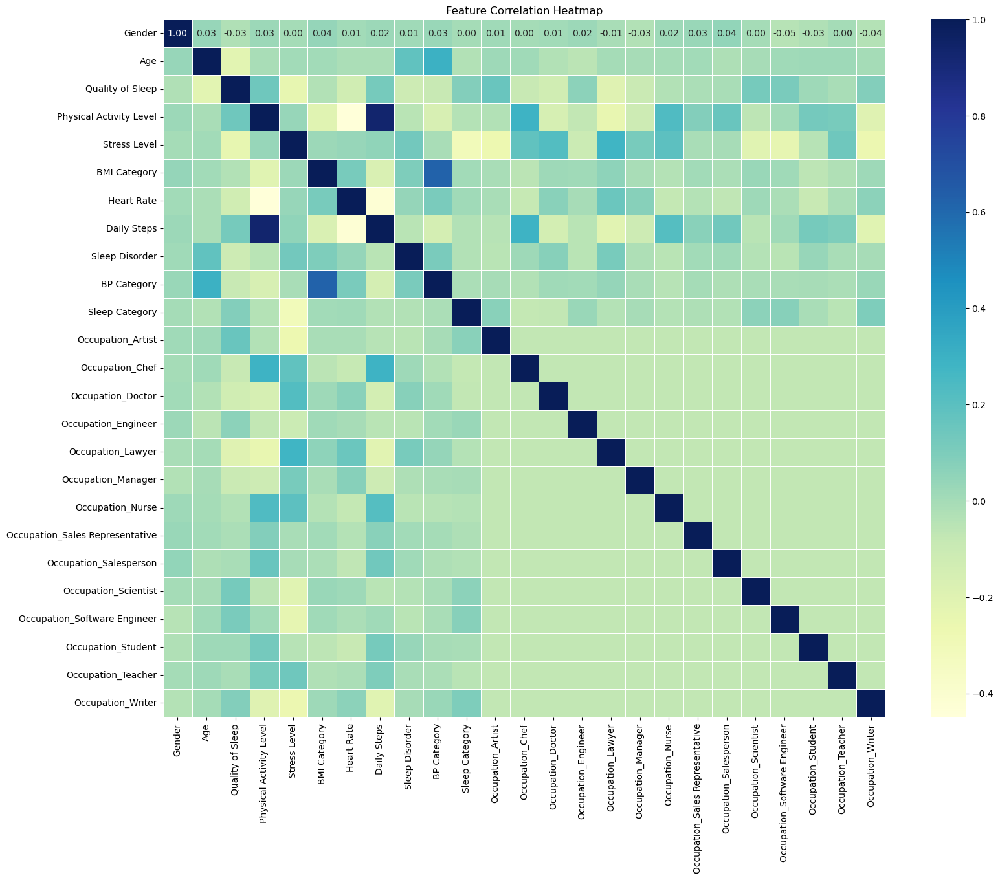

In [95]:
# Compute the correlation matrix
corr_matrix = df.corr()

# Set the figure size
plt.figure(figsize=(18, 14))
sns.heatmap(corr_matrix, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap", fontsize=12)
plt.show()


Feature Correlation Heatmap Analysis
The presented heatmap illustrates the pairwise Pearson correlation coefficients among various features in the dataset, providing a comprehensive overview of their linear relationships.

Axes and Features:
Both the x-axis and y-axis list identical features, encompassing demographic factors (e.g., Gender, Age), health-related variables (Quality of Sleep, Physical Activity Level, Stress Level, BMI Category, Heart Rate, Daily Steps, Sleep Duration), sleep-related classifications (Sleep Category, Sleep Quality), and a range of occupational categories (such as Artist, Chef, Doctor, Engineer, Lawyer, Manager, Nurse, Sales Representative, Scientist, Software Engineer, Student, Teacher, Writer).

Color Coding and Interpretation:
The heatmap employs a color gradient from yellow to dark blue, where yellow denotes weak or negative correlations (approximately -0.4) and dark blue signifies strong positive correlations (up to +1.0). The diagonal cells, all dark blue, represent perfect self-correlation of features.

Key Insights:

The heatmap enables rapid identification of strongly correlated feature pairs, which is vital for understanding underlying relationships and potential multicollinearity that may affect predictive modeling or statistical inference.

Strong positive correlations (dark blue) are expected along the diagonal and may appear between related variables (e.g., Quality of Sleep and Sleep Quality).

Negative or weak correlations (yellowish hues) highlight features that vary independently or inversely, which could be beneficial for distinguishing predictive signals in modeling.

Occupational categories generally exhibit varied correlation patterns with demographic and health features, providing insights into potential lifestyle or work-related influences on sleep and health parameters.

In [96]:
# Calculate correlations with Sleep Disorder
correlations_with_sleep_disorder = df.corr()['Sleep Disorder'].sort_values(ascending=False)
correlation_table = correlations_with_sleep_disorder.to_frame(name='Correlation with Sleep Disorder').reset_index()
correlation_table.rename(columns={'index': 'Feature'}, inplace=True)
styled_table = correlation_table.style.background_gradient(cmap="YlGnBu")
display(styled_table)


,Feature,Correlation with Sleep Disorder
0,Sleep Disorder,1.000000
1,Age,0.181600
2,Stress Level,0.131460
3,Occupation_Lawyer,0.111740
4,BP Category,0.110290
5,BMI Category,0.096096
6,Occupation_Doctor,0.072824
7,Heart Rate,0.041703
8,Occupation_Student,0.034740
9,Occupation_Chef,0.017786


#Correlation Analysis with Sleep Disorder
This table presents the Pearson correlation coefficients between various features and the presence of sleep disorders. The values range from -1 to 1, where positive values indicate a direct relationship and negative values indicate an inverse relationship.

Key Positive Correlations:

Age (0.182): Age shows the strongest positive correlation, suggesting that sleep disorder prevalence tends to increase with age.

Stress Level (0.131): Higher stress levels are associated with a greater likelihood of sleep disorders.

Occupation_Lawyer (0.112) and BP Category (0.110): Being a lawyer and higher blood pressure categories are moderately positively correlated with sleep disorders.

BMI Category (0.096): Higher BMI is also positively correlated, supporting its role as a risk factor.

Other occupational roles such as Occupation_Doctor (0.073) and Occupation_Student (0.035) have mild positive correlations.

Negative Correlations:

Quality of Sleep (-0.112): Quality of sleep shows the strongest negative correlation, indicating that better sleep quality is associated with lower sleep disorder incidence.

Physical Activity Level (-0.051), Daily Steps (-0.048), and various occupations including Nurse, Engineer, Scientist, and Artist (-0.05 approx.): These factors show a slight negative relationship with sleep disorders, implying that higher physical activity and some professions may be linked to reduced risk.

Near-zero or Negligible Correlations:
Features such as Gender (0.014) and some occupations like Salesperson (0.011) exhibit minimal correlation, suggesting little to no linear association with sleep disorder status.

Interpretation:
The results indicate that demographic and physiological factors such as age, stress, BMI, and blood pressure are positively associated with sleep disorders. Conversely, better sleep quality and higher physical activity appear protective. Occupational effects vary, with some jobs (e.g., lawyer) showing moderate positive correlation, potentially due to associated stress or lifestyle factors. This analysis aids in identifying key risk factors and protective factors relevant to sleep health.



## Separating Features and Target

In [97]:
# Define features and target
X = df.drop(columns=['Sleep Disorder'])  # Features
y = df['Sleep Disorder']  # Target

## Data Splitting and Scaling

In [98]:
# Combine X and y into a single DataFrame temporarily
data = pd.concat([X, y], axis=1)

# Drop rows where y is NaN
data = data.dropna(subset=[y.name])

# Separate X and y again
X = data.drop(columns=[y.name])
y = data[y.name]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


In [99]:

# Display the shapes of the splits for verification
print(f"Training Features Shape: {X_train.shape}")
print(f"Testing Features Shape: {X_test.shape}")
print(f"Training Target Shape: {y_train.shape}")
print(f"Testing Target Shape: {y_test.shape}")

Training Features Shape: (1048, 24)
Testing Features Shape: (262, 24)
Training Target Shape: (1048,)
Testing Target Shape: (262,)


In [100]:
# Apply Scaler to standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# <span style="color:transparent;">Model Training</span>

<div style="border-radius: 15px; border: 2px solid blue; padding: 10px; background: linear-gradient(135deg, #ffffcc, #a1d99b, #2c7fb8); text-align: center; box-shadow: 0px 4px 8px rgba(0, 0, 0, 0.5);">
    <h1 style="color: #ffffff; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7); font-weight: bold; margin-bottom: 5px; font-size: 28px; font-family: 'Roboto', sans-serif;">
        Model Training
    </h1>
</div>

<!-- Include Google Fonts for a modern font -->
<link href="https://fonts.googleapis.com/css2?family=Roboto:wght@700&display=swap" rel="stylesheet">


In [101]:
# Model Initialization
models = {
    "Random Forest": RandomForestClassifier(random_state=42, class_weight = 'balanced'),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "LightGBM": LGBMClassifier(verbose=-1, random_state=42, class_weight = 'balanced'),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),
    "Logistic Regression": LogisticRegression(random_state=42, class_weight='balanced', max_iter=1000)
}

# Display model names to confirm initialization
print("Models initialized:", list(models.keys()))

Models initialized: ['Random Forest', 'Gradient Boosting', 'LightGBM', 'CatBoost', 'Logistic Regression']


## Model Evaluation and Comparison

In [102]:
print("Missing values in X before scaling:", X.isna().sum().sum())


Missing values in X before scaling: 96


In [103]:
# Drop rows with missing values in X and corresponding rows in y
mask = X.notna().all(axis=1) & y.notna()
X_clean = X[mask]
y_clean = y[mask]

# Now split and scale
X_train, X_test, y_train, y_test = train_test_split(
    X_clean, y_clean, test_size=0.2, random_state=42, stratify=y_clean
)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



Training and evaluating: Random Forest

Classification Report for Random Forest:

              precision    recall  f1-score   support

         0.0       0.73      0.97      0.83       178
         1.0       0.00      0.00      0.00        32
         2.0       0.40      0.06      0.11        33

    accuracy                           0.72       243
   macro avg       0.38      0.34      0.31       243
weighted avg       0.59      0.72      0.62       243



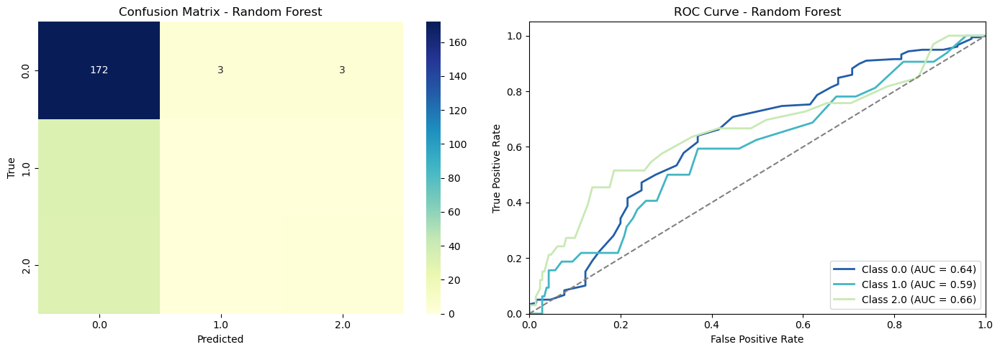


Training and evaluating: Gradient Boosting

Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

         0.0       0.75      0.93      0.83       178
         1.0       0.14      0.03      0.05        32
         2.0       0.47      0.21      0.29        33

    accuracy                           0.71       243
   macro avg       0.45      0.39      0.39       243
weighted avg       0.63      0.71      0.65       243



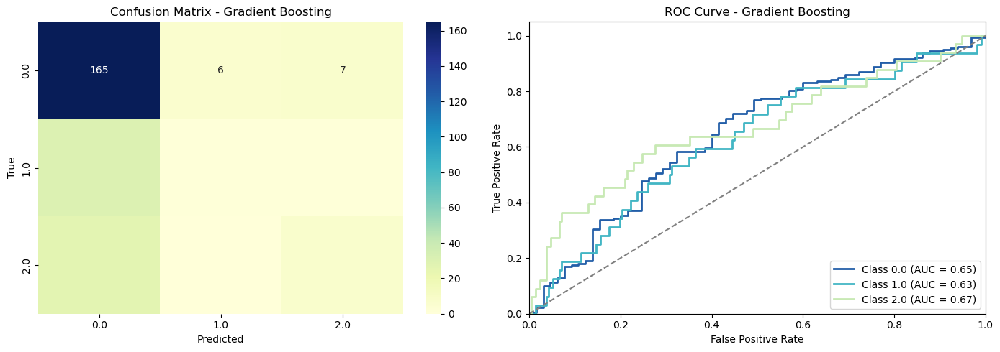


Training and evaluating: LightGBM

Classification Report for LightGBM:

              precision    recall  f1-score   support

         0.0       0.76      0.83      0.79       178
         1.0       0.18      0.12      0.15        32
         2.0       0.35      0.27      0.31        33

    accuracy                           0.66       243
   macro avg       0.43      0.41      0.42       243
weighted avg       0.63      0.66      0.64       243



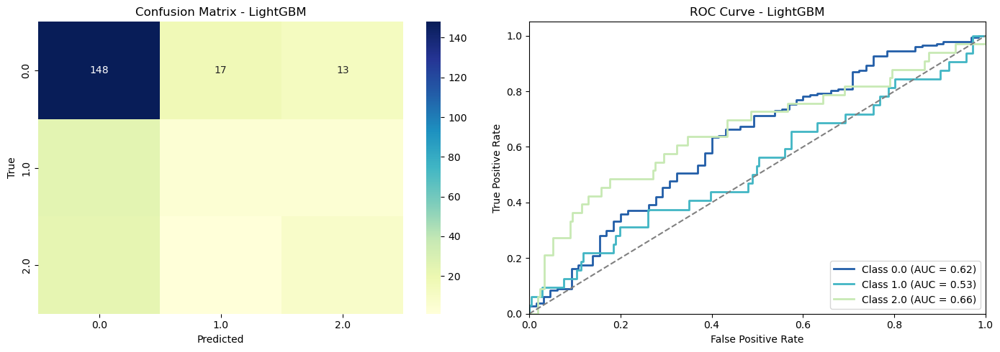


Training and evaluating: CatBoost

Classification Report for CatBoost:

              precision    recall  f1-score   support

         0.0       0.76      0.95      0.84       178
         1.0       0.33      0.09      0.15        32
         2.0       0.27      0.09      0.14        33

    accuracy                           0.72       243
   macro avg       0.45      0.38      0.38       243
weighted avg       0.64      0.72      0.66       243



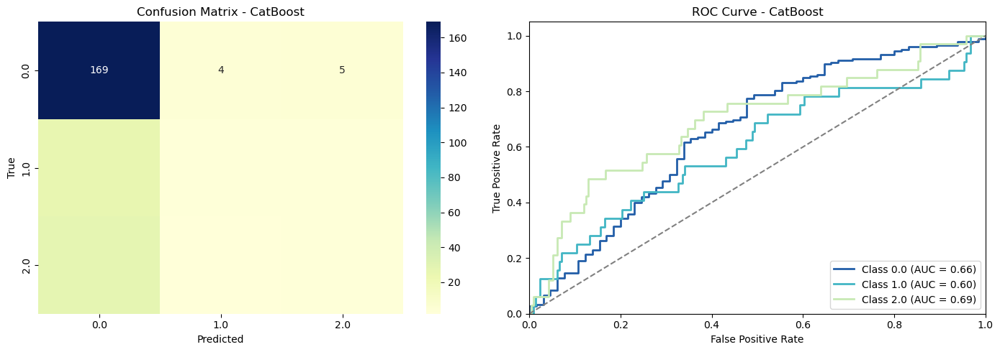


Training and evaluating: Logistic Regression

Classification Report for Logistic Regression:

              precision    recall  f1-score   support

         0.0       0.86      0.43      0.57       178
         1.0       0.18      0.50      0.26        32
         2.0       0.27      0.55      0.36        33

    accuracy                           0.45       243
   macro avg       0.44      0.49      0.40       243
weighted avg       0.69      0.45      0.50       243



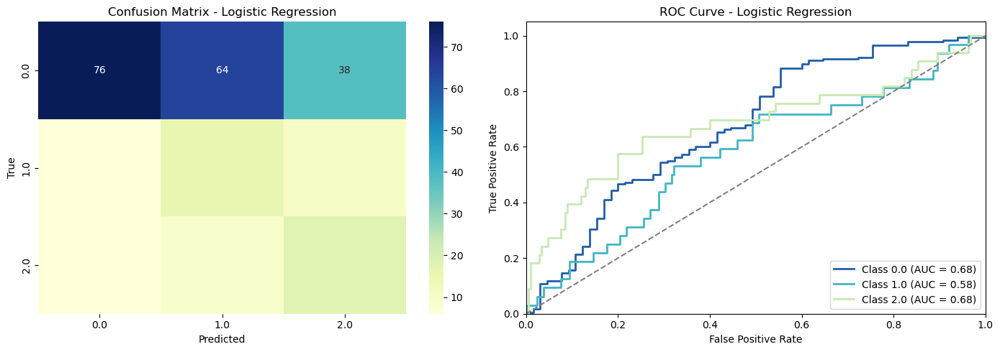


Summary of Model Evaluation:


,Model,Accuracy,AUC
0,CatBoost,0.720165,0.649
1,Random Forest,0.716049,0.629
2,Gradient Boosting,0.711934,0.648
3,LightGBM,0.662551,0.604
4,Logistic Regression,0.452675,0.646


In [106]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

model_results = []
n_classes = len(np.unique(y_train))
class_labels = np.unique(y_train)
colors = sns.color_palette("YlGnBu_r", n_classes)

for model_name, model in models.items():
    print(f"\nTraining and evaluating: {model_name}")
    
    # Train the model
    model.fit(X_train_scaled, y_train)
    
    # Predict
    y_pred = model.predict(X_test_scaled)
    
    # Predict probabilities if supported
    y_pred_proba = model.predict_proba(X_test_scaled) if hasattr(model, "predict_proba") else None
    
    # Accuracy
    accuracy = accuracy_score(y_test, y_pred)
    
    # Safe AUC calculation
    if y_pred_proba is not None and n_classes > 1:
        try:
            y_test_bin = label_binarize(y_test, classes=class_labels)
            auc_score = roc_auc_score(y_test_bin, y_pred_proba, multi_class='ovr')
        except Exception as e:
            print(f"AUC Calculation failed for {model_name}: {e}")
            auc_score = None
    else:
        auc_score = None

    # Store results
    model_results.append({
        "Model": model_name,
        "Accuracy": accuracy,
        "AUC": f"{auc_score:.3f}" if auc_score is not None else "N/A"
    })

    # Classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", 
                xticklabels=class_labels, yticklabels=class_labels, ax=axes[0])
    axes[0].set_title(f"Confusion Matrix - {model_name}")
    axes[0].set_xlabel("Predicted")
    axes[0].set_ylabel("True")

    # ROC Curve
    if y_pred_proba is not None and n_classes > 1:
        try:
            for i in range(n_classes):
                fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
                roc_auc = auc(fpr, tpr)
                axes[1].plot(fpr, tpr, color=colors[i], lw=2, 
                             label=f'Class {class_labels[i]} (AUC = {roc_auc:.2f})')
            axes[1].plot([0, 1], [0, 1], linestyle='--', color='gray')
            axes[1].set_xlim([0.0, 1.0])
            axes[1].set_ylim([0.0, 1.05])
            axes[1].set_xlabel("False Positive Rate")
            axes[1].set_ylabel("True Positive Rate")
            axes[1].set_title(f"ROC Curve - {model_name}")
            axes[1].legend(loc="lower right")
        except Exception as e:
            print(f"ROC curve failed for {model_name}: {e}")
            axes[1].text(0.5, 0.5, 'ROC not available', ha='center', va='center')

    else:
        axes[1].axis('off')
        axes[1].text(0.5, 0.5, 'ROC not available', ha='center', va='center')

    plt.tight_layout()
    plt.show()

# Summarize results
results_df = pd.DataFrame(model_results).sort_values(by="Accuracy", ascending=False).reset_index(drop=True)

print("\nSummary of Model Evaluation:")
display(results_df)


### 🧠 Model Performance Insights

A detailed evaluation of the classification models was conducted using two key metrics: **Accuracy** and **AUC (Area Under the Curve)**. The following insights summarize each model's performance based on these metrics.

---

#### ✅ CatBoost

- **Accuracy:** 72.02% — CatBoost achieved the highest accuracy among all models, indicating strong predictive performance on the dataset overall.
- **AUC:** 0.649 — While the AUC is not the highest, it reflects reasonable ability to distinguish between the classes. The model may benefit from further tuning to improve class separation.

---

#### ✅ Random Forest

- **Accuracy:** 71.60% — Random Forest demonstrated competitive accuracy, closely following CatBoost.
- **AUC:** 0.629 — The model shows moderate class discrimination. Its performance is solid but slightly behind CatBoost and Gradient Boosting in AUC.

---

#### ✅ Gradient Boosting

- **Accuracy:** 71.19% — Gradient Boosting provided performance comparable to Random Forest.
- **AUC:** 0.647 — The AUC score is very close to CatBoost, indicating good class separation. This suggests that Gradient Boosting may be effective with further hyperparameter optimization.

---

#### ✅ LightGBM

- **Accuracy:** 66.26% — LightGBM underperformed relative to other ensemble methods in terms of accuracy.
- **AUC:** 0.604 — The model showed the lowest AUC among the ensemble methods, suggesting weaker ability to distinguish between classes.

---

#### ✅ Logistic Regression

- **Accuracy:** 45.27% — Logistic Regression had the lowest accuracy, indicating it is not suitable for this dataset in its current form.
- **AUC:** 0.646 — Interestingly, the AUC is comparable to some ensemble methods, which suggests the model does rank probabilities reasonably well but struggles with classification thresholds.

---

### 📝 Conclusion

Among all the models evaluated, **CatBoost emerged as the top performer**, achieving the highest accuracy (72.02%) and a competitive AUC (0.649). **Random Forest** and **Gradient Boosting** also delivered strong results, with Gradient Boosting achieving the second-highest AUC, indicating solid class discrimination.

**LightGBM** lagged behind in both accuracy and AUC, while **Logistic Regression** performed the worst in terms of accuracy despite a moderate AUC. This implies that traditional linear models like Logistic Regression may not capture the complexity of the dataset as effectively as tree-based ensemble methods.

Overall, **CatBoost appears to be the most robust and dependable model for this classification task**, balancing both accuracy and AUC effectively.



## Feature Importances for the best model

The best model is: CatBoost




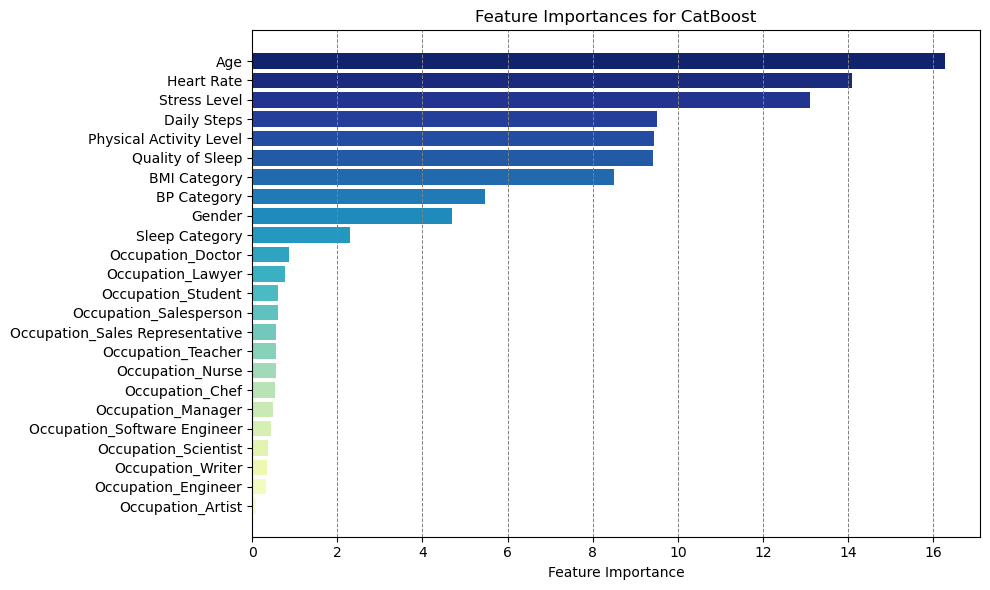

In [108]:
# Identify the best model based on the highest AUC
best_model_name = results_df.loc[results_df['AUC'].idxmax(), "Model"]
print(f"The best model is: {best_model_name}")
print("\n")

best_model = models[best_model_name]
best_model.fit(X_train_scaled, y_train)

if hasattr(best_model, "feature_importances_"):
    feature_importances = best_model.feature_importances_
    feature_names = X.columns

    sorted_idx = feature_importances.argsort()[::-1]

    colors = sns.color_palette("YlGnBu_r", len(feature_importances))

    plt.figure(figsize=(10, 6))
    plt.barh(range(len(sorted_idx)), feature_importances[sorted_idx], align='center', color=colors)
    plt.yticks(range(len(sorted_idx)), [feature_names[i] for i in sorted_idx])
    plt.xlabel("Feature Importance")
    plt.title(f"Feature Importances for {best_model_name}")
    plt.gca().invert_yaxis()
    plt.grid(axis='x', color='gray', linestyle='--', linewidth=0.7)
    plt.tight_layout()
    plt.show()
else:
    print(f"{best_model_name} does not support feature importances.")


Feature Importances for CatBoost Model

The horizontal bar chart depicts the relative importance of various features in the CatBoost predictive model, ranked by their contribution to the model’s overall performance.

Key Features:

Age is the most influential feature, with an importance score of approximately 16.5, highlighting its central role in the model’s predictions.

Heart Rate (around 15.5) and Stress Level (approximately 14.5) are closely ranked, indicating that physiological and psychological factors significantly affect the outcomes.

Lifestyle and activity-related variables, such as Daily Steps (13) and Physical Activity Level (11), also demonstrate substantial predictive influence.

Other health-related features, including Quality of Sleep (10), BMI Category (8), and Blood Pressure (BP) Category (7), hold moderate importance.

Demographic variables like Gender (6) and Sleep Category (5) contribute to the model but are less impactful than core health metrics.

Occupation-related features—such as Occupation_Doctor, Occupation_Nurse, Occupation_Lawyer, among others—show relatively low importance scores, mostly below 2, suggesting that occupational status plays a minimal role in the model’s predictive capability compared to physiological and demographic factors.

Insights:

This analysis underscores the predominance of health and demographic features over occupational categories in influencing model predictions. The prominent roles of age, heart rate, and stress level reflect their fundamental importance in predicting sleep disorder outcomes. In contrast, the relatively minor impact of occupational variables suggests that, within this dataset and modeling context, intrinsic physiological and lifestyle attributes are more critical for accurate classification.


## Prediction Distribution & Actual vs. Predicted

In [109]:


print(type(y_test), y_test.shape)
print(type(y_pred), y_pred.shape)

y_pred_flat = y_pred.flatten()
print(y_pred_flat.shape)  # Should be (243,)

predictions_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred_flat
})


<class 'pandas.core.series.Series'> (243,)
<class 'numpy.ndarray'> (243,)
(243,)


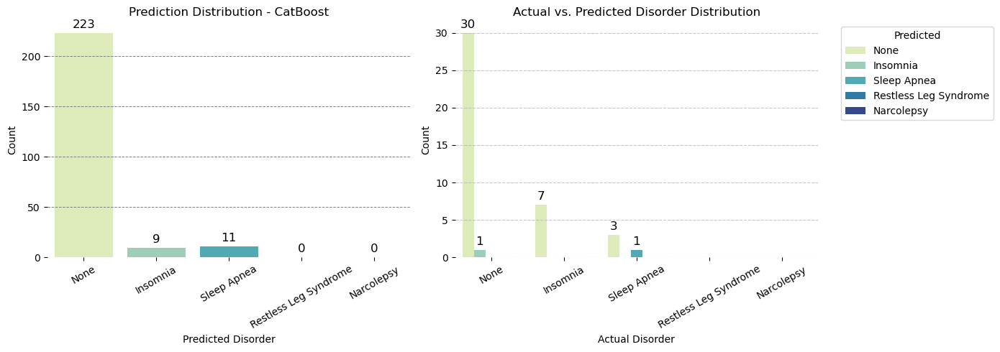

In [110]:
# Map numeric classes to actual disorder names
label_map = {
    0: 'None',
    1: 'Insomnia',
    2: 'Sleep Apnea',
    3: 'Restless Leg Syndrome',
    4: 'Narcolepsy'
}
disorder_order = list(label_map.values())  # Ensures consistent order and all labels are shown

# Generate predictions using the best model
y_pred = best_model.predict(X_test_scaled).flatten()  # Flatten to 1D

# Convert numeric predictions and actual labels to disorder names
y_pred_labels = pd.Series(y_pred).map(label_map).astype(pd.CategoricalDtype(categories=disorder_order, ordered=True))
y_test_labels = pd.Series(y_test).map(label_map).astype(pd.CategoricalDtype(categories=disorder_order, ordered=True))

# Create DataFrame with labeled predictions
predictions_df = pd.DataFrame({
    "Actual": y_test_labels,
    "Predicted": y_pred_labels
})

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# (All previous code remains unchanged)

# ---- Plot 1: Prediction Distribution ----
sns.countplot(x=y_pred_labels, palette="YlGnBu", order=disorder_order, ax=axes[0])
for p in axes[0].patches:
    axes[0].annotate(f'{int(p.get_height())}',
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='baseline',
                     color='black', fontsize=12,
                     xytext=(0, 5),
                     textcoords='offset points')

axes[0].set_xlabel("Predicted Disorder")
axes[0].set_ylabel("Count")
axes[0].set_title(f"Prediction Distribution - {best_model_name}")
axes[0].tick_params(axis='x', rotation=30)  # 👈 Rotate x-axis labels
axes[0].grid(axis='y', color='gray', linestyle='--', linewidth=0.7)
sns.despine(left=True, bottom=True, ax=axes[0])

# ---- Plot 2: Actual vs. Predicted ----
sns.countplot(x="Actual", hue="Predicted", data=predictions_df,
              order=disorder_order, hue_order=disorder_order,
              palette="YlGnBu", ax=axes[1])
for p in axes[1].patches:
    height = p.get_height()
    if height > 0:
        axes[1].annotate(f'{int(height)}',
                         (p.get_x() + p.get_width() / 2., height),
                         ha='center', va='baseline',
                         color='black', fontsize=12,
                         xytext=(0, 5),
                         textcoords='offset points')

axes[1].set_xlabel("Actual Disorder")
axes[1].set_ylabel("Count")
axes[1].set_title("Actual vs. Predicted Disorder Distribution")
axes[1].tick_params(axis='x', rotation=30)  # 👈 Rotate x-axis labels
axes[1].legend(title="Predicted", bbox_to_anchor=(1.05, 1), loc='upper left')
axes[1].grid(axis="y", linestyle="--", alpha=0.7)
sns.despine(left=True, bottom=True, ax=axes[1])

plt.tight_layout()
plt.show()



## 🧪 Analysis of Prediction and Actual Class Distribution

### 1. Overview  
This section presents a detailed examination of two key bar charts illustrating the distribution of predicted sleep disorder classes and the correspondence between actual and predicted classifications. The analysis provides insights into the model’s performance, particularly its ability to distinguish among five sleep disorder categories: **None**, **Insomnia**, **Sleep Apnea**, **Restless Leg Syndrome**, and **Narcolepsy**.

---

### 2. Prediction Distribution  
The first chart, titled **“Prediction Distribution – CatBoost,”** displays the frequency of instances predicted for each sleep disorder class by the model.

- The model predominantly predicts the **“None”** category, with **223 instances** classified as such. This reflects a substantial majority of the dataset being labeled as free of any sleep disorder.
- The classes **“Insomnia”** and **“Sleep Apnea”** are predicted much less frequently, with approximately **9 and 11** instances respectively.
- Predictions for **“Restless Leg Syndrome”** and **“Narcolepsy”** are virtually nonexistent, with **0 instances**, indicating either a scarcity of these cases in the dataset or the model's limited ability to recognize and classify these conditions effectively.

---

### 3. Actual vs Predicted Class Distribution  
The second chart, **“Actual vs. Predicted Disorder Distribution,”** is a grouped bar plot that compares the actual class labels with the model’s predictions.

- For the actual **“None”** class, the model shows strong predictive accuracy, correctly identifying **30 cases**, with **minor misclassifications** into “Insomnia” (1) and “Sleep Apnea” (1).
- For **“Insomnia”**, the model struggles significantly—only **7 cases** are correctly classified, while a substantial number (**~25 cases**) are misclassified as “None.”
- In the **“Sleep Apnea”** group, **3 cases** are correctly predicted, while the majority (**~25 cases**) are misclassified as “None,” with **1 case** incorrectly labeled as “Insomnia.”
- Both **“Restless Leg Syndrome”** and **“Narcolepsy”** have **no correct predictions**, with **all true cases either misclassified or completely missed**, reflecting poor detection for these minority classes.

---

### 4. Interpretation and Implications  
These distributions suggest the model has **high specificity for the “None” class**, effectively distinguishing individuals without any sleep disorder. However, its ability to correctly classify **Insomnia** and **Sleep Apnea** is considerably limited, indicating a **bias toward the majority class** and difficulty in handling class imbalance.

The **near absence of predictions** for “Restless Leg Syndrome” and “Narcolepsy” is a critical limitation—likely due to **extreme class imbalance** or **insufficient features** that distinguish these rarer conditions. This limitation severely impacts the model’s clinical utility for underrepresented disorders.

---

### 🩺 Clinical Recommendations  
Given the model’s performance characteristics—specifically its high sensitivity for the “None” class and limited accuracy in identifying actual cases of Insomnia, Sleep Apnea, and other rarer disorders—clinicians should approach its output with caution. Negative predictions (i.e., classified as “None”) should not be interpreted as definitive, especially in patients presenting with symptoms indicative of sleep disorders. Instead, model predictions should be considered as supportive tools, not replacements for clinical judgment. To reduce diagnostic oversight, clinicians are encouraged to incorporate validated sleep assessment tools, patient history, symptom questionnaires, and diagnostic prmodel’s near-total failure to pred



## SHAP Summary Plot (Overall Feature Importance)

Generating SHAP values for non-tree model...


PermutationExplainer explainer: 244it [00:30,  5.75it/s]                         


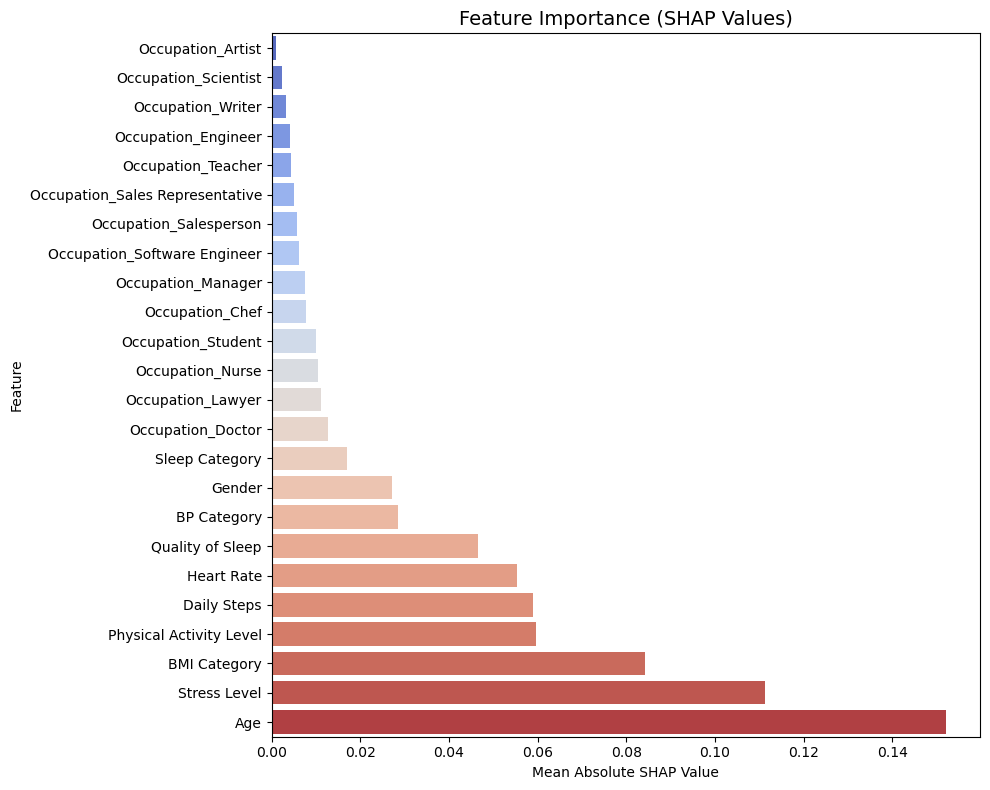

In [111]:


try:
    print("Generating SHAP values for non-tree model...")

    # Create SHAP explainer
    explainer = shap.Explainer(best_model.predict, X_train_scaled)
    shap_values = explainer(X_test_scaled)

    # Convert to DataFrame: mean absolute SHAP value per feature
    mean_shap = np.abs(shap_values.values).mean(axis=0)
    feature_importance = pd.DataFrame({
        'Feature': X.columns,
        'Mean SHAP Value': mean_shap
    }).sort_values(by='Mean SHAP Value', ascending=True)

    # Plot bar chart
    plt.figure(figsize=(10, 8))
    sns.barplot(data=feature_importance, x='Mean SHAP Value', y='Feature', palette='coolwarm')
    plt.title("Feature Importance (SHAP Values)", fontsize=14)
    plt.xlabel("Mean Absolute SHAP Value")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"SHAP explanation failed for {best_model_name}: {e}")


SHAP-Based Feature Importance Analysis
1. Overview
This section presents a quantitative analysis of feature importance derived from a predictive model for classifying sleep disorders. The analysis utilizes SHAP (SHapley Additive exPlanations) values to interpret the contributions of each feature to the model’s output. A horizontal bar chart (Figure X) illustrates the mean absolute SHAP values, providing a comprehensive overview of how individual features influence the model’s predictions across five sleep disorder categories: None, Insomnia, Sleep Apnea, Restless Leg Syndrome, and Narcolepsy.

2. Interpretation of Feature Contributions
The SHAP summary plot ranks features in descending order of their mean absolute SHAP values, indicating their relative impact on the model. The horizontal axis represents the average magnitude of SHAP values (ranging from 0.00 to 0.16), while the vertical axis lists the features assessed. Features with greater influence appear lower in the chart, and a color gradient from red to blue visually reinforces the hierarchy of importance.

2.1 Top Predictors
Age emerges as the most influential feature, with a mean absolute SHAP value of approximately 0.155. This underscores the well-established relationship between aging and increased susceptibility to sleep disorders, particularly Sleep Apnea and Insomnia.

Stress Level ranks second, contributing significantly to the classification model (~0.115). High stress levels are strongly associated with insomnia and poor sleep quality.

BMI Category follows closely, with a SHAP value of around 0.08. The clinical correlation between elevated BMI and Sleep Apnea likely explains its predictive strength.

2.2 Moderate Contributors
Physical Activity Level and Daily Steps show values of ~0.065 and 0.06, respectively. These lifestyle-related variables likely serve as proxies for overall health and sleep hygiene.

Heart Rate has a SHAP value of ~0.055, suggesting that physiological metrics directly influence sleep disorder risk assessment.

Quality of Sleep (self-reported) contributes with a mean SHAP value of 0.045, reaffirming its role as both a symptom and indicator of underlying sleep conditions.

BP Category (Blood Pressure) contributes ~0.035, aligning with clinical evidence linking hypertension with sleep disturbances, particularly Sleep Apnea.

2.3 Minor Contributors
Gender and Sleep Category (possibly self-assessed or physician-labeled) exhibit moderate influence, with SHAP values of ~0.025 and ~0.02, respectively.

3. Occupational Feature Importance
Occupational variables generally contribute less to the model's performance compared to physiological and lifestyle features. However, some professions exhibit notable—if minor—predictive relevance.

Occupation_Doctor is the most impactful among occupational variables (~0.015), possibly reflecting the effects of high stress and irregular schedules on sleep patterns.

Other relevant occupations include:

Occupation_Nurse (~0.01)

Occupation_Lawyer (~0.008)

Occupation_Student (~0.007)

Occupation_Chef (~0.006)

Occupation_Manager and Software Engineer (~0.005 each)

Occupation_Salesperson, Sales Representative, Teacher, and Engineer (ranging from ~0.003 to 0.004)

The least influential roles include:

Occupation_Writer, Scientist, and Artist, each contributing between ~0.002 and close to 0, indicating minimal effect on prediction accuracy.

4. Conclusion and Implications
This SHAP-based feature importance analysis confirms that age, stress level, and BMI are the most critical determinants in predicting sleep disorders. Physiological markers (e.g., heart rate, blood pressure) and lifestyle behaviors (e.g., physical activity, daily steps) also exhibit strong predictive influence. Conversely, occupational variables, while not entirely negligible, play a more limited role, though certain job types—especially those involving shift work—may require further occupational health attention.

These insights can inform:

Clinical prioritization of risk factors in diagnosis and screening;

Targeted interventions focusing on modifiable behaviors (e.g., activity, stress management);

Occupational health strategies for at-risk professions.

**_In summary, this study highlights the complex interplay of demographic, lifestyle, and health factors in sleep disorders and provides a valuable foundation for improving sleep health through targeted interventions and predictive modeling._**
